In [ ]:
# Instalacion de librerías externas
!pip install pandas
!pip install numpy
!pip install matplotlib
!pip install scikit-learn
!pip install pyarrow
!pip install seaborn

# POLYNOMIAL REGRESSION MODEL

In [1]:
#Abrir csv del conjunto de datos limpio

import pandas as pd
df_copy_2_interpolado_copy_sin_outliers = pd.read_csv('dataset_limpio.csv', sep=",")
df_copy_2_interpolado_copy_sin_outliers

,Año,Mes,Día,Hora,Minuto,A_Optimal - Power DC [W],Ambient Temperature [ºC],Global Radiation [W/m2],Ultraviolet [W/m2],Wind Velocity [m/s],Wind Direction [º]
0,2014,1,1,7,41,2.850946,9.700000,7.131149,0.751824,0.700000,275.333840
1,2014,1,1,7,42,1.674750,9.700000,7.040442,0.781930,0.666667,278.503060
2,2014,1,1,7,43,1.732500,9.700000,6.594407,0.813929,0.616667,284.667120
3,2014,1,1,7,44,1.790250,9.700000,7.358729,0.849919,0.666667,278.666660
4,2014,1,1,7,45,1.831500,9.700000,7.470711,0.886891,0.633333,272.666360
...,...,...,...,...,...,...,...,...,...,...,...
616369,2016,12,29,17,27,0.855000,15.200000,6.546354,0.836866,0.683333,90.670424
616370,2016,12,29,17,28,0.855000,15.200000,6.481665,0.801994,0.833333,87.849608
616371,2016,12,29,17,29,0.855000,15.200000,4.924317,0.766211,0.883333,84.505200
616372,2016,12,29,17,30,0.855000,15.133332,5.480427,0.740643,0.783333,72.378000


In [2]:
df_copy_2_interpolado_copy_sin_outliers.isna().sum()

Año                         0
Mes                         0
Día                         0
Hora                        0
Minuto                      0
A_Optimal - Power DC [W]    0
Ambient Temperature [ºC]    0
Global Radiation [W/m2]     0
Ultraviolet [W/m2]          0
Wind Velocity [m/s]         0
Wind Direction [º]          0
dtype: int64

## 1. Particionado datos ML

In [3]:
#PARTICIONADO DEL CONJUNTO DE DATOS: DF
# Construcción de una función que realice el particionado completo

from sklearn.model_selection import train_test_split

def train_val_test_split(df, rstate=42, shuffle=True, stratify=None):
    strat = df[stratify] if stratify else None
    train_set, test_set = train_test_split(df, test_size=0.4, random_state=rstate, shuffle=shuffle, stratify=strat)
    strat = test_set[stratify] if stratify else None
    val_set, test_set = train_test_split(test_set, test_size=0.5, random_state=rstate, shuffle=shuffle, stratify=strat)
    return (train_set, val_set, test_set)

df = df_copy_2_interpolado_copy_sin_outliers
# División del conjunto de datos 
train_set, val_set, test_set = train_val_test_split(df)

print("Longitud del conjunto de datos:", len(df))
print("Longitud del Training Set:", len(train_set))
print("Longitud del Validation Set:", len(val_set))
print("Longitud del Test Set:", len(test_set))

Longitud del conjunto de datos: 616374
Longitud del Training Set: 369824
Longitud del Validation Set: 123275
Longitud del Test Set: 123275


In [4]:
def preparar_datos(df, prototipo):
    """
    Función para preparar datos de entrenamiento, validación y prueba
    para diferentes prototipos.
    
    Parámetros:
    df (DataFrame): El conjunto de datos de entrada.
    prototipo (str): El prototipo ('A' o 'B').
        
    Retorna:
    tuple: DataFrames X_train, y_train, X_val, y_val, X_test, y_test.
    """
    columna_objetivo = f"{prototipo}_Optimal - Power DC [W]"
    
    X_train = train_set.drop(columna_objetivo, axis=1)
    y_train = train_set[columna_objetivo].copy()
    
    X_val = val_set.drop(columna_objetivo, axis=1)
    y_val = val_set[columna_objetivo].copy()
    
    X_test = test_set.drop(columna_objetivo, axis=1)
    y_test = test_set[columna_objetivo].copy()
    
    return X_train, y_train, X_val, y_val, X_test, y_test

prototipo_seleccionado = 'A'
# Preparar los datos basados en la selección del usuario
X_train, y_train, X_val, y_val, X_test, y_test = preparar_datos(df, prototipo_seleccionado)

X_train = X_train.sort_index()
y_train = y_train.sort_index()
X_val = X_val.sort_index()
y_val = y_val.sort_index()
X_test = X_test.sort_index()
y_test= y_test.sort_index()

Text(0.5, 1.0, 'Pruebas - A_Optimal - Power DC [W]')

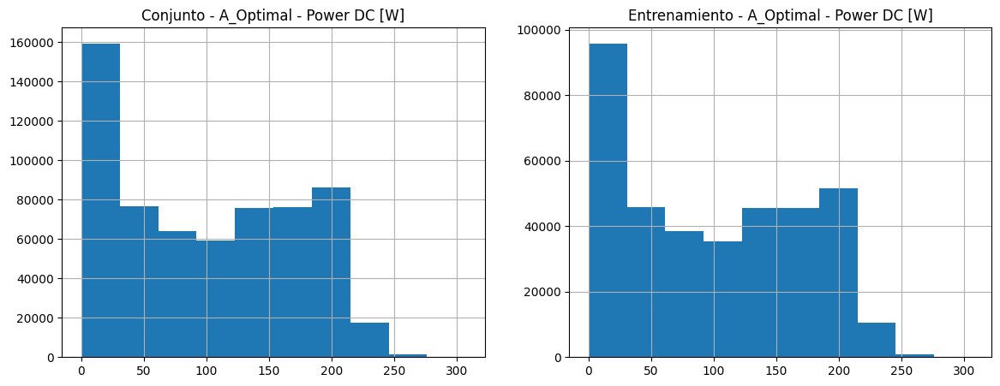

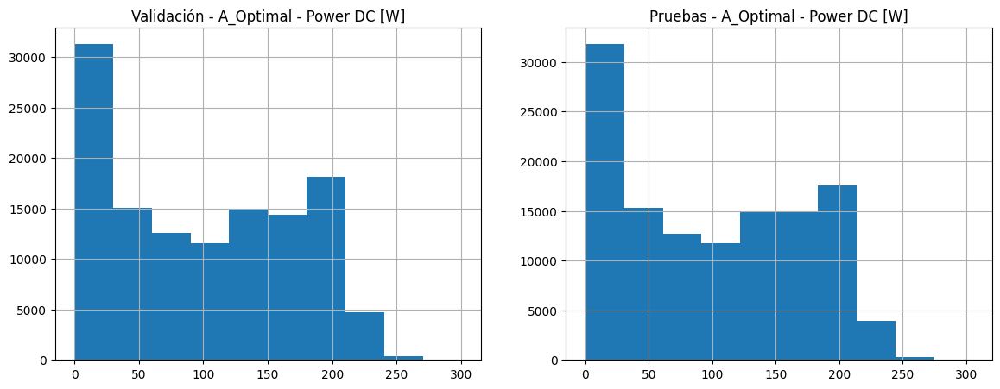

In [5]:
import matplotlib.pyplot as plt
# Comprobación de que stratify mantiene la proporcion de la característica en los conjuntos
plt.figure(figsize=(14, 5))

plt.subplot(121)
df["A_Optimal - Power DC [W]"].hist()
plt.title('Conjunto - A_Optimal - Power DC [W]')

plt.subplot(122)
train_set["A_Optimal - Power DC [W]"].hist()
plt.title('Entrenamiento - A_Optimal - Power DC [W]')


plt.figure(figsize=(14, 5))
plt.subplot(121)
val_set["A_Optimal - Power DC [W]"].hist()
plt.title('Validación - A_Optimal - Power DC [W]')

plt.subplot(122)
test_set["A_Optimal - Power DC [W]"].hist()
plt.title('Pruebas - A_Optimal - Power DC [W]')

#se mantiene la proporción.

# 2. Copia de conjunto particionado

In [6]:
X_train_copy = X_train.copy()
X_val_copy = X_val.copy()
X_test_copy = X_test.copy()

y_train_copy = y_train.copy()
y_val_copy = y_val.copy()
y_test_copy = y_test.copy()

# 3. Escalado de los datos
Se escalarán los datos y se comprobará si escalando se obtienen mejores resultados

In [7]:
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()

X_train_scaled = scaler.fit_transform(X_train_copy)
y_train_scaled = scaler.fit_transform(y_train_copy.values.reshape(-1, 1))
X_val_scaled = scaler.fit_transform(X_val_copy)
y_val_scaled = scaler.fit_transform(y_val_copy.values.reshape(-1, 1))
X_test_scaled = scaler.fit_transform(X_test_copy)
y_test_scaled = scaler.fit_transform(y_test_copy.values.reshape(-1, 1))

# Transformación a un DataFrame de Pandas
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train_copy.columns, index=X_train_copy.index)
y_train_scaled = pd.DataFrame(y_train_scaled, columns=['A_Optimal - Power DC [W]'], index=y_train_copy.index)
X_val_scaled = pd.DataFrame(X_val_scaled, columns=X_val_copy.columns, index=X_val_copy.index)
y_val_scaled = pd.DataFrame(y_val_scaled, columns=['A_Optimal - Power DC [W]'], index=y_val_copy.index)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test_copy.columns, index=X_test_copy.index)
y_test_scaled = pd.DataFrame(y_test_scaled, columns=['A_Optimal - Power DC [W]'], index=y_test_copy.index)


#DATOS ESCALADOS
# Copiamos el conjunto de datos para no alterar el original
X_train_scaled_copy = X_train_scaled.copy()
y_train_scaled_copy = y_train_scaled.copy()
X_val_scaled_copy = X_val_scaled.copy()
y_val_scaled_copy = y_val_scaled.copy()
X_test_scaled_copy = X_test_scaled.copy()
y_test_scaled_copy = y_test_scaled.copy()
X_train_scaled_copy   #CONJUNTO DE DATOS DE ENTRENAMIENTO ESCALADOS X_train 
X_train_scaled_copy.isna().any()
y_train_scaled_copy   #CONJUNTO DE DATOS DE ENTRENAMIENTO ESCALADOS y_train
y_train_scaled_copy.isna().any()

A_Optimal - Power DC [W]    False
dtype: bool

Tanto los datos escalados como los sin escalar NO tienen valores nulos (NAN)

# 4. Algoritmo: Polynomial Regression

In [9]:
# https://scikit-learn.org/1.5/modules/linear_model.html#polynomial-regression-extending-linear-models-with-basis-functions


 `make_pipeline` simplifica el proceso de encadenar transformaciones y modelos, asegurando que las transformaciones se apliquen de manera consistente durante el entrenamiento y la predicción.

## Entrenamiento


In [8]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
import time

# Crear los modelos de regresión polinómica
grado_2 = 2 
modelo_polinomico_2 = make_pipeline(PolynomialFeatures(grado_2), LinearRegression())
modelo_polinomico_2_scaled = make_pipeline(PolynomialFeatures(grado_2), LinearRegression())
grado_3 = 3  
modelo_polinomico_3 = make_pipeline(PolynomialFeatures(grado_3), LinearRegression())
modelo_polinomico_3_scaled = make_pipeline(PolynomialFeatures(grado_3), LinearRegression())
grado_4 = 4  
modelo_polinomico_4 = make_pipeline(PolynomialFeatures(grado_4), LinearRegression())
modelo_polinomico_4_scaled = make_pipeline(PolynomialFeatures(grado_4), LinearRegression())

# Medir el tiempo de ajuste para el modelo polinómico de grado 2
start_time = time.time()
modelo_polinomico_2.fit(X_train_copy, y_train_copy)
end_time = time.time()
print(f"Tiempo de ajuste para el modelo polinómico de grado 2: {end_time - start_time:.2f} segundos")
start_time = time.time()
modelo_polinomico_2_scaled.fit(X_train_scaled_copy, y_train_scaled_copy)
end_time = time.time()
print(f"Tiempo de ajuste para el modelo polinómico de grado 2 escalado: {end_time - start_time:.2f} segundos")

# Medir el tiempo de ajuste para el modelo polinómico de grado 3
start_time = time.time()
modelo_polinomico_3.fit(X_train_copy, y_train_copy)
end_time = time.time()
print(f"Tiempo de ajuste para el modelo polinómico de grado 3: {end_time - start_time:.2f} segundos")
start_time = time.time()
modelo_polinomico_3_scaled.fit(X_train_scaled_copy, y_train_scaled_copy)
end_time = time.time()
print(f"Tiempo de ajuste para el modelo polinómico de grado 3 escalado: {end_time - start_time:.2f} segundos")

# Medir el tiempo de ajuste para el modelo polinómico de grado 4
start_time = time.time()
modelo_polinomico_4.fit(X_train_copy, y_train_copy)
end_time = time.time()
print(f"Tiempo de ajuste para el modelo polinómico de grado 4: {end_time - start_time:.2f} segundos")
# Medir el tiempo de ajuste para el modelo polinómico de grado 4
start_time = time.time()
modelo_polinomico_4_scaled.fit(X_train_scaled_copy, y_train_scaled_copy)
end_time = time.time()
print(f"Tiempo de ajuste para el modelo polinómico de grado 4 scaled: {end_time - start_time:.2f} segundos")


Tiempo de ajuste para el modelo polinómico de grado 2: 3.62 segundos
Tiempo de ajuste para el modelo polinómico de grado 2 escalado: 3.78 segundos
Tiempo de ajuste para el modelo polinómico de grado 3: 16.01 segundos
Tiempo de ajuste para el modelo polinómico de grado 3 escalado: 16.07 segundos
Tiempo de ajuste para el modelo polinómico de grado 4: 72.31 segundos
Tiempo de ajuste para el modelo polinómico de grado 4 scaled: 60.64 segundos


## Predicción

In [9]:
start_time = time.time()
# # Predecir con el conjunto de datos de entrenamiento
y_train_pred_polinomico_2 = modelo_polinomico_2.predict(X_train_copy)
# # Predecir con el conjunto de datos de validación
y_val_pred_polinomico_2 = modelo_polinomico_2.predict(X_val_copy)
# # Predecir con el conjunto de datos de test
y_test_pred_polinomico_2 = modelo_polinomico_2.predict(X_test_copy)
end_time = time.time()
print(f"Tiempo de predicción para el modelo polinómico de grado 2: {end_time - start_time:.2f} segundos")

start_time = time.time()
y_train_pred_polinomico_2_scaled = modelo_polinomico_2_scaled.predict(X_train_scaled_copy)
y_val_pred_polinomico_2_scaled = modelo_polinomico_2_scaled.predict(X_val_scaled_copy)
y_test_pred_polinomico_2_scaled = modelo_polinomico_2_scaled.predict(X_test_scaled_copy)
end_time = time.time()
print(f"Tiempo de predicción para el modelo polinómico de grado 2 escalado: {end_time - start_time:.2f} segundos")

start_time = time.time()
y_train_pred_polinomico_3 = modelo_polinomico_3.predict(X_train_copy)
y_val_pred_polinomico_3 = modelo_polinomico_3.predict(X_val_copy)
y_test_pred_polinomico_3 = modelo_polinomico_3.predict(X_test_copy)
end_time = time.time()
print(f"Tiempo de predicción para el modelo polinómico de grado 3: {end_time - start_time:.2f} segundos")

start_time = time.time()
y_train_pred_polinomico_3_scaled = modelo_polinomico_3_scaled.predict(X_train_scaled_copy)
y_val_pred_polinomico_3_scaled = modelo_polinomico_3_scaled.predict(X_val_scaled_copy)
y_test_pred_polinomico_3_scaled = modelo_polinomico_3_scaled.predict(X_test_scaled_copy)
end_time = time.time()
print(f"Tiempo de predicción para el modelo polinómico de grado 3 escalado: {end_time - start_time:.2f} segundos")

start_time = time.time()
y_train_pred_polinomico_4 = modelo_polinomico_4.predict(X_train_copy)
y_val_pred_polinomico_4 = modelo_polinomico_4.predict(X_val_copy)
y_test_pred_polinomico_4 = modelo_polinomico_4.predict(X_test_copy)
end_time = time.time()
print(f"Tiempo de predicción para el modelo polinómico de grado 4: {end_time - start_time:.2f} segundos")

start_time = time.time()
y_train_pred_polinomico_4_scaled = modelo_polinomico_4_scaled.predict(X_train_scaled_copy)
y_val_pred_polinomico_4_scaled = modelo_polinomico_4_scaled.predict(X_val_scaled_copy)
y_test_pred_polinomico_4_scaled = modelo_polinomico_4_scaled.predict(X_test_scaled_copy)
end_time = time.time()
print(f"Tiempo de predicción para el modelo polinómico de grado 4 escalado: {end_time - start_time:.2f} segundos")

# Invertir la escala de las predicciones
y_train_pred_polinomico_2_scaled = scaler.inverse_transform(y_train_pred_polinomico_2_scaled)
y_val_pred_polinomico_2_scaled = scaler.inverse_transform(y_val_pred_polinomico_2_scaled)
y_test_pred_polinomico_2_scaled = scaler.inverse_transform(y_test_pred_polinomico_2_scaled)

y_train_pred_polinomico_3_scaled = scaler.inverse_transform(y_train_pred_polinomico_3_scaled)
y_val_pred_polinomico_3_scaled = scaler.inverse_transform(y_val_pred_polinomico_3_scaled)
y_test_pred_polinomico_3_scaled = scaler.inverse_transform(y_test_pred_polinomico_3_scaled)

y_train_pred_polinomico_4_scaled = scaler.inverse_transform(y_train_pred_polinomico_4_scaled)
y_val_pred_polinomico_4_scaled = scaler.inverse_transform(y_val_pred_polinomico_4_scaled)
y_test_pred_polinomico_4_scaled = scaler.inverse_transform(y_test_pred_polinomico_4_scaled)

Tiempo de predicción para el modelo polinómico de grado 2: 1.19 segundos
Tiempo de predicción para el modelo polinómico de grado 2 escalado: 1.11 segundos
Tiempo de predicción para el modelo polinómico de grado 3: 3.78 segundos
Tiempo de predicción para el modelo polinómico de grado 3 escalado: 3.28 segundos
Tiempo de predicción para el modelo polinómico de grado 4: 11.75 segundos
Tiempo de predicción para el modelo polinómico de grado 4 escalado: 11.58 segundos


## Métricas

In [10]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Evaluar el modelo con los conjuntos de datos de entrenamiento, validación y test
mse_train_polinomico_2 = mean_squared_error(y_train_pred_polinomico_2, y_train_copy)
r2_train_polinomico_2 = r2_score(y_train_pred_polinomico_2, y_train_copy)
mae_train_polinomico_2 = mean_absolute_error(y_train_pred_polinomico_2, y_train_copy)

mse_val_polinomico_2 = mean_squared_error(y_val_pred_polinomico_2, y_val_copy)
r2_val_polinomico_2 = r2_score(y_val_pred_polinomico_2, y_val_copy)
mae_val_polinomico_2 = mean_absolute_error(y_val_pred_polinomico_2, y_val_copy)

mse_test_polinomico_2 = mean_squared_error(y_test_pred_polinomico_2, y_test_copy)
r2_test_polinomico_2 = r2_score(y_test_pred_polinomico_2, y_test_copy)
mae_test_polinomico_2 = mean_absolute_error(y_test_pred_polinomico_2, y_test_copy)

print('Grado 2:')
print(f"Error Cuadrático Medio (MSE) Train Set: {mse_train_polinomico_2:.2f}")
print(f"Coeficiente de Determinación (R^2) Train Set: {r2_train_polinomico_2:.2f}")
print(f"MAE Train Set: {mae_train_polinomico_2:.2f}")
print(f"Error Cuadrático Medio (MSE) Validation Set: {mse_val_polinomico_2:.2f}")
print(f"Coeficiente de Determinación (R^2) Validation Set: {r2_val_polinomico_2:.2f}")
print(f"MAE Validation Set: {mae_val_polinomico_2:.2f}")
print(f"Error Cuadrático Medio (MSE) Test Set: {mse_test_polinomico_2:.2f}")
print(f"Coeficiente de Determinación (R^2) Test Set: {r2_test_polinomico_2:.2f}")
print(f"MAE Test Set: {mae_test_polinomico_2:.2f}")

# Evaluar el modelo con los conjuntos de datos de entrenamiento, validación y test
mse_train_polinomico_2_scaled = mean_squared_error(y_train_pred_polinomico_2_scaled, y_train_scaled_copy)
r2_train_polinomico_2_scaled = r2_score(y_train_pred_polinomico_2_scaled, y_train_scaled_copy)
mae_train_polinomico_2_scaled = mean_absolute_error(y_train_pred_polinomico_2_scaled, y_train_scaled_copy)

mse_val_polinomico_2_scaled = mean_squared_error(y_val_pred_polinomico_2_scaled, y_val_scaled_copy)
r2_val_polinomico_2_scaled = r2_score(y_val_pred_polinomico_2_scaled, y_val_copy)
mae_val_polinomico_2_scaled = mean_absolute_error(y_val_pred_polinomico_2_scaled, y_val_scaled_copy)

mse_test_polinomico_2_scaled = mean_squared_error(y_test_pred_polinomico_2_scaled, y_test_scaled_copy)
r2_test_polinomico_2_scaled = r2_score(y_test_pred_polinomico_2_scaled, y_test_scaled_copy)
mae_test_polinomico_2_scaled = mean_absolute_error(y_test_pred_polinomico_2_scaled, y_test_scaled_copy)

print('Grado 2 escalado:')
print(f"Error Cuadrático Medio (MSE) Train Set: {mse_train_polinomico_2_scaled:.2f}")
print(f"Coeficiente de Determinación (R^2) Train Set: {r2_train_polinomico_2_scaled:.2f}")
print(f"MAE Train Set: {mae_train_polinomico_2_scaled:.2f}")
print(f"Error Cuadrático Medio (MSE) Validation Set: {mse_val_polinomico_2_scaled:.2f}")
print(f"Coeficiente de Determinación (R^2) Validation Set: {r2_val_polinomico_2_scaled:.2f}")
print(f"MAE Validation Set: {mae_val_polinomico_2_scaled:.2f}")
print(f"Error Cuadrático Medio (MSE) Test Set: {mse_test_polinomico_2_scaled:.2f}")
print(f"Coeficiente de Determinación (R^2) Test Set: {r2_test_polinomico_2_scaled:.2f}")
print(f"MAE Test Set: {mae_test_polinomico_2_scaled:.2f}")


# Evaluar el modelo con los conjuntos de datos de entrenamiento, validación y test
mse_train_polinomico_3 = mean_squared_error(y_train_pred_polinomico_3, y_train_copy)
r2_train_polinomico_3 = r2_score(y_train_pred_polinomico_3, y_train_copy)
mae_train_polinomico_3 = mean_absolute_error(y_train_pred_polinomico_3, y_train_copy)

mse_val_polinomico_3 = mean_squared_error(y_val_pred_polinomico_3, y_val_copy)
r2_val_polinomico_3 = r2_score(y_val_pred_polinomico_3, y_val_copy)
mae_val_polinomico_3 = mean_absolute_error(y_val_pred_polinomico_3, y_val_copy)

mse_test_polinomico_3 = mean_squared_error(y_test_pred_polinomico_3, y_test_copy)
r2_test_polinomico_3 = r2_score(y_test_pred_polinomico_3, y_test_copy)
mae_test_polinomico_3 = mean_absolute_error(y_test_pred_polinomico_3, y_test_copy)

print('Grado 3:')
print(f"Error Cuadrático Medio (MSE) Train Set: {mse_train_polinomico_3:.2f}")
print(f"Coeficiente de Determinación (R^2) Train Set: {r2_train_polinomico_3:.2f}")
print(f"MAE Train Set: {mae_train_polinomico_3:.2f}")
print(f"Error Cuadrático Medio (MSE) Validation Set: {mse_val_polinomico_3:.2f}")
print(f"Coeficiente de Determinación (R^2) Validation Set: {r2_val_polinomico_3:.2f}")
print(f"MAE Validation Set: {mae_val_polinomico_3:.2f}")
print(f"Error Cuadrático Medio (MSE) Test Set: {mse_test_polinomico_3:.2f}")
print(f"Coeficiente de Determinación (R^2) Test Set: {r2_test_polinomico_3:.2f}")
print(f"MAE Test Set: {mae_test_polinomico_3:.2f}")

# Evaluar el modelo con los conjuntos de datos de entrenamiento, validación y test
mse_train_polinomico_3_scaled = mean_squared_error(y_train_pred_polinomico_3_scaled, y_train_scaled_copy)
r2_train_polinomico_3_scaled = r2_score(y_train_pred_polinomico_3_scaled, y_train_scaled_copy)
mae_train_polinomico_3_scaled = mean_absolute_error(y_train_pred_polinomico_3_scaled, y_train_scaled_copy)

mse_val_polinomico_3_scaled = mean_squared_error(y_val_pred_polinomico_3_scaled, y_val_scaled_copy)
r2_val_polinomico_3_scaled = r2_score(y_val_pred_polinomico_3_scaled, y_val_copy)
mae_val_polinomico_3_scaled = mean_absolute_error(y_val_pred_polinomico_3_scaled, y_val_scaled_copy)

mse_test_polinomico_3_scaled = mean_squared_error(y_test_pred_polinomico_3_scaled, y_test_scaled_copy)
r2_test_polinomico_3_scaled = r2_score(y_test_pred_polinomico_3_scaled, y_test_scaled_copy)
mae_test_polinomico_3_scaled = mean_absolute_error(y_test_pred_polinomico_3_scaled, y_test_scaled_copy)

print('Grado 3 escalado:')
print(f"Error Cuadrático Medio (MSE) Train Set: {mse_train_polinomico_3_scaled:.2f}")
print(f"Coeficiente de Determinación (R^2) Train Set: {r2_train_polinomico_3_scaled:.2f}")
print(f"MAE Train Set: {mae_train_polinomico_3_scaled:.2f}")
print(f"Error Cuadrático Medio (MSE) Validation Set: {mse_val_polinomico_3_scaled:.2f}")
print(f"Coeficiente de Determinación (R^2) Validation Set: {r2_val_polinomico_3_scaled:.2f}")
print(f"MAE Validation Set: {mae_val_polinomico_3_scaled:.2f}")
print(f"Error Cuadrático Medio (MSE) Test Set: {mse_test_polinomico_3_scaled:.2f}")
print(f"Coeficiente de Determinación (R^2) Test Set: {r2_test_polinomico_3_scaled:.2f}")
print(f"MAE Test Set: {mae_test_polinomico_3_scaled:.2f}")


# Evaluar el modelo con los conjuntos de datos de entrenamiento, validación y test
mse_train_polinomico_4 = mean_squared_error(y_train_pred_polinomico_4, y_train_copy)
r2_train_polinomico_4 = r2_score(y_train_pred_polinomico_4, y_train_copy)
mae_train_polinomico_4 = mean_absolute_error(y_train_pred_polinomico_4, y_train_copy)

mse_val_polinomico_4 = mean_squared_error(y_val_pred_polinomico_4, y_val_copy)
r2_val_polinomico_4 = r2_score(y_val_pred_polinomico_4, y_val_copy)
mae_val_polinomico_4 = mean_absolute_error(y_val_pred_polinomico_4, y_val_copy)

mse_test_polinomico_4 = mean_squared_error(y_test_pred_polinomico_4, y_test_copy)
r2_test_polinomico_4 = r2_score(y_test_pred_polinomico_4, y_test_copy)
mae_test_polinomico_4 = mean_absolute_error(y_test_pred_polinomico_4, y_test_copy)

print('Grado 4:')
print(f"Error Cuadrático Medio (MSE) Train Set: {mse_train_polinomico_4:.2f}")
print(f"Coeficiente de Determinación (R^2) Train Set: {r2_train_polinomico_4:.2f}")
print(f"MAE Train Set: {mae_train_polinomico_4:.2f}")
print(f"Error Cuadrático Medio (MSE) Validation Set: {mse_val_polinomico_4:.2f}")
print(f"Coeficiente de Determinación (R^2) Validation Set: {r2_val_polinomico_4:.2f}")
print(f"MAE Validation Set: {mae_val_polinomico_4:.2f}")
print(f"Error Cuadrático Medio (MSE) Test Set: {mse_test_polinomico_4:.2f}")
print(f"Coeficiente de Determinación (R^2) Test Set: {r2_test_polinomico_4:.2f}")
print(f"MAE Test Set: {mae_test_polinomico_4:.2f}")

# Evaluar el modelo con los conjuntos de datos de entrenamiento, validación y test
mse_train_polinomico_4_scaled = mean_squared_error(y_train_pred_polinomico_4_scaled, y_train_scaled_copy)
r2_train_polinomico_4_scaled = r2_score(y_train_pred_polinomico_4_scaled, y_train_scaled_copy)
mae_train_polinomico_4_scaled = mean_absolute_error(y_train_pred_polinomico_4_scaled, y_train_scaled_copy)

mse_val_polinomico_4_scaled = mean_squared_error(y_val_pred_polinomico_4_scaled, y_val_scaled_copy)
r2_val_polinomico_4_scaled = r2_score(y_val_pred_polinomico_4_scaled, y_val_copy)
mae_val_polinomico_4_scaled = mean_absolute_error(y_val_pred_polinomico_4_scaled, y_val_scaled_copy)

mse_test_polinomico_4_scaled = mean_squared_error(y_test_pred_polinomico_4_scaled, y_test_scaled_copy)
r2_test_polinomico_4_scaled = r2_score(y_test_pred_polinomico_4_scaled, y_test_scaled_copy)
mae_test_polinomico_4_scaled = mean_absolute_error(y_test_pred_polinomico_4_scaled, y_test_scaled_copy)

print('Grado 4 escalado:')
print(f"Error Cuadrático Medio (MSE) Train Set: {mse_train_polinomico_4_scaled:.2f}")
print(f"Coeficiente de Determinación (R^2) Train Set: {r2_train_polinomico_4_scaled:.2f}")
print(f"MAE Train Set: {mae_train_polinomico_4_scaled:.2f}")
print(f"Error Cuadrático Medio (MSE) Validation Set: {mse_val_polinomico_4_scaled:.2f}")
print(f"Coeficiente de Determinación (R^2) Validation Set: {r2_val_polinomico_4_scaled:.2f}")
print(f"MAE Validation Set: {mae_val_polinomico_4_scaled:.2f}")
print(f"Error Cuadrático Medio (MSE) Test Set: {mse_test_polinomico_4_scaled:.2f}")
print(f"Coeficiente de Determinación (R^2) Test Set: {r2_test_polinomico_4_scaled:.2f}")
print(f"MAE Test Set: {mae_test_polinomico_4_scaled:.2f}")

Grado 2:
Error Cuadrático Medio (MSE) Train Set: 884.92
Coeficiente de Determinación (R^2) Train Set: 0.79
MAE Train Set: 20.82
Error Cuadrático Medio (MSE) Validation Set: 883.89
Coeficiente de Determinación (R^2) Validation Set: 0.79
MAE Validation Set: 20.81
Error Cuadrático Medio (MSE) Test Set: 879.87
Coeficiente de Determinación (R^2) Test Set: 0.79
MAE Test Set: 20.79
Grado 2 escalado:
Error Cuadrático Medio (MSE) Train Set: 14089.92
Coeficiente de Determinación (R^2) Train Set: -2.28
MAE Train Set: 101.35
Error Cuadrático Medio (MSE) Validation Set: 14054.21
Coeficiente de Determinación (R^2) Validation Set: 0.80
MAE Validation Set: 101.14
Error Cuadrático Medio (MSE) Test Set: 14093.56
Coeficiente de Determinación (R^2) Test Set: -2.28
MAE Test Set: 101.35
Grado 3:
Error Cuadrático Medio (MSE) Train Set: 578.80
Coeficiente de Determinación (R^2) Train Set: 0.87
MAE Train Set: 14.58
Error Cuadrático Medio (MSE) Validation Set: 578.04
Coeficiente de Determinación (R^2) Validatio

In [11]:
import pandas as pd

# Crear un DataFrame con los resultados de las métricas
resultados = pd.DataFrame({
    'Conjunto de Datos': ['Train', 'Validation', 'Test'],
    'MSE grado 2': [mse_train_polinomico_2, mse_val_polinomico_2, mse_test_polinomico_2],
    'R^2 grado 2': [r2_train_polinomico_2, r2_val_polinomico_2, r2_test_polinomico_2],
    'MAE grado 2': [mae_train_polinomico_2, mae_val_polinomico_2, mae_test_polinomico_2],
    'MSE grado 3': [mse_train_polinomico_3, mse_val_polinomico_3, mse_test_polinomico_3],
    'R^3 grado 3': [r2_train_polinomico_3, r2_val_polinomico_3, r2_test_polinomico_3],
    'MAE grado 3': [mae_train_polinomico_3, mae_val_polinomico_3, mae_test_polinomico_3],
    'MSE grado 4': [mse_train_polinomico_4, mse_val_polinomico_4, mse_test_polinomico_4],
    'R^2 grado 4': [r2_train_polinomico_4, r2_val_polinomico_4, r2_test_polinomico_4],
    'MAE grado 4': [mae_train_polinomico_4, mae_val_polinomico_4, mae_test_polinomico_4]
})

# Mostrar la tabla de resultados
resultados

,Conjunto de Datos,MSE grado 2,R^2 grado 2,MAE grado 2,MSE grado 3,R^3 grado 3,MAE grado 3,MSE grado 4,R^2 grado 4,MAE grado 4
0,Train,884.915934,0.792711,20.820317,578.796568,0.873346,14.582049,514.283405,0.890138,13.287943
1,Validation,883.889096,0.792225,20.808286,578.043264,0.873336,14.558835,518.143392,0.888896,13.316217
2,Test,879.868707,0.793701,20.790702,578.399921,0.873568,14.588911,519.141096,0.889336,13.360234


In [12]:
import pandas as pd

# Crear un DataFrame con los resultados de las métricas
resultados_scaled = pd.DataFrame({
    'Conjunto de Datos': ['Train', 'Validation', 'Test'],
    'MSE grado 2': [mse_train_polinomico_2_scaled, mse_val_polinomico_2_scaled, mse_test_polinomico_2_scaled],
    'R^2 grado 2': [r2_train_polinomico_2_scaled, r2_val_polinomico_2_scaled, r2_test_polinomico_2_scaled],
    'MAE grado 2': [mae_train_polinomico_2_scaled, mae_val_polinomico_2_scaled, mae_test_polinomico_2_scaled],
    'MSE grado 3': [mse_train_polinomico_3_scaled, mse_val_polinomico_3_scaled, mse_test_polinomico_3_scaled],
    'R^3 grado 3': [r2_train_polinomico_3_scaled, r2_val_polinomico_3_scaled, r2_test_polinomico_3_scaled],
    'MAE grado 3': [mae_train_polinomico_3_scaled, mae_val_polinomico_3_scaled, mae_test_polinomico_3_scaled],
    'MSE grado 4': [mse_train_polinomico_4_scaled, mse_val_polinomico_4_scaled, mse_test_polinomico_4_scaled],
    'R^2 grado 4': [r2_train_polinomico_4_scaled, r2_val_polinomico_4_scaled, r2_test_polinomico_4_scaled],
    'MAE grado 4': [mae_train_polinomico_4_scaled, mae_val_polinomico_4_scaled, mae_test_polinomico_4_scaled]
})

# Mostrar la tabla de resultados
resultados_scaled

,Conjunto de Datos,MSE grado 2,R^2 grado 2,MAE grado 2,MSE grado 3,R^3 grado 3,MAE grado 3,MSE grado 4,R^2 grado 4,MAE grado 4
0,Train,14089.922626,-2.276828,101.345404,14395.01516,-2.122929,99.674755,14486.540565,-2.080737,99.595302
1,Validation,14054.211394,0.795260,101.138591,14350.49397,0.875159,99.405145,14434.581711,0.896039,99.351790
2,Test,14093.562712,-2.276296,101.346009,14406.55509,-2.119452,99.698769,14510.406570,-2.076106,99.651761


## Gráficas

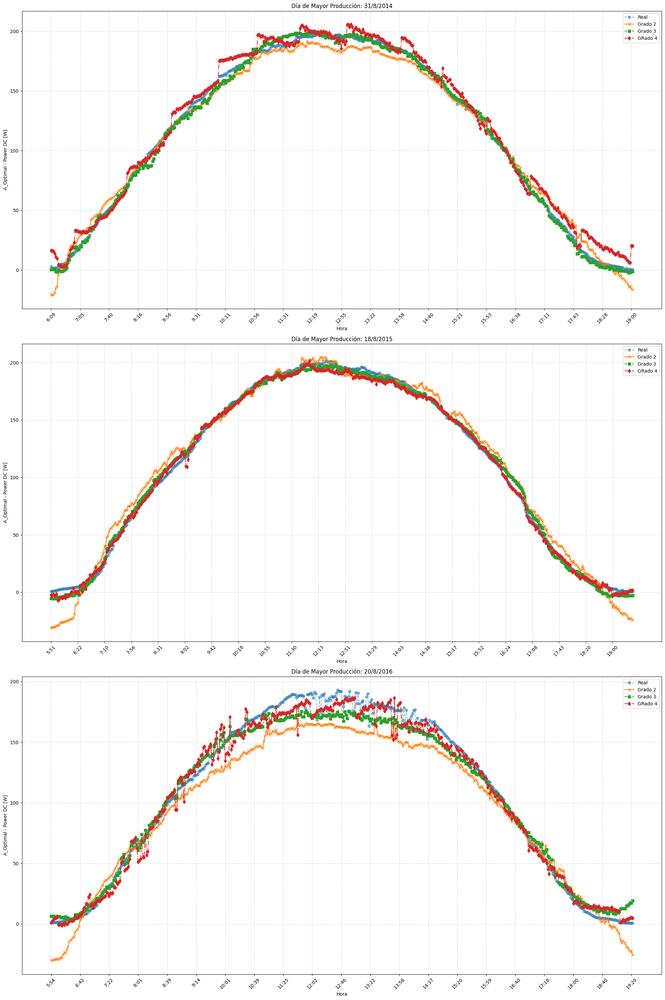

In [13]:
# Crear un DataFrame con los valores reales y predichos
comparacion = pd.DataFrame({
    'Real': y_train_copy.values.flatten(),
    'Predicción grado 2': y_train_pred_polinomico_2.flatten(),
    'Predicción grado 3': y_train_pred_polinomico_3.flatten(),
    'Predicción grado 4': y_train_pred_polinomico_4.flatten(),
    'Mes': X_train_copy['Mes'].values.flatten(),
    'Año': X_train_copy['Año'].values.flatten(),
    'Día': X_train_copy['Día'].values.flatten(),
    'Hora': X_train_copy['Hora'].values.flatten(),
    'Minuto': X_train_copy['Minuto'].values.flatten()
})

# Encontrar el día de mayor producción de agosto para cada año
dias_mayor_produccion = {}
for year in [2014, 2015, 2016]:
    mes_agosto = comparacion[(comparacion['Año'] == year) & (comparacion['Mes'] == 8)]
    dia_mayor_produccion = mes_agosto.groupby('Día')['Real'].sum().idxmax()
    dias_mayor_produccion[year] = dia_mayor_produccion

# Crear la gráfica
fig, axes = plt.subplots(3, 1, figsize=(20, 30))

for i, year in enumerate([2014, 2015, 2016]):
    dia_mayor_produccion = dias_mayor_produccion[year]
    datos_dia_mayor = comparacion[(comparacion['Año'] == year) & (comparacion['Mes'] == 8) & (comparacion['Día'] == dia_mayor_produccion)]
    
    # Extraer las horas y minutos
    horas_minutos = datos_dia_mayor[['Hora', 'Minuto']].values
    vector_horas_minutos = [f"{int(hora)}:{int(minuto):02d}" for hora, minuto in horas_minutos]
    
    # Gráfica para el día de mayor producción de cada año
    ax = axes[i]
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', marker="o", linestyle="dashed", alpha=0.5)
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 2'], label='Grado 2', marker="x", linestyle="-")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 3'], label='Grado 3', marker="s", linestyle="--")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 4'], label='GRado 4', marker="d", linestyle="-.")
    ax.set_title(f'Día de Mayor Producción: {int(dia_mayor_produccion)}/8/{year}')
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)

plt.tight_layout()
plt.show()

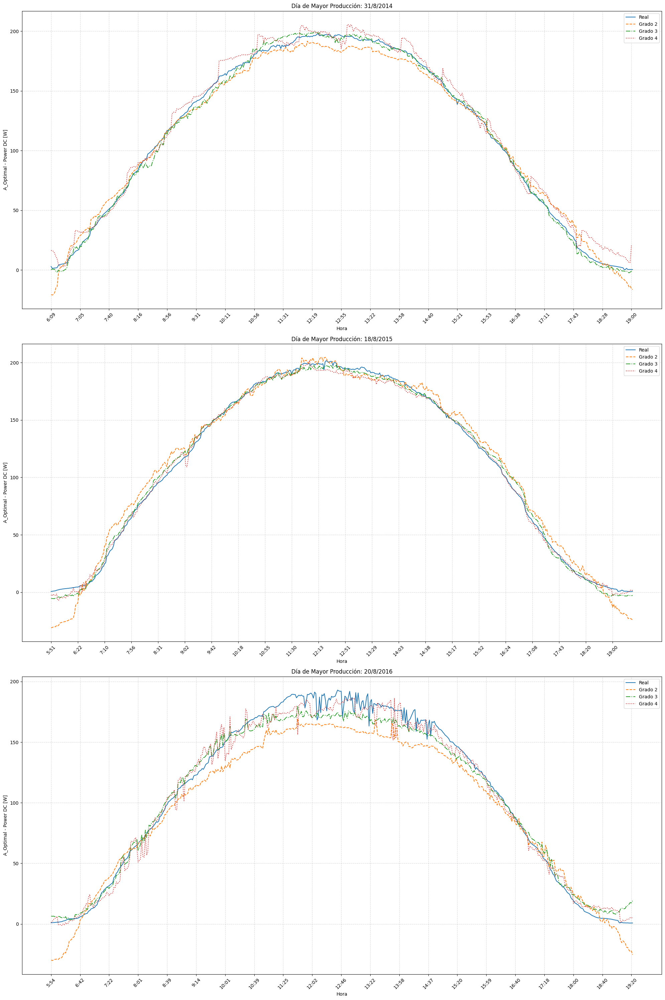

In [14]:
# Crear un DataFrame con los valores reales y predichos
comparacion = pd.DataFrame({
    'Real': y_train_copy.values.flatten(),
    'Predicción grado 2': y_train_pred_polinomico_2.flatten(),
    'Predicción grado 3': y_train_pred_polinomico_3.flatten(),
    'Predicción grado 4': y_train_pred_polinomico_4.flatten(),
    'Mes': X_train_copy['Mes'].values.flatten(),
    'Año': X_train_copy['Año'].values.flatten(),
    'Día': X_train_copy['Día'].values.flatten(),
    'Hora': X_train_copy['Hora'].values.flatten(),
    'Minuto': X_train_copy['Minuto'].values.flatten()
})

# Encontrar el día de mayor producción de agosto para cada año
dias_mayor_produccion = {}
for year in [2014, 2015, 2016]:
    mes_agosto = comparacion[(comparacion['Año'] == year) & (comparacion['Mes'] == 8)]
    dia_mayor_produccion = mes_agosto.groupby('Día')['Real'].sum().idxmax()
    dias_mayor_produccion[year] = dia_mayor_produccion

# Crear la gráfica
fig, axes = plt.subplots(3, 1, figsize=(20, 30))

for i, year in enumerate([2014, 2015, 2016]):
    dia_mayor_produccion = dias_mayor_produccion[year]
    datos_dia_mayor = comparacion[(comparacion['Año'] == year) & (comparacion['Mes'] == 8) & (comparacion['Día'] == dia_mayor_produccion)]
    
    # Extraer las horas y minutos
    horas_minutos = datos_dia_mayor[['Hora', 'Minuto']].values
    vector_horas_minutos = [f"{int(hora)}:{int(minuto):02d}" for hora, minuto in horas_minutos]
    
    # Gráfica para el día de mayor producción de cada año
    ax = axes[i]
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', linestyle="solid")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 2'], label='Grado 2', linestyle="--")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 3'], label='Grado 3', linestyle="-.")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 4'], label='Grado 4', linestyle=":")
    ax.set_title(f'Día de Mayor Producción: {int(dia_mayor_produccion)}/8/{year}')
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)

plt.tight_layout()
plt.show()

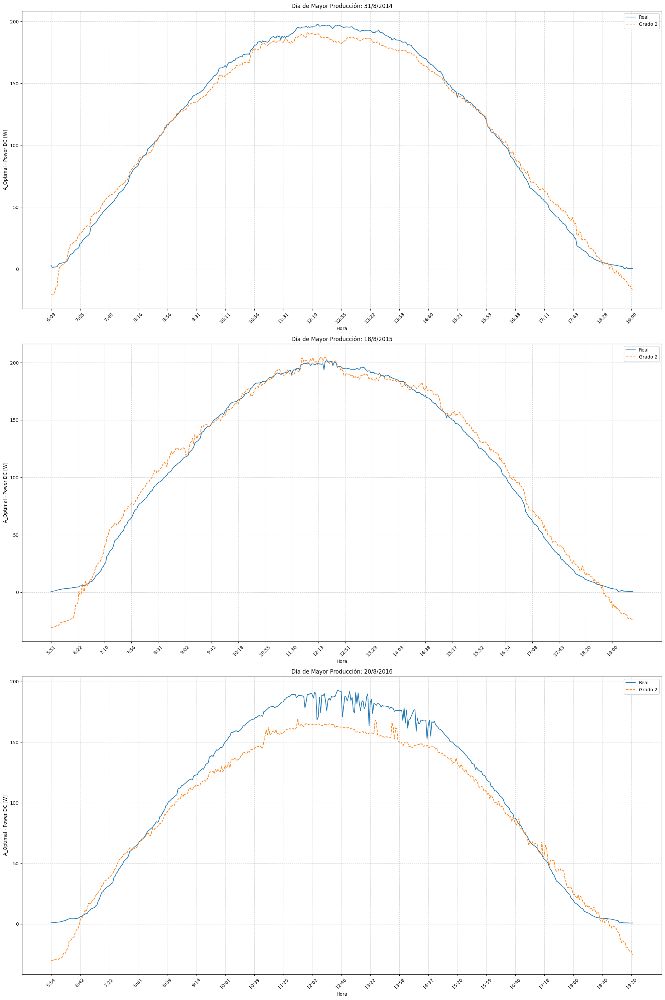

In [15]:
# Crear un DataFrame con los valores reales y predichos
comparacion = pd.DataFrame({
    'Real': y_train_copy.values.flatten(),
    'Predicción grado 2': y_train_pred_polinomico_2.flatten(),
    'Mes': X_train_copy['Mes'].values.flatten(),
    'Año': X_train_copy['Año'].values.flatten(),
    'Día': X_train_copy['Día'].values.flatten(),
    'Hora': X_train_copy['Hora'].values.flatten(),
    'Minuto': X_train_copy['Minuto'].values.flatten()
})

# Encontrar el día de mayor producción de agosto para cada año
dias_mayor_produccion = {}
for year in [2014, 2015, 2016]:
    mes_agosto = comparacion[(comparacion['Año'] == year) & (comparacion['Mes'] == 8)]
    dia_mayor_produccion = mes_agosto.groupby('Día')['Real'].sum().idxmax()
    dias_mayor_produccion[year] = dia_mayor_produccion

# Crear la gráfica
fig, axes = plt.subplots(3, 1, figsize=(20, 30))

for i, year in enumerate([2014, 2015, 2016]):
    dia_mayor_produccion = dias_mayor_produccion[year]
    datos_dia_mayor = comparacion[(comparacion['Año'] == year) & (comparacion['Mes'] == 8) & (comparacion['Día'] == dia_mayor_produccion)]
    
    # Extraer las horas y minutos
    horas_minutos = datos_dia_mayor[['Hora', 'Minuto']].values
    vector_horas_minutos = [f"{int(hora)}:{int(minuto):02d}" for hora, minuto in horas_minutos]
    
    # Gráfica para el día de mayor producción de cada año
    ax = axes[i]
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', linestyle="solid")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 2'], label='Grado 2', linestyle="--")
    ax.set_title(f'Día de Mayor Producción: {int(dia_mayor_produccion)}/8/{year}')
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)

plt.tight_layout()
plt.show()

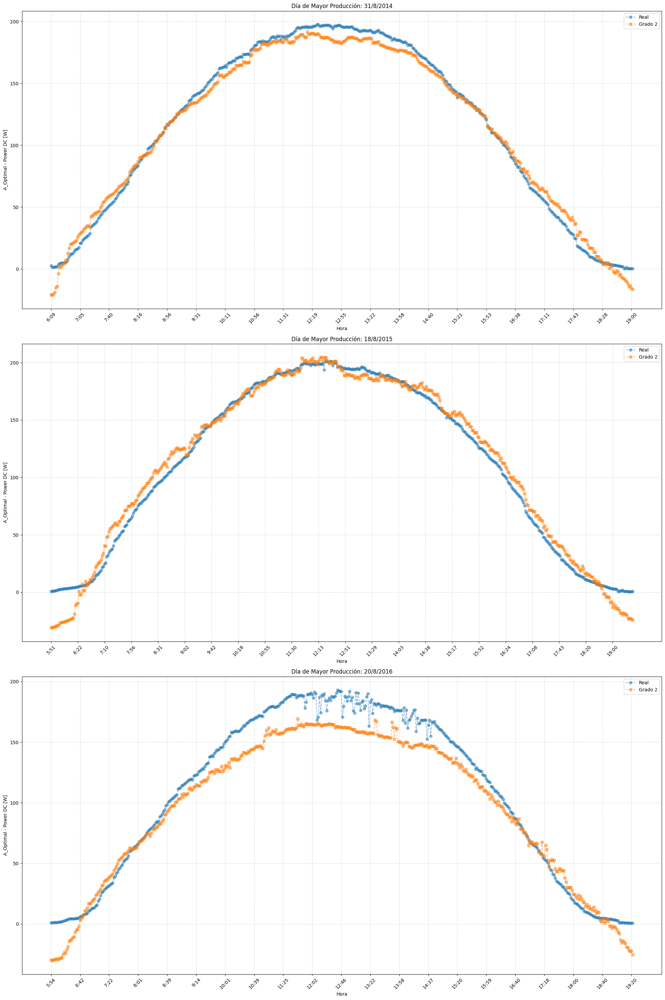

In [16]:
# Crear un DataFrame con los valores reales y predichos
comparacion = pd.DataFrame({
    'Real': y_train_copy.values.flatten(),
    'Predicción grado 2': y_train_pred_polinomico_2.flatten(),
    'Mes': X_train_copy['Mes'].values.flatten(),
    'Año': X_train_copy['Año'].values.flatten(),
    'Día': X_train_copy['Día'].values.flatten(),
    'Hora': X_train_copy['Hora'].values.flatten(),
    'Minuto': X_train_copy['Minuto'].values.flatten()
})

# Encontrar el día de mayor producción de agosto para cada año
dias_mayor_produccion = {}
for year in [2014, 2015, 2016]:
    mes_agosto = comparacion[(comparacion['Año'] == year) & (comparacion['Mes'] == 8)]
    dia_mayor_produccion = mes_agosto.groupby('Día')['Real'].sum().idxmax()
    dias_mayor_produccion[year] = dia_mayor_produccion

# Crear la gráfica
fig, axes = plt.subplots(3, 1, figsize=(20, 30))

for i, year in enumerate([2014, 2015, 2016]):
    dia_mayor_produccion = dias_mayor_produccion[year]
    datos_dia_mayor = comparacion[(comparacion['Año'] == year) & (comparacion['Mes'] == 8) & (comparacion['Día'] == dia_mayor_produccion)]
    
    # Extraer las horas y minutos
    horas_minutos = datos_dia_mayor[['Hora', 'Minuto']].values
    vector_horas_minutos = [f"{int(hora)}:{int(minuto):02d}" for hora, minuto in horas_minutos]
    
    # Gráfica para el día de mayor producción de cada año
    ax = axes[i]
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', linestyle="dashed", marker = "o", markersize = 6, alpha = 0.5)
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 2'], label='Grado 2', linestyle="--", marker = "s", markersize =6, alpha = 0.5)
    ax.set_title(f'Día de Mayor Producción: {int(dia_mayor_produccion)}/8/{year}')
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)

plt.tight_layout()
plt.show()

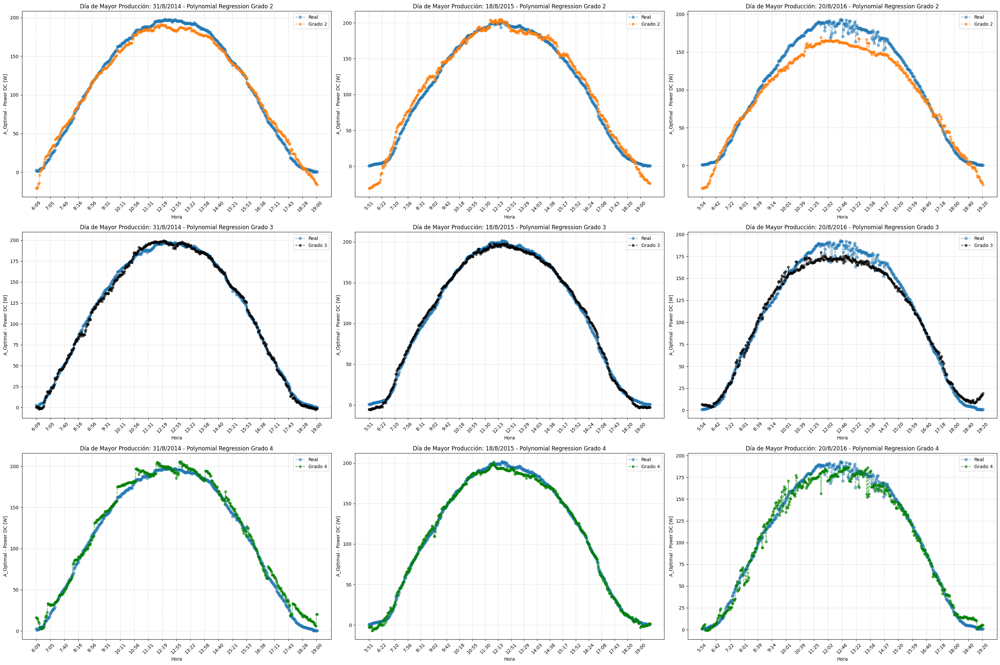

In [17]:
# Crear un DataFrame con los valores reales y predichos
comparacion = pd.DataFrame({
    'Real': y_train_copy.values.flatten(),
    'Predicción grado 2': y_train_pred_polinomico_2.flatten(),
    'Predicción grado 3': y_train_pred_polinomico_3.flatten(),
    'Predicción grado 4': y_train_pred_polinomico_4.flatten(),
    'Mes': X_train_copy['Mes'].values.flatten(),
    'Año': X_train_copy['Año'].values.flatten(),
    'Día': X_train_copy['Día'].values.flatten(),
    'Hora': X_train_copy['Hora'].values.flatten(),
    'Minuto': X_train_copy['Minuto'].values.flatten()
})

# Encontrar el día de mayor producción de agosto para cada año
dias_mayor_produccion = {}
for year in [2014, 2015, 2016]:
    mes_agosto = comparacion[(comparacion['Año'] == year) & (comparacion['Mes'] == 8)]
    dia_mayor_produccion = mes_agosto.groupby('Día')['Real'].sum().idxmax()
    dias_mayor_produccion[year] = dia_mayor_produccion

# Crear la gráfica
fig, axes = plt.subplots(3, 3, figsize=(30, 20))

for i, year in enumerate([2014, 2015, 2016]):
    dia_mayor_produccion = dias_mayor_produccion[year]
    datos_dia_mayor = comparacion[(comparacion['Año'] == year) & (comparacion['Mes'] == 8) & (comparacion['Día'] == dia_mayor_produccion)]
    
    # Extraer las horas y minutos
    horas_minutos = datos_dia_mayor[['Hora', 'Minuto']].values
    vector_horas_minutos = [f"{int(hora)}:{int(minuto):02d}" for hora, minuto in horas_minutos]
    
    # Gráfica para el día de mayor producción de cada año - Grado 2
    ax = axes[0, i]
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', marker="o", linestyle="dashed", alpha=0.5)
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 2'], label='Grado 2', marker="o", linestyle="dashed", alpha=0.6, markersize=5)
    ax.set_title(f'Día de Mayor Producción: {int(dia_mayor_produccion)}/8/{year} - Polynomial Regression Grado 2')
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)
    
    # Gráfica para el día de mayor producción de cada año - Grado 3
    ax = axes[1, i]
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', marker="o", linestyle="dashed", alpha=0.5)
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 3'], label='Grado 3', marker="o", linestyle="dashed", alpha=0.6, markersize=5, color = 'black')
    ax.set_title(f'Día de Mayor Producción: {int(dia_mayor_produccion)}/8/{year} - Polynomial Regression Grado 3')
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)

    # Gráfica para el día de mayor producción de cada año - Grado 4
    ax = axes[2, i]
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', marker="o", linestyle="dashed", alpha=0.5)
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 4'], label='Grado 4', marker="o", linestyle="dashed", alpha=0.6, markersize=5, color = 'green')
    ax.set_title(f'Día de Mayor Producción: {int(dia_mayor_produccion)}/8/{year} - Polynomial Regression Grado 4')
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)
    
plt.tight_layout()
plt.show()

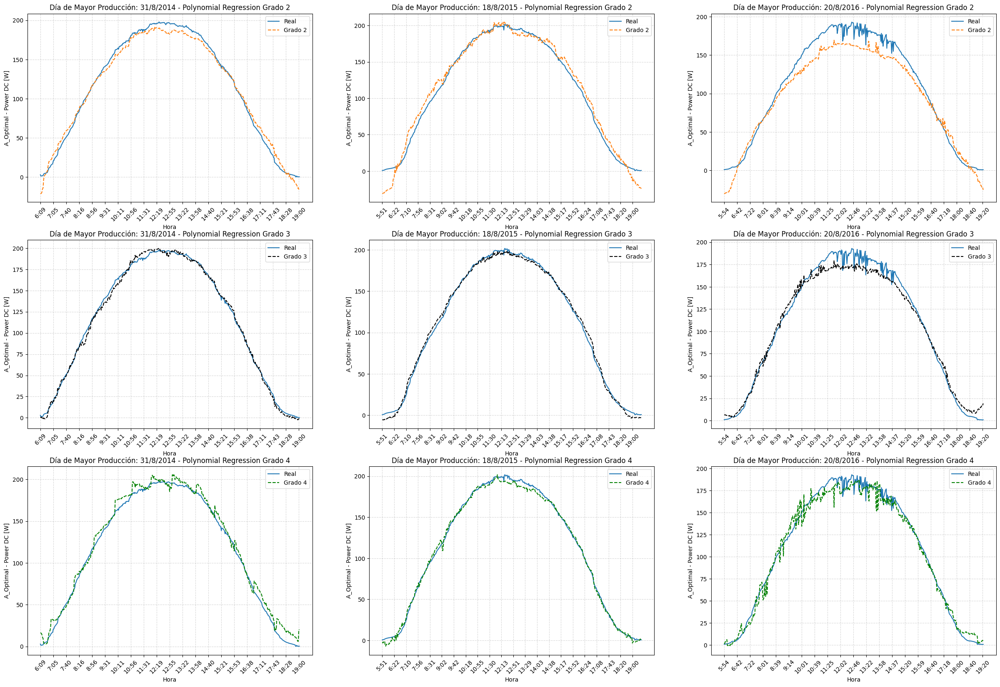

In [18]:
# Crear un DataFrame con los valores reales y predichos para RF_20est, RF_300est_16depth
comparacion = pd.DataFrame({
    'Real': y_train_copy.values.flatten(),
    'Predicción grado 2': y_train_pred_polinomico_2.flatten(),
    'Predicción grado 3': y_train_pred_polinomico_3.flatten(),
    'Predicción grado 4': y_train_pred_polinomico_4.flatten(),
    'Mes': X_train_copy['Mes'].values.flatten(),
    'Año': X_train_copy['Año'].values.flatten(),
    'Día': X_train_copy['Día'].values.flatten(),
    'Hora': X_train_copy['Hora'].values.flatten(),
    'Minuto': X_train_copy['Minuto'].values.flatten()
})

# Encontrar el día de mayor producción de agosto para cada año
dias_mayor_produccion = {}
for year in [2014, 2015, 2016]:
    mes_agosto = comparacion[(comparacion['Año'] == year) & (comparacion['Mes'] == 8)]
    dia_mayor_produccion = mes_agosto.groupby('Día')['Real'].sum().idxmax()
    dias_mayor_produccion[year] = dia_mayor_produccion

# Crear la gráfica
fig, axes = plt.subplots(3, 3, figsize=(30, 20))

for i, year in enumerate([2014, 2015, 2016]):
    dia_mayor_produccion = dias_mayor_produccion[year]
    datos_dia_mayor = comparacion[(comparacion['Año'] == year) & (comparacion['Mes'] == 8) & (comparacion['Día'] == dia_mayor_produccion)]
    
    # Extraer las horas y minutos
    horas_minutos = datos_dia_mayor[['Hora', 'Minuto']].values
    vector_horas_minutos = [f"{int(hora)}:{int(minuto):02d}" for hora, minuto in horas_minutos]
    
    # Gráfica para el día de mayor producción de cada año - Grado 2
    ax = axes[0, i]
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', linestyle="solid")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 2'], label='Grado 2', linestyle="--")
    ax.set_title(f'Día de Mayor Producción: {int(dia_mayor_produccion)}/8/{year} - Polynomial Regression Grado 2')
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)
    
    # Gráfica para el día de mayor producción de cada año - Grado 3
    ax = axes[1, i]
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', linestyle="solid")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 3'], label='Grado 3', linestyle="--", color = 'black')
    ax.set_title(f'Día de Mayor Producción: {int(dia_mayor_produccion)}/8/{year} - Polynomial Regression Grado 3')
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)

    # Gráfica para el día de mayor producción de cada año - Grado 4
    ax = axes[2, i]
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', linestyle="solid")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 4'], label='Grado 4', linestyle="--", color = 'green')
    ax.set_title(f'Día de Mayor Producción: {int(dia_mayor_produccion)}/8/{year} - Polynomial Regression Grado 4')
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)

## Guardar Modelo ML

In [ ]:
#Guardar el modelo de LinearRegression_model
import joblib
joblib.dump(modelo_polinomico_2, 'model_A_PolynomialRegressionGrado2.pkl')
joblib.dump(modelo_polinomico_3, 'model_A_PolynomialRegressionGrado3.pkl')

## Gráfica Datos Escalados

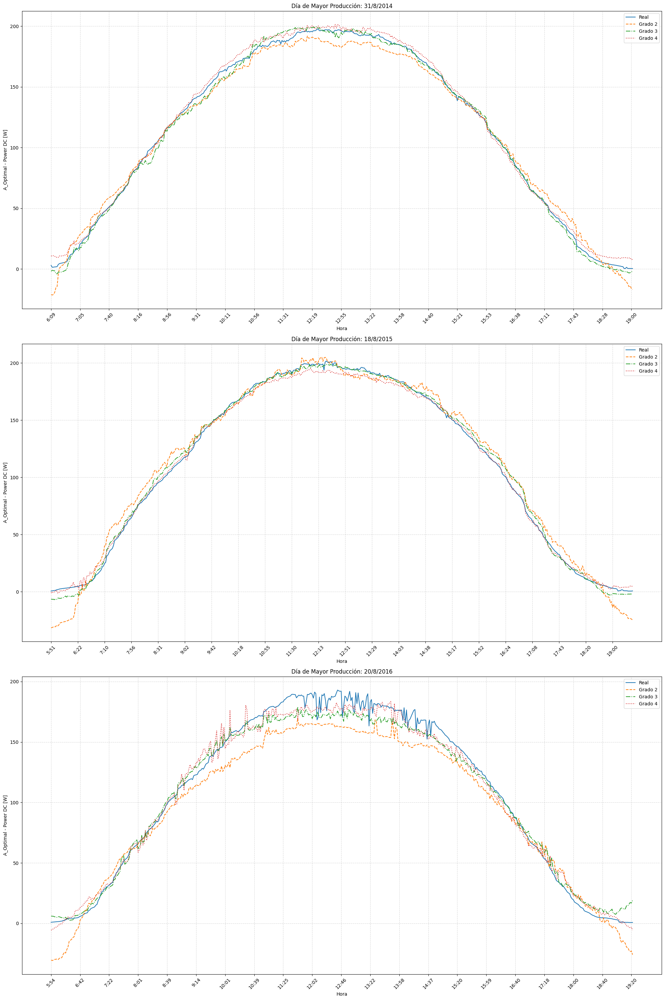

Varianza de las características:
 Año                              0.602319
Mes                              9.913034
Día                             76.865748
Hora                            13.194242
Minuto                         299.711666
Ambient Temperature [ºC]        31.110415
Global Radiation [W/m2]     101331.883499
Ultraviolet [W/m2]             381.093836
Wind Velocity [m/s]              1.699524
Wind Direction [º]            7327.031992
dtype: float64


In [281]:
## ESCALADOS
#Crear un DataFrame con los valores reales y predichos. 
comparacion = pd.DataFrame({
    'Real': y_train_copy.values.flatten(),
    'Predicción grado 2': y_train_pred_polinomico_2_scaled.flatten(),
    'Predicción grado 3': y_train_pred_polinomico_3_scaled.flatten(),
    'Predicción grado 4': y_train_pred_polinomico_4_scaled.flatten(),
    'Mes': X_train_copy['Mes'].values.flatten(),
    'Año': X_train_copy['Año'].values.flatten(),
    'Día': X_train_copy['Día'].values.flatten(),
    'Hora': X_train_copy['Hora'].values.flatten(),
    'Minuto': X_train_copy['Minuto'].values.flatten()
})

# Encontrar el día de mayor producción de agosto para cada año
dias_mayor_produccion = {}
for year in [2014, 2015, 2016]:
    mes_agosto = comparacion[(comparacion['Año'] == year) & (comparacion['Mes'] == 8)]
    dia_mayor_produccion = mes_agosto.groupby('Día')['Real'].sum().idxmax()
    dias_mayor_produccion[year] = dia_mayor_produccion

# Crear la gráfica
fig, axes = plt.subplots(3, 1, figsize=(20, 30))

for i, year in enumerate([2014, 2015, 2016]):
    dia_mayor_produccion = dias_mayor_produccion[year]
    datos_dia_mayor = comparacion[(comparacion['Año'] == year) & (comparacion['Mes'] == 8) & (comparacion['Día'] == dia_mayor_produccion)]
    
    # Extraer las horas y minutos
    horas_minutos = datos_dia_mayor[['Hora', 'Minuto']].values
    vector_horas_minutos = [f"{int(hora)}:{int(minuto):02d}" for hora, minuto in horas_minutos]
    
    # Gráfica para el día de mayor producción de cada año
    ax = axes[i]
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', linestyle="solid")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 2'], label='Grado 2', linestyle="--")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 3'], label='Grado 3', linestyle="-.")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 4'], label='Grado 4', linestyle=":")
    ax.set_title(f'Día de Mayor Producción: {int(dia_mayor_produccion)}/8/{year}')
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)

plt.tight_layout()
plt.show()
import numpy as np
print("Varianza de las características:\n", np.var(X_train_copy, axis=0))

## 4.1 PolynomialFeatures

https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.PolynomialFeatures.html#sklearn.preprocessing.PolynomialFeatures

### Entrenamiento

In [19]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
import time

# Crear los modelos de regresión polinómica
grado_2 = 2 
modelo_polinomico_2_featured = make_pipeline(PolynomialFeatures(grado_2, interaction_only=True), LinearRegression())
modelo_polinomico_2_scaled_featured = make_pipeline(PolynomialFeatures(grado_2, interaction_only=True), LinearRegression())
grado_3 = 3  
modelo_polinomico_3_featured = make_pipeline(PolynomialFeatures(grado_3, interaction_only=True), LinearRegression())
modelo_polinomico_3_scaled_featured = make_pipeline(PolynomialFeatures(grado_3, interaction_only=True), LinearRegression())
grado_4 = 4  
modelo_polinomico_4_featured = make_pipeline(PolynomialFeatures(grado_4, interaction_only=True), LinearRegression())
modelo_polinomico_4_scaled_featured = make_pipeline(PolynomialFeatures(grado_4, interaction_only=True), LinearRegression())

# Medir el tiempo de ajuste para el modelo polinómico de grado 2
start_time_featured = time.time()
modelo_polinomico_2_featured.fit(X_train_copy, y_train_copy)
end_time_featured = time.time()
print(f"Tiempo de ajuste para el modelo polinómico de grado 2 con interaccion: {end_time_featured - start_time_featured:.2f} segundos")
start_time_featured = time.time()
modelo_polinomico_2_scaled_featured.fit(X_train_scaled_copy, y_train_scaled_copy)
end_time_featured = time.time()
print(f"Tiempo de ajuste para el modelo polinómico de grado 2 escalado con interaccion: {end_time_featured - start_time_featured:.2f} segundos")

# Medir el tiempo de ajuste para el modelo polinómico de grado 3
start_time_featured = time.time()
modelo_polinomico_3_featured.fit(X_train_copy, y_train_copy)
end_time_featured = time.time()
print(f"Tiempo de ajuste para el modelo polinómico de grado 3 con interaccion: {end_time_featured - start_time_featured:.2f} segundos")
start_time_featured = time.time()
modelo_polinomico_3_scaled_featured.fit(X_train_scaled_copy, y_train_scaled_copy)
end_time_featured = time.time()
print(f"Tiempo de ajuste para el modelo polinómico de grado 3 escalado con interaccion: {end_time_featured - start_time_featured:.2f} segundos")

# Medir el tiempo de ajuste para el modelo polinómico de grado 4
start_time_featured = time.time()
modelo_polinomico_4_featured.fit(X_train_copy, y_train_copy)
end_time_featured = time.time()
print(f"Tiempo de ajuste para el modelo polinómico de grado 4 con interaccion: {end_time_featured - start_time_featured:.2f} segundos")
# Medir el tiempo de ajuste para el modelo polinómico de grado 4
start_time_featured = time.time()
modelo_polinomico_4_scaled_featured.fit(X_train_scaled_copy, y_train_scaled_copy)
end_time_featured = time.time()
print(f"Tiempo de ajuste para el modelo polinómico de grado 4 scaled con interaccion: {end_time_featured - start_time_featured:.2f} segundos")

Tiempo de ajuste para el modelo polinómico de grado 2 con interaccion: 2.74 segundos
Tiempo de ajuste para el modelo polinómico de grado 2 escalado con interaccion: 2.89 segundos
Tiempo de ajuste para el modelo polinómico de grado 3 con interaccion: 10.77 segundos
Tiempo de ajuste para el modelo polinómico de grado 3 escalado con interaccion: 13.22 segundos
Tiempo de ajuste para el modelo polinómico de grado 4 con interaccion: 19.83 segundos
Tiempo de ajuste para el modelo polinómico de grado 4 scaled con interaccion: 20.42 segundos


### Predicción

In [20]:
start_time_featured = time.time()
# Predecir con el conjunto de datos de entrenamiento
y_train_pred_polinomico_2_featured = modelo_polinomico_2_featured.predict(X_train_copy)
# Predecir con el conjunto de datos de validación
y_val_pred_polinomico_2_featured = modelo_polinomico_2_featured.predict(X_val_copy)
# Predecir con el conjunto de datos de test
y_test_pred_polinomico_2_featured = modelo_polinomico_2_featured.predict(X_test_copy)
end_time_featured = time.time()
print(f"Tiempo de predicción para el modelo polinómico de grado 2 con interaccion: {end_time_featured - start_time_featured:.2f} segundos")

start_time_featured = time.time()
y_train_pred_polinomico_2_scaled_featured = modelo_polinomico_2_scaled_featured.predict(X_train_scaled_copy)
y_val_pred_polinomico_2_scaled_featured = modelo_polinomico_2_scaled_featured.predict(X_val_scaled_copy)
y_test_pred_polinomico_2_scaled_featured = modelo_polinomico_2_scaled_featured.predict(X_test_scaled_copy)
end_time_featured = time.time()
print(f"Tiempo de predicción para el modelo polinómico de grado 2 con interaccion escalado: {end_time_featured - start_time_featured:.2f} segundos")

start_time_featured = time.time()
y_train_pred_polinomico_3_featured = modelo_polinomico_3_featured.predict(X_train_copy)
y_val_pred_polinomico_3_featured = modelo_polinomico_3_featured.predict(X_val_copy)
y_test_pred_polinomico_3_featured = modelo_polinomico_3_featured.predict(X_test_copy)
end_time_featured = time.time()
print(f"Tiempo de predicción para el modelo polinómico de grado 3 con interaccion: {end_time_featured - start_time_featured:.2f} segundos")

start_time_featured = time.time()
y_train_pred_polinomico_3_scaled_featured = modelo_polinomico_3_scaled_featured.predict(X_train_scaled_copy)
y_val_pred_polinomico_3_scaled_featured = modelo_polinomico_3_scaled_featured.predict(X_val_scaled_copy)
y_test_pred_polinomico_3_scaled_featured = modelo_polinomico_3_scaled_featured.predict(X_test_scaled_copy)
end_time_featured = time.time()
print(f"Tiempo de predicción para el modelo polinómico de grado 3 con interaccion escalado: {end_time_featured - start_time_featured:.2f} segundos")

start_time_featured = time.time()
y_train_pred_polinomico_4_featured = modelo_polinomico_4_featured.predict(X_train_copy)
y_val_pred_polinomico_4_featured = modelo_polinomico_4_featured.predict(X_val_copy)
y_test_pred_polinomico_4_featured = modelo_polinomico_4_featured.predict(X_test_copy)
end_time_featured = time.time()
print(f"Tiempo de predicción para el modelo polinómico de grado 4 con interaccion: {end_time_featured - start_time_featured:.2f} segundos")

start_time_featured = time.time()
y_train_pred_polinomico_4_scaled_featured = modelo_polinomico_4_scaled_featured.predict(X_train_scaled_copy)
y_val_pred_polinomico_4_scaled_featured = modelo_polinomico_4_scaled_featured.predict(X_val_scaled_copy)
y_test_pred_polinomico_4_scaled_featured = modelo_polinomico_4_scaled_featured.predict(X_test_scaled_copy)
end_time_featured = time.time()
print(f"Tiempo de predicción para el modelo polinómico de grado 4 con interaccion escalado: {end_time_featured - start_time_featured:.2f} segundos")

# Invertir la escala de las predicciones
y_train_pred_polinomico_2_scaled_featured = scaler.inverse_transform(y_train_pred_polinomico_2_scaled_featured)
y_val_pred_polinomico_2_scaled_featured = scaler.inverse_transform(y_val_pred_polinomico_2_scaled_featured)
y_test_pred_polinomico_2_scaled_featured = scaler.inverse_transform(y_test_pred_polinomico_2_scaled_featured)

y_train_pred_polinomico_3_scaled_featured = scaler.inverse_transform(y_train_pred_polinomico_3_scaled_featured)
y_val_pred_polinomico_3_scaled_featured = scaler.inverse_transform(y_val_pred_polinomico_3_scaled_featured)
y_test_pred_polinomico_3_scaled_featured = scaler.inverse_transform(y_test_pred_polinomico_3_scaled_featured)

y_train_pred_polinomico_4_scaled_featured = scaler.inverse_transform(y_train_pred_polinomico_4_scaled_featured)
y_val_pred_polinomico_4_scaled_featured = scaler.inverse_transform(y_val_pred_polinomico_4_scaled_featured)
y_test_pred_polinomico_4_scaled_featured = scaler.inverse_transform(y_test_pred_polinomico_4_scaled_featured)


Tiempo de predicción para el modelo polinómico de grado 2 con interaccion: 0.89 segundos
Tiempo de predicción para el modelo polinómico de grado 2 con interaccion escalado: 0.83 segundos
Tiempo de predicción para el modelo polinómico de grado 3 con interaccion: 2.05 segundos
Tiempo de predicción para el modelo polinómico de grado 3 con interaccion escalado: 1.92 segundos
Tiempo de predicción para el modelo polinómico de grado 4 con interaccion: 3.90 segundos
Tiempo de predicción para el modelo polinómico de grado 4 con interaccion escalado: 3.83 segundos


### Métricas

In [21]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Evaluar el modelo con los conjuntos de datos de entrenamiento, validación y test
mse_train_polinomico_2_featured = mean_squared_error(y_train_pred_polinomico_2_featured, y_train_copy)
r2_train_polinomico_2_featured = r2_score(y_train_pred_polinomico_2_featured, y_train_copy)
mae_train_polinomico_2_featured = mean_absolute_error(y_train_pred_polinomico_2_featured, y_train_copy)

mse_val_polinomico_2_featured = mean_squared_error(y_val_pred_polinomico_2_featured, y_val_copy)
r2_val_polinomico_2_featured = r2_score(y_val_pred_polinomico_2_featured, y_val_copy)
mae_val_polinomico_2_featured = mean_absolute_error(y_val_pred_polinomico_2_featured, y_val_copy)

mse_test_polinomico_2_featured = mean_squared_error(y_test_pred_polinomico_2_featured, y_test_copy)
r2_test_polinomico_2_featured = r2_score(y_test_pred_polinomico_2_featured, y_test_copy)
mae_test_polinomico_2_featured = mean_absolute_error(y_test_pred_polinomico_2_featured, y_test_copy)

print('Grado 2 featured:')
print(f"Error Cuadrático Medio (MSE) Train Set: {mse_train_polinomico_2_featured:.2f}")
print(f"Coeficiente de Determinación (R^2) Train Set: {r2_train_polinomico_2_featured:.2f}")
print(f"MAE Train Set: {mae_train_polinomico_2_featured:.2f}")
print(f"Error Cuadrático Medio (MSE) Validation Set: {mse_val_polinomico_2_featured:.2f}")
print(f"Coeficiente de Determinación (R^2) Validation Set: {r2_val_polinomico_2_featured:.2f}")
print(f"MAE Validation Set: {mae_val_polinomico_2_featured:.2f}")
print(f"Error Cuadrático Medio (MSE) Test Set: {mse_test_polinomico_2_featured:.2f}")
print(f"Coeficiente de Determinación (R^2) Test Set: {r2_test_polinomico_2_featured:.2f}")
print(f"MAE Test Set: {mae_test_polinomico_2_featured:.2f}")

# Evaluar el modelo con los conjuntos de datos de entrenamiento, validación y test
mse_train_polinomico_3_featured = mean_squared_error(y_train_pred_polinomico_3_featured, y_train_copy)
r2_train_polinomico_3_featured = r2_score(y_train_pred_polinomico_3_featured, y_train_copy)
mae_train_polinomico_3_featured = mean_absolute_error(y_train_pred_polinomico_3_featured, y_train_copy)

mse_val_polinomico_3_featured = mean_squared_error(y_val_pred_polinomico_3_featured, y_val_copy)
r2_val_polinomico_3_featured = r2_score(y_val_pred_polinomico_3_featured, y_val_copy)
mae_val_polinomico_3_featured = mean_absolute_error(y_val_pred_polinomico_3_featured, y_val_copy)

mse_test_polinomico_3_featured = mean_squared_error(y_test_pred_polinomico_3_featured, y_test_copy)
r2_test_polinomico_3_featured = r2_score(y_test_pred_polinomico_3_featured, y_test_copy)
mae_test_polinomico_3_featured = mean_absolute_error(y_test_pred_polinomico_3_featured, y_test_copy)

print('Grado 3 featured:')
print(f"Error Cuadrático Medio (MSE) Train Set: {mse_train_polinomico_3_featured:.2f}")
print(f"Coeficiente de Determinación (R^2) Train Set: {r2_train_polinomico_3_featured:.2f}")
print(f"MAE Train Set: {mae_train_polinomico_3_featured:.2f}")
print(f"Error Cuadrático Medio (MSE) Validation Set: {mse_val_polinomico_3_featured:.2f}")
print(f"Coeficiente de Determinación (R^2) Validation Set: {r2_val_polinomico_3_featured:.2f}")
print(f"MAE Validation Set: {mae_val_polinomico_3_featured:.2f}")
print(f"Error Cuadrático Medio (MSE) Test Set: {mse_test_polinomico_3_featured:.2f}")
print(f"Coeficiente de Determinación (R^2) Test Set: {r2_test_polinomico_3_featured:.2f}")
print(f"MAE Test Set: {mae_test_polinomico_3_featured:.2f}")

# Evaluar el modelo con los conjuntos de datos de entrenamiento, validación y test
mse_train_polinomico_4_featured = mean_squared_error(y_train_pred_polinomico_4_featured, y_train_copy)
r2_train_polinomico_4_featured = r2_score(y_train_pred_polinomico_4_featured, y_train_copy)
mae_train_polinomico_4_featured = mean_absolute_error(y_train_pred_polinomico_4_featured, y_train_copy)

mse_val_polinomico_4_featured = mean_squared_error(y_val_pred_polinomico_4_featured, y_val_copy)
r2_val_polinomico_4_featured = r2_score(y_val_pred_polinomico_4_featured, y_val_copy)
mae_val_polinomico_4_featured = mean_absolute_error(y_val_pred_polinomico_4_featured, y_val_copy)

mse_test_polinomico_4_featured = mean_squared_error(y_test_pred_polinomico_4_featured, y_test_copy)
r2_test_polinomico_4_featured = r2_score(y_test_pred_polinomico_4_featured, y_test_copy)
mae_test_polinomico_4_featured = mean_absolute_error(y_test_pred_polinomico_4_featured, y_test_copy)

print('Grado 4 featured:')
print(f"Error Cuadrático Medio (MSE) Train Set: {mse_train_polinomico_4_featured:.2f}")
print(f"Coeficiente de Determinación (R^2) Train Set: {r2_train_polinomico_4_featured:.2f}")
print(f"MAE Train Set: {mae_train_polinomico_4_featured:.2f}")
print(f"Error Cuadrático Medio (MSE) Validation Set: {mse_val_polinomico_4_featured:.2f}")
print(f"Coeficiente de Determinación (R^2) Validation Set: {r2_val_polinomico_4_featured:.2f}")
print(f"MAE Validation Set: {mae_val_polinomico_4_featured:.2f}")
print(f"Error Cuadrático Medio (MSE) Test Set: {mse_test_polinomico_4_featured:.2f}")
print(f"Coeficiente de Determinación (R^2) Test Set: {r2_test_polinomico_4_featured:.2f}")
print(f"MAE Test Set: {mae_test_polinomico_4_featured:.2f}")

# Evaluar el modelo con los conjuntos de datos de entrenamiento, validación y test
mse_train_polinomico_2_scaled_featured = mean_squared_error(y_train_pred_polinomico_2_scaled_featured, y_train_scaled_copy)
r2_train_polinomico_2_scaled_featured = r2_score(y_train_pred_polinomico_2_scaled_featured, y_train_scaled_copy)
mae_train_polinomico_2_scaled_featured = mean_absolute_error(y_train_pred_polinomico_2_scaled_featured, y_train_scaled_copy)

mse_val_polinomico_2_scaled_featured = mean_squared_error(y_val_pred_polinomico_2_scaled_featured, y_val_scaled_copy)
r2_val_polinomico_2_scaled_featured = r2_score(y_val_pred_polinomico_2_scaled_featured, y_val_scaled_copy)
mae_val_polinomico_2_scaled_featured = mean_absolute_error(y_val_pred_polinomico_2_scaled_featured, y_val_scaled_copy)

mse_test_polinomico_2_scaled_featured = mean_squared_error(y_test_pred_polinomico_2_scaled_featured, y_test_scaled_copy)
r2_test_polinomico_2_scaled_featured = r2_score(y_test_pred_polinomico_2_scaled_featured, y_test_scaled_copy)
mae_test_polinomico_2_scaled_featured = mean_absolute_error(y_test_pred_polinomico_2_scaled_featured, y_test_scaled_copy)

print('Grado 2 escalado featured:')
print(f"Error Cuadrático Medio (MSE) Train Set: {mse_train_polinomico_2_scaled_featured:.2f}")
print(f"Coeficiente de Determinación (R^2) Train Set: {r2_train_polinomico_2_scaled_featured:.2f}")
print(f"MAE Train Set: {mae_train_polinomico_2_scaled_featured:.2f}")
print(f"Error Cuadrático Medio (MSE) Validation Set: {mse_val_polinomico_2_scaled_featured:.2f}")
print(f"Coeficiente de Determinación (R^2) Validation Set: {r2_val_polinomico_2_scaled_featured:.2f}")
print(f"MAE Validation Set: {mae_val_polinomico_2_scaled_featured:.2f}")
print(f"Error Cuadrático Medio (MSE) Test Set: {mse_test_polinomico_2_scaled_featured:.2f}")
print(f"Coeficiente de Determinación (R^2) Test Set: {r2_test_polinomico_2_scaled_featured:.2f}")
print(f"MAE Test Set: {mae_test_polinomico_2_scaled_featured:.2f}")

# Evaluar el modelo con los conjuntos de datos de entrenamiento, validación y test
mse_train_polinomico_3_scaled_featured = mean_squared_error(y_train_pred_polinomico_3_scaled_featured, y_train_scaled_copy)
r2_train_polinomico_3_scaled_featured = r2_score(y_train_pred_polinomico_3_scaled_featured, y_train_scaled_copy)
mae_train_polinomico_3_scaled_featured = mean_absolute_error(y_train_pred_polinomico_3_scaled_featured, y_train_scaled_copy)

mse_val_polinomico_3_scaled_featured = mean_squared_error(y_val_pred_polinomico_3_scaled_featured, y_val_scaled_copy)
r2_val_polinomico_3_scaled_featured = r2_score(y_val_pred_polinomico_3_scaled_featured, y_val_scaled_copy)
mae_val_polinomico_3_scaled_featured = mean_absolute_error(y_val_pred_polinomico_3_scaled_featured, y_val_scaled_copy)

mse_test_polinomico_3_scaled_featured = mean_squared_error(y_test_pred_polinomico_3_scaled_featured, y_test_scaled_copy)
r2_test_polinomico_3_scaled_featured = r2_score(y_test_pred_polinomico_3_scaled_featured, y_test_scaled_copy)
mae_test_polinomico_3_scaled_featured = mean_absolute_error(y_test_pred_polinomico_3_scaled_featured, y_test_scaled_copy)

print('Grado 3 escalado featured:')
print(f"Error Cuadrático Medio (MSE) Train Set: {mse_train_polinomico_3_scaled_featured:.2f}")
print(f"Coeficiente de Determinación (R^2) Train Set: {r2_train_polinomico_3_scaled_featured:.2f}")
print(f"MAE Train Set: {mae_train_polinomico_3_scaled_featured:.2f}")
print(f"Error Cuadrático Medio (MSE) Validation Set: {mse_val_polinomico_3_scaled_featured:.2f}")
print(f"Coeficiente de Determinación (R^2) Validation Set: {r2_val_polinomico_3_scaled_featured:.2f}")
print(f"MAE Validation Set: {mae_val_polinomico_3_scaled_featured:.2f}")
print(f"Error Cuadrático Medio (MSE) Test Set: {mse_test_polinomico_3_scaled_featured:.2f}")
print(f"Coeficiente de Determinación (R^2) Test Set: {r2_test_polinomico_3_scaled_featured:.2f}")
print(f"MAE Test Set: {mae_test_polinomico_3_scaled_featured:.2f}")

# Evaluar el modelo con los conjuntos de datos de entrenamiento, validación y test
mse_train_polinomico_4_scaled_featured = mean_squared_error(y_train_pred_polinomico_4_scaled_featured, y_train_scaled_copy)
r2_train_polinomico_4_scaled_featured = r2_score(y_train_pred_polinomico_4_scaled_featured, y_train_scaled_copy)
mae_train_polinomico_4_scaled_featured = mean_absolute_error(y_train_pred_polinomico_4_scaled_featured, y_train_scaled_copy)

mse_val_polinomico_4_scaled_featured = mean_squared_error(y_val_pred_polinomico_4_scaled_featured, y_val_scaled_copy)
r2_val_polinomico_4_scaled_featured = r2_score(y_val_pred_polinomico_4_scaled_featured, y_val_scaled_copy)
mae_val_polinomico_4_scaled_featured = mean_absolute_error(y_val_pred_polinomico_4_scaled_featured, y_val_scaled_copy)

mse_test_polinomico_4_scaled_featured = mean_squared_error(y_test_pred_polinomico_4_scaled_featured, y_test_scaled_copy)
r2_test_polinomico_4_scaled_featured = r2_score(y_test_pred_polinomico_4_scaled_featured, y_test_scaled_copy)
mae_test_polinomico_4_scaled_featured = mean_absolute_error(y_test_pred_polinomico_4_scaled_featured, y_test_scaled_copy)

print('Grado 4 escalado featured:')
print(f"Error Cuadrático Medio (MSE) Train Set: {mse_train_polinomico_4_scaled_featured:.2f}")
print(f"Coeficiente de Determinación (R^2) Train Set: {r2_train_polinomico_4_scaled_featured:.2f}")
print(f"MAE Train Set: {mae_train_polinomico_4_scaled_featured:.2f}")
print(f"Error Cuadrático Medio (MSE) Validation Set: {mse_val_polinomico_4_scaled_featured:.2f}")
print(f"Coeficiente de Determinación (R^2) Validation Set: {r2_val_polinomico_4_scaled_featured:.2f}")
print(f"MAE Validation Set: {mae_val_polinomico_4_scaled_featured:.2f}")
print(f"Error Cuadrático Medio (MSE) Test Set: {mse_test_polinomico_4_scaled_featured:.2f}")
print(f"Coeficiente de Determinación (R^2) Test Set: {r2_test_polinomico_4_scaled_featured:.2f}")
print(f"MAE Test Set: {mae_test_polinomico_4_scaled_featured:.2f}")


Grado 2 featured:
Error Cuadrático Medio (MSE) Train Set: 996.12
Coeficiente de Determinación (R^2) Train Set: 0.76
MAE Train Set: 21.87
Error Cuadrático Medio (MSE) Validation Set: 997.40
Coeficiente de Determinación (R^2) Validation Set: 0.76
MAE Validation Set: 21.91
Error Cuadrático Medio (MSE) Test Set: 988.03
Coeficiente de Determinación (R^2) Test Set: 0.76
MAE Test Set: 21.82
Grado 3 featured:
Error Cuadrático Medio (MSE) Train Set: 885.62
Coeficiente de Determinación (R^2) Train Set: 0.79
MAE Train Set: 20.28
Error Cuadrático Medio (MSE) Validation Set: 884.54
Coeficiente de Determinación (R^2) Validation Set: 0.79
MAE Validation Set: 20.25
Error Cuadrático Medio (MSE) Test Set: 884.36
Coeficiente de Determinación (R^2) Test Set: 0.79
MAE Test Set: 20.28
Grado 4 featured:
Error Cuadrático Medio (MSE) Train Set: 845.98
Coeficiente de Determinación (R^2) Train Set: 0.80
MAE Train Set: 19.60
Error Cuadrático Medio (MSE) Validation Set: 846.82
Coeficiente de Determinación (R^2) Va

In [22]:
import pandas as pd

# Crear un DataFrame con los resultados de las métricas
resultados_featured = pd.DataFrame({
    'Conjunto de Datos': ['Train', 'Validation', 'Test'],
    'MSE grado 2': [mse_train_polinomico_2_featured, mse_val_polinomico_2_featured, mse_test_polinomico_2_featured],
    'MSE grado 2 escalado': [mse_train_polinomico_2_scaled_featured, mse_val_polinomico_2_scaled_featured, mse_test_polinomico_2_scaled_featured],
    'R^2 grado 2': [r2_train_polinomico_2_featured, r2_val_polinomico_2_featured, r2_test_polinomico_2_featured],
    'R^2 grado 2 escalado': [r2_train_polinomico_2_scaled_featured, r2_val_polinomico_2_scaled_featured, r2_test_polinomico_2_scaled_featured],
    'MAE grado 2': [mae_train_polinomico_2_featured, mae_val_polinomico_2_featured, mae_test_polinomico_2_featured],
    'MAE grado 2 escalado': [mae_train_polinomico_2_scaled_featured, mae_val_polinomico_2_scaled_featured, mae_test_polinomico_2_scaled_featured],
    'MSE grado 3': [mse_train_polinomico_3_featured, mse_val_polinomico_3_featured, mse_test_polinomico_3_featured],
    'MSE grado 3 escalado': [mse_train_polinomico_3_scaled_featured, mse_val_polinomico_3_scaled_featured, mse_test_polinomico_3_scaled_featured],
    'R^3 grado 3': [r2_train_polinomico_3_featured, r2_val_polinomico_3_featured, r2_test_polinomico_3_featured],
    'R^3 grado 3 escalado': [r2_train_polinomico_3_scaled_featured, r2_val_polinomico_3_scaled_featured, r2_test_polinomico_3_scaled_featured],
    'MAE grado 3': [mae_train_polinomico_3_featured, mae_val_polinomico_3_featured, mae_test_polinomico_3_featured],
    'MAE grado 3 escalado': [mae_train_polinomico_3_scaled_featured, mae_val_polinomico_3_scaled_featured, mae_test_polinomico_3_scaled_featured],
    'MSE grado 4': [mse_train_polinomico_4_featured, mse_val_polinomico_4_featured, mse_test_polinomico_4_featured],
    'MSE grado 4 escalado': [mse_train_polinomico_4_scaled_featured, mse_val_polinomico_4_scaled_featured, mse_test_polinomico_4_scaled_featured],
    'R^2 grado 4': [r2_train_polinomico_4_featured, r2_val_polinomico_4_featured, r2_test_polinomico_4_featured],
    'R^2 grado 4 escalado': [r2_train_polinomico_4_scaled_featured, r2_val_polinomico_4_scaled_featured, r2_test_polinomico_4_scaled_featured],
    'MAE grado 4': [mae_train_polinomico_4_featured, mae_val_polinomico_4_featured, mae_test_polinomico_4_featured],
    'MAE grado 4 escalado': [mae_train_polinomico_4_scaled_featured, mae_val_polinomico_4_scaled_featured, mae_test_polinomico_4_scaled_featured]
})

resultados_featured_transposed = resultados_featured.transpose()

# Mostrar la tabla de resultados transpuesta
resultados_featured_transposed

,0,1,2
Conjunto de Datos,Train,Validation,Test
MSE grado 2,996.12304,997.396765,988.030936
MSE grado 2 escalado,13979.539163,13964.623575,13980.438994
R^2 grado 2,0.76042,0.759846,0.762454
R^2 grado 2 escalado,-2.338114,-2.303737,-2.331137
MAE grado 2,21.870064,21.909968,21.822028
MAE grado 2 escalado,100.341338,100.164921,100.326063
MSE grado 3,885.623688,884.53987,884.357415
MSE grado 3 escalado,14089.220115,14068.458072,14094.289957
R^3 grado 3,0.79251,0.792372,0.793024


In [23]:
import pandas as pd

# Crear un DataFrame con los resultados de las métricas
resultados_featured_R2 = pd.DataFrame({
    'Conjunto de Datos': ['Train', 'Validation', 'Test'],
    
    'R^2 grado 2': [r2_train_polinomico_2_featured, r2_val_polinomico_2_featured, r2_test_polinomico_2_featured],
    'R^2 grado 2 escalado': [r2_train_polinomico_2_scaled_featured, r2_val_polinomico_2_scaled_featured, r2_test_polinomico_2_scaled_featured],
    'R^3 grado 3': [r2_train_polinomico_3_featured, r2_val_polinomico_3_featured, r2_test_polinomico_3_featured],
    'R^3 grado 3 escalado': [r2_train_polinomico_3_scaled_featured, r2_val_polinomico_3_scaled_featured, r2_test_polinomico_3_scaled_featured],
    'R^2 grado 4': [r2_train_polinomico_4_featured, r2_val_polinomico_4_featured, r2_test_polinomico_4_featured],
    'R^2 grado 4 escalado': [r2_train_polinomico_4_scaled_featured, r2_val_polinomico_4_scaled_featured, r2_test_polinomico_4_scaled_featured]
    
})

resultados_featured_transposed_R2 = resultados_featured_R2.transpose()

# Mostrar la tabla de resultados transpuesta
resultados_featured_transposed_R2

,0,1,2
Conjunto de Datos,Train,Validation,Test
R^2 grado 2,0.76042,0.759846,0.762454
R^2 grado 2 escalado,-2.338114,-2.303737,-2.331137
R^3 grado 3,0.79251,0.792372,0.793024
R^3 grado 3 escalado,-2.277208,-2.249306,-2.267296
R^2 grado 4,0.803744,0.803159,0.803796
R^2 grado 4 escalado,-2.255574,-2.226671,-2.248174


In [24]:
import pandas as pd

# Crear un DataFrame con los resultados de las métricas MAE
resultados_featured_MAE = pd.DataFrame({
    'Conjunto de Datos': ['Train', 'Validation', 'Test'],
    'MAE grado 2': [mae_train_polinomico_2_featured, mae_val_polinomico_2_featured, mae_test_polinomico_2_featured],
    'MAE grado 2 escalado': [mae_train_polinomico_2_scaled_featured, mae_val_polinomico_2_scaled_featured, mae_test_polinomico_2_scaled_featured],
    'MAE grado 3': [mae_train_polinomico_3_featured, mae_val_polinomico_3_featured, mae_test_polinomico_3_featured],
    'MAE grado 3 escalado': [mae_train_polinomico_3_scaled_featured, mae_val_polinomico_3_scaled_featured, mae_test_polinomico_3_scaled_featured],
    'MAE grado 4': [mae_train_polinomico_4_featured, mae_val_polinomico_4_featured, mae_test_polinomico_4_featured],
    'MAE grado 4 escalado': [mae_train_polinomico_4_scaled_featured, mae_val_polinomico_4_scaled_featured, mae_test_polinomico_4_scaled_featured]
})

resultados_featured_transposed_MAE = resultados_featured_MAE.transpose()

# Mostrar la tabla de resultados transpuesta
resultados_featured_transposed_MAE


,0,1,2
Conjunto de Datos,Train,Validation,Test
MAE grado 2,21.870064,21.909968,21.822028
MAE grado 2 escalado,100.341338,100.164921,100.326063
MAE grado 3,20.277513,20.253447,20.279787
MAE grado 3 escalado,100.114581,99.949879,100.077714
MAE grado 4,19.598347,19.620494,19.640869
MAE grado 4 escalado,99.952342,99.781481,99.930387


### Gráficas

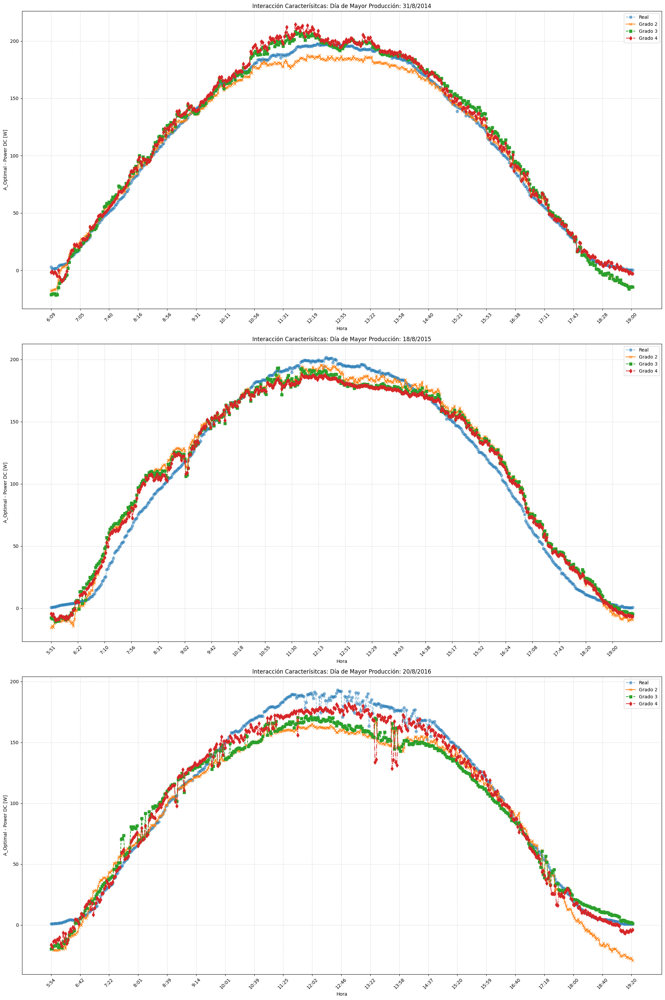

In [29]:
# Crear un DataFrame con los valores reales y predichos
comparacion = pd.DataFrame({
    'Real': y_train_copy.values.flatten(),
    'Predicción grado 2': y_train_pred_polinomico_2_featured.flatten(),
    'Predicción grado 3': y_train_pred_polinomico_3_featured.flatten(),
    'Predicción grado 4': y_train_pred_polinomico_4_featured.flatten(),
    'Mes': X_train_copy['Mes'].values.flatten(),
    'Año': X_train_copy['Año'].values.flatten(),
    'Día': X_train_copy['Día'].values.flatten(),
    'Hora': X_train_copy['Hora'].values.flatten(),
    'Minuto': X_train_copy['Minuto'].values.flatten()
})

# Encontrar el día de mayor producción de agosto para cada año
dias_mayor_produccion = {}
for year in [2014, 2015, 2016]:
    mes_agosto = comparacion[(comparacion['Año'] == year) & (comparacion['Mes'] == 8)]
    dia_mayor_produccion = mes_agosto.groupby('Día')['Real'].sum().idxmax()
    dias_mayor_produccion[year] = dia_mayor_produccion

# Crear la gráfica
fig, axes = plt.subplots(3, 1, figsize=(20, 30))

for i, year in enumerate([2014, 2015, 2016]):
    dia_mayor_produccion = dias_mayor_produccion[year]
    datos_dia_mayor = comparacion[(comparacion['Año'] == year) & (comparacion['Mes'] == 8) & (comparacion['Día'] == dia_mayor_produccion)]
    
    # Extraer las horas y minutos
    horas_minutos = datos_dia_mayor[['Hora', 'Minuto']].values
    vector_horas_minutos = [f"{int(hora)}:{int(minuto):02d}" for hora, minuto in horas_minutos]
    
    # Gráfica para el día de mayor producción de cada año
    ax = axes[i]
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', marker="o", linestyle="dashed", alpha=0.5)
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 2'], label='Grado 2', marker="x", linestyle="-")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 3'], label='Grado 3', marker="s", linestyle="--")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 4'], label='Grado 4', marker="d", linestyle="-.")
    ax.set_title(f'Interacción Caracterísitcas: Día de Mayor Producción: {int(dia_mayor_produccion)}/8/{year}')
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)

plt.tight_layout()
plt.show()

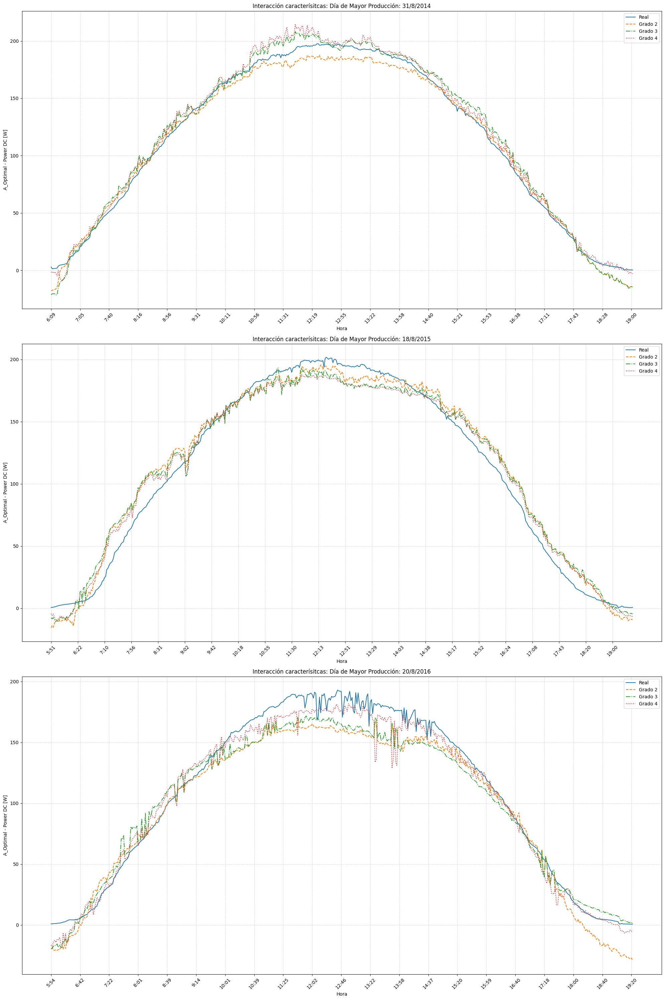

In [30]:
# Crear un DataFrame con los valores reales y predichos
comparacion = pd.DataFrame({
    'Real': y_train_copy.values.flatten(),
    'Predicción grado 2': y_train_pred_polinomico_2_featured.flatten(),
    'Predicción grado 3': y_train_pred_polinomico_3_featured.flatten(),
    'Predicción grado 4': y_train_pred_polinomico_4_featured.flatten(),
    'Mes': X_train_copy['Mes'].values.flatten(),
    'Año': X_train_copy['Año'].values.flatten(),
    'Día': X_train_copy['Día'].values.flatten(),
    'Hora': X_train_copy['Hora'].values.flatten(),
    'Minuto': X_train_copy['Minuto'].values.flatten()
})

# Encontrar el día de mayor producción de agosto para cada año
dias_mayor_produccion = {}
for year in [2014, 2015, 2016]:
    mes_agosto = comparacion[(comparacion['Año'] == year) & (comparacion['Mes'] == 8)]
    dia_mayor_produccion = mes_agosto.groupby('Día')['Real'].sum().idxmax()
    dias_mayor_produccion[year] = dia_mayor_produccion

# Crear la gráfica
fig, axes = plt.subplots(3, 1, figsize=(20, 30))

for i, year in enumerate([2014, 2015, 2016]):
    dia_mayor_produccion = dias_mayor_produccion[year]
    datos_dia_mayor = comparacion[(comparacion['Año'] == year) & (comparacion['Mes'] == 8) & (comparacion['Día'] == dia_mayor_produccion)]
    
    # Extraer las horas y minutos
    horas_minutos = datos_dia_mayor[['Hora', 'Minuto']].values
    vector_horas_minutos = [f"{int(hora)}:{int(minuto):02d}" for hora, minuto in horas_minutos]
    
    # Gráfica para el día de mayor producción de cada año
    ax = axes[i]
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', linestyle="solid")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 2'], label='Grado 2', linestyle="--")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 3'], label='Grado 3', linestyle="-.")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 4'], label='Grado 4', linestyle=":")
    ax.set_title(f'Interacción caracterísitcas: Día de Mayor Producción: {int(dia_mayor_produccion)}/8/{year}')
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)

plt.tight_layout()
plt.show()

In [ ]:
# Crear un DataFrame con los valores reales y predichos para RF_20est, RF_300est_16depth
comparacion = pd.DataFrame({
    'Real': y_train_copy.values.flatten(),
    'Predicción grado 2': y_train_pred_polinomico_2_featured.flatten(),
    'Predicción grado 3': y_train_pred_polinomico_3_featured.flatten(),
    'Predicción grado 4': y_train_pred_polinomico_4_featured.flatten(),
    'Mes': X_train_copy['Mes'].values.flatten(),
    'Año': X_train_copy['Año'].values.flatten(),
    'Día': X_train_copy['Día'].values.flatten(),
    'Hora': X_train_copy['Hora'].values.flatten(),
    'Minuto': X_train_copy['Minuto'].values.flatten()
})

# Encontrar el día de mayor producción de agosto para cada año
dias_mayor_produccion = {}
for year in [2014, 2015, 2016]:
    mes_agosto = comparacion[(comparacion['Año'] == year) & (comparacion['Mes'] == 8)]
    dia_mayor_produccion = mes_agosto.groupby('Día')['Real'].sum().idxmax()
    dias_mayor_produccion[year] = dia_mayor_produccion

# Crear la gráfica
fig, axes = plt.subplots(3, 3, figsize=(30, 20))

for i, year in enumerate([2014, 2015, 2016]):
    dia_mayor_produccion = dias_mayor_produccion[year]
    datos_dia_mayor = comparacion[(comparacion['Año'] == year) & (comparacion['Mes'] == 8) & (comparacion['Día'] == dia_mayor_produccion)]
    
    # Extraer las horas y minutos
    horas_minutos = datos_dia_mayor[['Hora', 'Minuto']].values
    vector_horas_minutos = [f"{int(hora)}:{int(minuto):02d}" for hora, minuto in horas_minutos]
    
    # Gráfica para el día de mayor producción de cada año - Grado 2
    ax = axes[0, i]
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', linestyle="solid")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 2'], label='Grado 2', linestyle="--")
    ax.set_title(f'Interacción características: Día de Mayor Producción: {int(dia_mayor_produccion)}/8/{year} - Polynomial Regression Grado 2')
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)
    
    # Gráfica para el día de mayor producción de cada año - Grado 3
    ax = axes[1, i]
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', linestyle="solid")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 3'], label='Grado 3', linestyle="--", color = 'black')
    ax.set_title(f'Interacción características: Día de Mayor Producción: {int(dia_mayor_produccion)}/8/{year} - Polynomial Regression Grado 3')
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)

    # Gráfica para el día de mayor producción de cada año - Grado 4
    ax = axes[2, i]
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', linestyle="solid")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 4'], label='Grado 4', linestyle="--", color = 'green')
    ax.set_title(f'Interacción características: Día de Mayor Producción: {int(dia_mayor_produccion)}/8/{year} - Polynomial Regression Grado 4')
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)

## 4.2 Energía 

In [32]:
import numpy as np
import pandas as pd

# Implementación manual del método de Simpson
def simpson_manual(y, x):
    n = len(x)
    if n < 2:
        raise ValueError("Se necesitan al menos dos puntos para calcular el área.")

    if len(y) != n:
        raise ValueError("El tamaño de los vectores x e y debe ser el mismo.")

    h = (x[-1] - x[0]) / (n - 1)  # Tamaño de los intervalos

    # Aplicar la regla de Simpson
    suma = y[0] + y[-1]  # y0 + yn
    for i in range(1, n - 1):
        if i % 2 == 0:
            suma += 2 * y[i]  # Coeficiente 2 para términos pares
        else:
            suma += 4 * y[i]  # Coeficiente 4 para términos impares
    area = h / 3 * suma
    return area

# Crear un DataFrame con los valores reales y predichos para Grado 2 y Grado 3
comparacion = pd.DataFrame({
    'Real': y_test_copy.values.flatten(),
    'Predicción Grado 2': y_test_pred_polinomico_2.flatten(),
    'Predicción Grado 3': y_test_pred_polinomico_3.flatten(),
    'Predicción Grado 2 interacción': y_test_pred_polinomico_2_featured.flatten(),
    'Predicción Grado 3 interacción': y_test_pred_polinomico_3_featured.flatten(),
    'Mes': X_test_copy['Mes'].values.flatten(),
    'Año': X_test_copy['Año'].values.flatten(),
    'Día': X_test_copy['Día'].values.flatten(),
    'Hora': X_test_copy['Hora'].values.flatten(),
    'Minuto': X_test_copy['Minuto'].values.flatten()
})

# Filtrar los datos para los años 2014, 2015 y 2016
datos_filtrados = comparacion[comparacion['Año'].isin([2014, 2015, 2016])]

# Inicializar una lista para almacenar los resultados
resultados_totales = []

# Iterar sobre cada día de los años 2014, 2015 y 2016
for year in [2014, 2015, 2016]:
    for mes in range(1, 13):
        for dia in range(1, 32):
            dia_datos = datos_filtrados[(datos_filtrados['Año'] == year) & (datos_filtrados['Mes'] == mes) & (datos_filtrados['Día'] == dia)]
            if not dia_datos.empty:
                y_real = dia_datos['Real'].values
                x = np.arange(len(y_real))
                
                for modelo in ['Predicción Grado 2', 'Predicción Grado 3', 'Predicción Grado 2 interacción', 'Predicción Grado 3 interacción']:
                    y_pred = dia_datos[modelo].values
                    area_real = simpson_manual(y_real, x)
                    area_pred = simpson_manual(y_pred, x)
                    error_relativo = abs(area_pred - area_real) / area_real * 100
                    mae = np.mean(np.abs(y_real - y_pred))

                    resultados_totales.append({
                        'Fecha': f'{dia}/{mes}/{year}',
                        'Modelo': modelo,
                        'Área Real': area_real,
                        'Área Predicha': area_pred,
                        'Error Relativo (%)': error_relativo,
                        'MAE': mae
                    })

# Crear un DataFrame con los resultados
df_resultados_totales = pd.DataFrame(resultados_totales)

# Mostrar el DataFrame con los resultados
print(df_resultados_totales)
print(df_resultados_totales.describe())
# Crear un diccionario para almacenar los DataFrames
dataframes_resultados = {}

# Lista de modelos
modelos = df_resultados_totales['Modelo'].unique()

# Crear un DataFrame para cada modelo y almacenarlo en el diccionario
for modelo in modelos:
    dataframes_resultados[modelo] = df_resultados_totales[df_resultados_totales['Modelo'] == modelo][['Área Real', 'Área Predicha', 'Error Relativo (%)', 'MAE']].copy()

# Mostrar los DataFrames creados
for modelo, df in dataframes_resultados.items():
    print(f"DataFrame para el modelo: {modelo}")
    print(df.head())
    print("\n")

#Describe de cada dataframe
for modelo, df in dataframes_resultados.items():
    print(f"Describe para el modelo: {modelo}")
    print(df.describe())
    print("\n")

           Fecha                          Modelo     Área Real  Área Predicha  \
0       1/1/2014              Predicción Grado 2   7263.634815    9094.570842   
1       1/1/2014              Predicción Grado 3   7263.634815    5578.823262   
2       1/1/2014  Predicción Grado 2 interacción   7263.634815    7960.781842   
3       1/1/2014  Predicción Grado 3 interacción   7263.634815    7615.763147   
4       2/1/2014              Predicción Grado 2   2024.465917    9696.680244   
...          ...                             ...           ...            ...   
3427  28/12/2016  Predicción Grado 3 interacción  11465.496500   11866.286541   
3428  29/12/2016              Predicción Grado 2  10255.539750    8393.680463   
3429  29/12/2016              Predicción Grado 3  10255.539750   11551.062144   
3430  29/12/2016  Predicción Grado 2 interacción  10255.539750    8329.004416   
3431  29/12/2016  Predicción Grado 3 interacción  10255.539750    9460.029124   

      Error Relativo (%)   

## 4.3 Guardar Modelo Interacciones 

In [ ]:
#Guardar el modelo de LinearRegression_model
import joblib
joblib.dump(modelo_polinomico_2_featured, 'model_A_PolynomialRegressionGrado2Interac.pkl')
joblib.dump(modelo_polinomico_3_featured, 'model_A_PolynomialRegressionGrado3Interac.pkl')

# 5. Comparación Polynomial Regression Grado 2, Grado 3 y Grado 4 vs Interacción Características

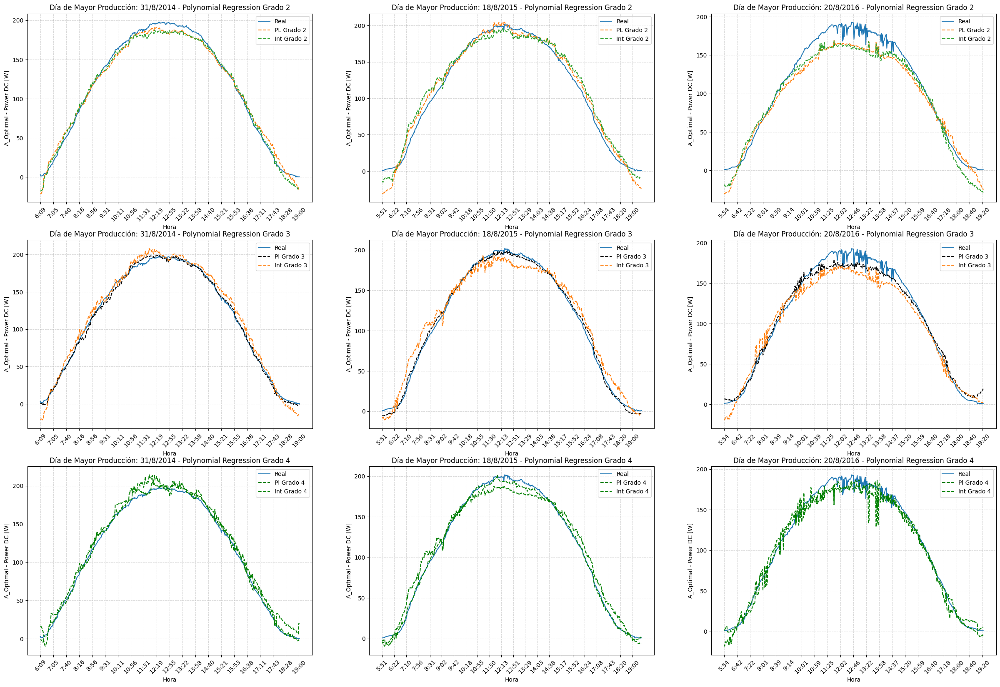

In [25]:
# Crear un DataFrame con los valores reales y predichos para RF_20est, RF_300est_16depth
comparacion = pd.DataFrame({
    'Real': y_train_copy.values.flatten(),
    'Predicción grado 2': y_train_pred_polinomico_2.flatten(),
    'Predicción grado 3': y_train_pred_polinomico_3.flatten(),
    'Predicción grado 4': y_train_pred_polinomico_4.flatten(),
    'Predicción Interacción grado 2': y_train_pred_polinomico_2_featured.flatten(),
    'Predicción Interacción grado 3': y_train_pred_polinomico_3_featured.flatten(),
    'Predicción Interacción grado 4': y_train_pred_polinomico_4_featured.flatten(),
    'Mes': X_train_copy['Mes'].values.flatten(),
    'Año': X_train_copy['Año'].values.flatten(),
    'Día': X_train_copy['Día'].values.flatten(),
    'Hora': X_train_copy['Hora'].values.flatten(),
    'Minuto': X_train_copy['Minuto'].values.flatten()
})

# Encontrar el día de mayor producción de agosto para cada año
dias_mayor_produccion = {}
for year in [2014, 2015, 2016]:
    mes_agosto = comparacion[(comparacion['Año'] == year) & (comparacion['Mes'] == 8)]
    dia_mayor_produccion = mes_agosto.groupby('Día')['Real'].sum().idxmax()
    dias_mayor_produccion[year] = dia_mayor_produccion

# Crear la gráfica
fig, axes = plt.subplots(3, 3, figsize=(30, 20))

for i, year in enumerate([2014, 2015, 2016]):
    dia_mayor_produccion = dias_mayor_produccion[year]
    datos_dia_mayor = comparacion[(comparacion['Año'] == year) & (comparacion['Mes'] == 8) & (comparacion['Día'] == dia_mayor_produccion)]
    
    # Extraer las horas y minutos
    horas_minutos = datos_dia_mayor[['Hora', 'Minuto']].values
    vector_horas_minutos = [f"{int(hora)}:{int(minuto):02d}" for hora, minuto in horas_minutos]
    
    # Gráfica para el día de mayor producción de cada año - Grado 2
    ax = axes[0, i]
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', linestyle="solid")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 2'], label='PL Grado 2', linestyle="--")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción Interacción grado 2'], label='Int Grado 2', linestyle="--")
    ax.set_title(f'Día de Mayor Producción: {int(dia_mayor_produccion)}/8/{year} - Polynomial Regression Grado 2')
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)
    
    # Gráfica para el día de mayor producción de cada año - Grado 3
    ax = axes[1, i]
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', linestyle="solid")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 3'], label='Pl Grado 3', linestyle="--", color = 'black')
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción Interacción grado 3'], label='Int Grado 3', linestyle="--")
    ax.set_title(f'Día de Mayor Producción: {int(dia_mayor_produccion)}/8/{year} - Polynomial Regression Grado 3')
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)

    # Gráfica para el día de mayor producción de cada año - Grado 4
    ax = axes[2, i]
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', linestyle="solid")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 4'], label='Pl Grado 4', linestyle="--", color = 'green')
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción Interacción grado 4'], label='Int Grado 4', linestyle="--", color = 'green')
    ax.set_title(f'Día de Mayor Producción: {int(dia_mayor_produccion)}/8/{year} - Polynomial Regression Grado 4')
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)

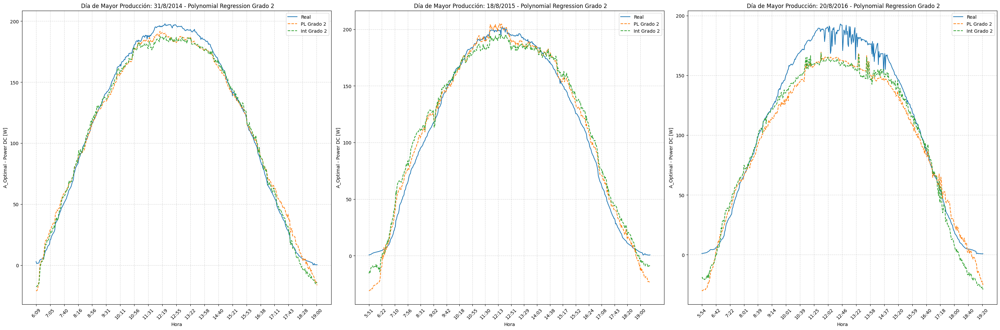

In [26]:
comparacion = pd.DataFrame({
    'Real': y_train_copy.values.flatten(),
    'Predicción grado 2': y_train_pred_polinomico_2.flatten(),
    'Predicción Interacción grado 2': y_train_pred_polinomico_2_featured.flatten(),
    'Mes': X_train_copy['Mes'].values.flatten(),
    'Año': X_train_copy['Año'].values.flatten(),
    'Día': X_train_copy['Día'].values.flatten(),
    'Hora': X_train_copy['Hora'].values.flatten(),
    'Minuto': X_train_copy['Minuto'].values.flatten()
})

# Encontrar el día de mayor producción de agosto para cada año
dias_mayor_produccion = {}
for year in [2014, 2015, 2016]:
    mes_agosto = comparacion[(comparacion['Año'] == year) & (comparacion['Mes'] == 8)]
    dia_mayor_produccion = mes_agosto.groupby('Día')['Real'].sum().idxmax()
    dias_mayor_produccion[year] = dia_mayor_produccion

# Crear la gráfica
fig, axes = plt.subplots(1, 3, figsize=(30, 10))

for i, year in enumerate([2014, 2015, 2016]):
    dia_mayor_produccion = dias_mayor_produccion[year]
    datos_dia_mayor = comparacion[(comparacion['Año'] == year) & (comparacion['Mes'] == 8) & (comparacion['Día'] == dia_mayor_produccion)]
    
    # Extraer las horas y minutos
    horas_minutos = datos_dia_mayor[['Hora', 'Minuto']].values
    vector_horas_minutos = [f"{int(hora)}:{int(minuto):02d}" for hora, minuto in horas_minutos]
    
    # Gráfica para el día de mayor producción de cada año - Grado 2
    ax = axes[i]
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', linestyle="solid")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 2'], label='PL Grado 2', linestyle="--")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción Interacción grado 2'], label='Int Grado 2', linestyle="--")
    ax.set_title(f' Día de Mayor Producción: {int(dia_mayor_produccion)}/8/{year} - Polynomial Regression Grado 2')
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)

plt.tight_layout()
plt.show()


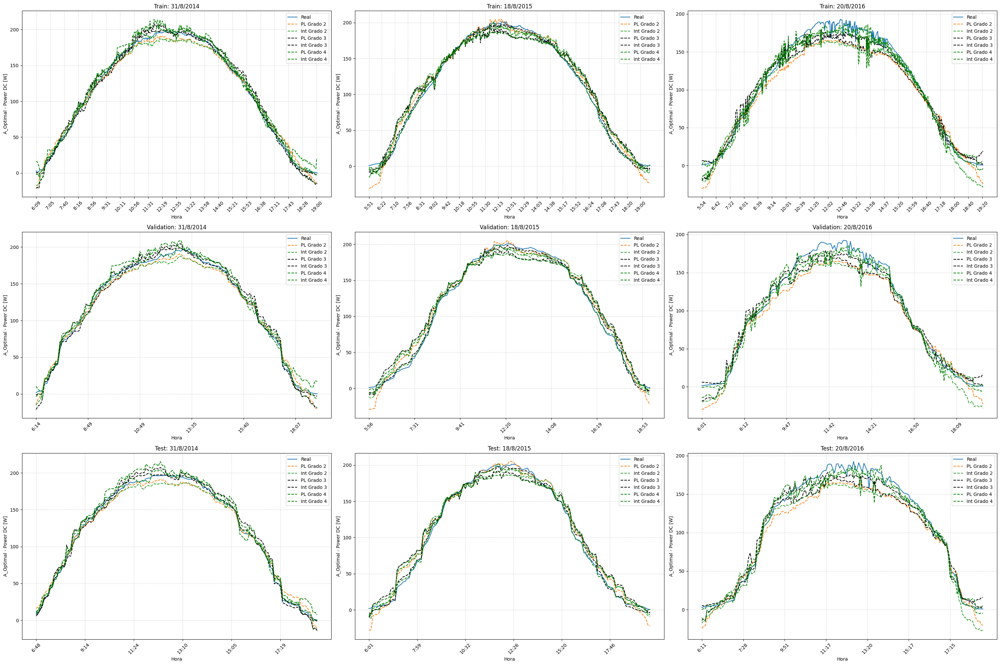

In [293]:
# Crear un DataFrame con los valores reales y predichos para el conjunto de entrenamiento
comparacion_train = pd.DataFrame({
    'Real': y_train_copy.values.flatten(),
    'Predicción grado 2': y_train_pred_polinomico_2.flatten(),
    'Predicción grado 3': y_train_pred_polinomico_3.flatten(),
    'Predicción grado 4': y_train_pred_polinomico_4.flatten(),
    'Predicción Interacción grado 2': y_train_pred_polinomico_2_featured.flatten(),
    'Predicción Interacción grado 3': y_train_pred_polinomico_3_featured.flatten(),
    'Predicción Interacción grado 4': y_train_pred_polinomico_4_featured.flatten(),
    'Mes': X_train_copy['Mes'].values.flatten(),
    'Año': X_train_copy['Año'].values.flatten(),
    'Día': X_train_copy['Día'].values.flatten(),
    'Hora': X_train_copy['Hora'].values.flatten(),
    'Minuto': X_train_copy['Minuto'].values.flatten()
})

# Crear un DataFrame con los valores reales y predichos para el conjunto de validación
comparacion_val = pd.DataFrame({
    'Real': y_val_copy.values.flatten(),
    'Predicción grado 2': y_val_pred_polinomico_2.flatten(),
    'Predicción grado 3': y_val_pred_polinomico_3.flatten(),
    'Predicción grado 4': y_val_pred_polinomico_4.flatten(),
    'Predicción Interacción grado 2': y_val_pred_polinomico_2_featured.flatten(),
    'Predicción Interacción grado 3': y_val_pred_polinomico_3_featured.flatten(),
    'Predicción Interacción grado 4': y_val_pred_polinomico_4_featured.flatten(),
    'Mes': X_val_copy['Mes'].values.flatten(),
    'Año': X_val_copy['Año'].values.flatten(),
    'Día': X_val_copy['Día'].values.flatten(),
    'Hora': X_val_copy['Hora'].values.flatten(),
    'Minuto': X_val_copy['Minuto'].values.flatten()
})

# Crear un DataFrame con los valores reales y predichos para el conjunto de prueba
comparacion_test = pd.DataFrame({
    'Real': y_test_copy.values.flatten(),
    'Predicción grado 2': y_test_pred_polinomico_2.flatten(),
    'Predicción grado 3': y_test_pred_polinomico_3.flatten(),
    'Predicción grado 4': y_test_pred_polinomico_4.flatten(),
    'Predicción Interacción grado 2': y_test_pred_polinomico_2_featured.flatten(),
    'Predicción Interacción grado 3': y_test_pred_polinomico_3_featured.flatten(),
    'Predicción Interacción grado 4': y_test_pred_polinomico_4_featured.flatten(),
    'Mes': X_test_copy['Mes'].values.flatten(),
    'Año': X_test_copy['Año'].values.flatten(),
    'Día': X_test_copy['Día'].values.flatten(),
    'Hora': X_test_copy['Hora'].values.flatten(),
    'Minuto': X_test_copy['Minuto'].values.flatten()
})

# Crear la figura y los subplots
fig, axes = plt.subplots(3, 3, figsize=(30, 20))

# Función para graficar los datos
def plot_data(ax, datos, year, title):
    dia_mayor_produccion = dias_mayor_produccion[year]
    datos_dia_mayor = datos[(datos['Año'] == year) & (datos['Mes'] == 8) & (datos['Día'] == dia_mayor_produccion)]
    
    # Extraer las horas y minutos
    horas_minutos = datos_dia_mayor[['Hora', 'Minuto']].values
    vector_horas_minutos = [f"{int(hora)}:{int(minuto):02d}" for hora, minuto in horas_minutos]
    
    # Gráfica para el día de mayor producción de cada año
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', linestyle="solid")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 2'], label='PL Grado 2', linestyle="--")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción Interacción grado 2'], label='Int Grado 2', linestyle="--")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 3'], label='PL Grado 3', linestyle="--", color='black')
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción Interacción grado 3'], label='Int Grado 3', linestyle="--", color='black')
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 4'], label='PL Grado 4', linestyle="--", color='green')
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción Interacción grado 4'], label='Int Grado 4', linestyle="--", color='green')
    ax.set_title(title)
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)

# Graficar los datos para cada conjunto y cada año
for i, year in enumerate([2014, 2015, 2016]):
    plot_data(axes[0, i], comparacion_train, year, f'Train: {int(dias_mayor_produccion[year])}/8/{year}')
    plot_data(axes[1, i], comparacion_val, year, f'Validation: {int(dias_mayor_produccion[year])}/8/{year}')
    plot_data(axes[2, i], comparacion_test, year, f'Test: {int(dias_mayor_produccion[year])}/8/{year}')

plt.tight_layout()
plt.show()

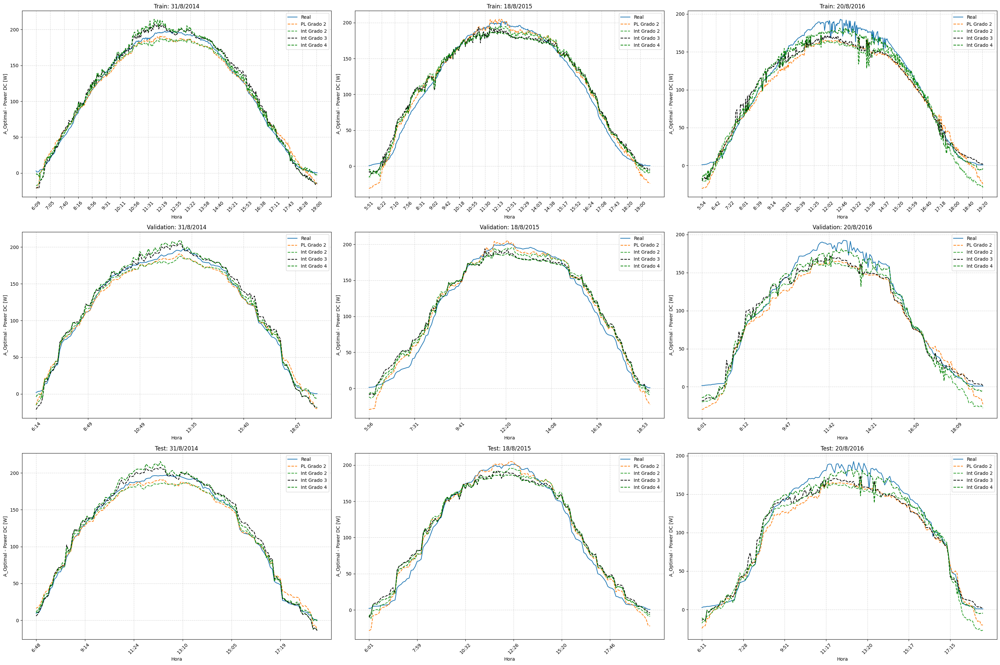

In [294]:
# Crear un DataFrame con los valores reales y predichos para el conjunto de entrenamiento
comparacion_train = pd.DataFrame({
    'Real': y_train_copy.values.flatten(),
    'Predicción grado 2': y_train_pred_polinomico_2.flatten(),
    'Predicción Interacción grado 2': y_train_pred_polinomico_2_featured.flatten(),
    'Predicción Interacción grado 3': y_train_pred_polinomico_3_featured.flatten(),
    'Predicción Interacción grado 4': y_train_pred_polinomico_4_featured.flatten(),
    'Mes': X_train_copy['Mes'].values.flatten(),
    'Año': X_train_copy['Año'].values.flatten(),
    'Día': X_train_copy['Día'].values.flatten(),
    'Hora': X_train_copy['Hora'].values.flatten(),
    'Minuto': X_train_copy['Minuto'].values.flatten()
})

# Crear un DataFrame con los valores reales y predichos para el conjunto de validación
comparacion_val = pd.DataFrame({
    'Real': y_val_copy.values.flatten(),
    'Predicción grado 2': y_val_pred_polinomico_2.flatten(),
    'Predicción Interacción grado 2': y_val_pred_polinomico_2_featured.flatten(),
    'Predicción Interacción grado 3': y_val_pred_polinomico_3_featured.flatten(),
    'Predicción Interacción grado 4': y_val_pred_polinomico_4_featured.flatten(),
    'Mes': X_val_copy['Mes'].values.flatten(),
    'Año': X_val_copy['Año'].values.flatten(),
    'Día': X_val_copy['Día'].values.flatten(),
    'Hora': X_val_copy['Hora'].values.flatten(),
    'Minuto': X_val_copy['Minuto'].values.flatten()
})

# Crear un DataFrame con los valores reales y predichos para el conjunto de prueba
comparacion_test = pd.DataFrame({
    'Real': y_test_copy.values.flatten(),
    'Predicción grado 2': y_test_pred_polinomico_2.flatten(),
    'Predicción Interacción grado 2': y_test_pred_polinomico_2_featured.flatten(),
    'Predicción Interacción grado 3': y_test_pred_polinomico_3_featured.flatten(),
    'Predicción Interacción grado 4': y_test_pred_polinomico_4_featured.flatten(),
    'Mes': X_test_copy['Mes'].values.flatten(),
    'Año': X_test_copy['Año'].values.flatten(),
    'Día': X_test_copy['Día'].values.flatten(),
    'Hora': X_test_copy['Hora'].values.flatten(),
    'Minuto': X_test_copy['Minuto'].values.flatten()
})

# Crear la figura y los subplots
fig, axes = plt.subplots(3, 3, figsize=(30, 20))

# Función para graficar los datos
def plot_data(ax, datos, year, title):
    dia_mayor_produccion = dias_mayor_produccion[year]
    datos_dia_mayor = datos[(datos['Año'] == year) & (datos['Mes'] == 8) & (datos['Día'] == dia_mayor_produccion)]
    
    # Extraer las horas y minutos
    horas_minutos = datos_dia_mayor[['Hora', 'Minuto']].values
    vector_horas_minutos = [f"{int(hora)}:{int(minuto):02d}" for hora, minuto in horas_minutos]
    
    # Gráfica para el día de mayor producción de cada año
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', linestyle="solid")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 2'], label='PL Grado 2', linestyle="--")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción Interacción grado 2'], label='Int Grado 2', linestyle="--")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción Interacción grado 3'], label='Int Grado 3', linestyle="--", color='black')
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción Interacción grado 4'], label='Int Grado 4', linestyle="--", color='green')
    ax.set_title(title)
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)

# Graficar los datos para cada conjunto y cada año
for i, year in enumerate([2014, 2015, 2016]):
    plot_data(axes[0, i], comparacion_train, year, f'Train: {int(dias_mayor_produccion[year])}/8/{year}')
    plot_data(axes[1, i], comparacion_val, year, f'Validation: {int(dias_mayor_produccion[year])}/8/{year}')
    plot_data(axes[2, i], comparacion_test, year, f'Test: {int(dias_mayor_produccion[year])}/8/{year}')

plt.tight_layout()
plt.show()

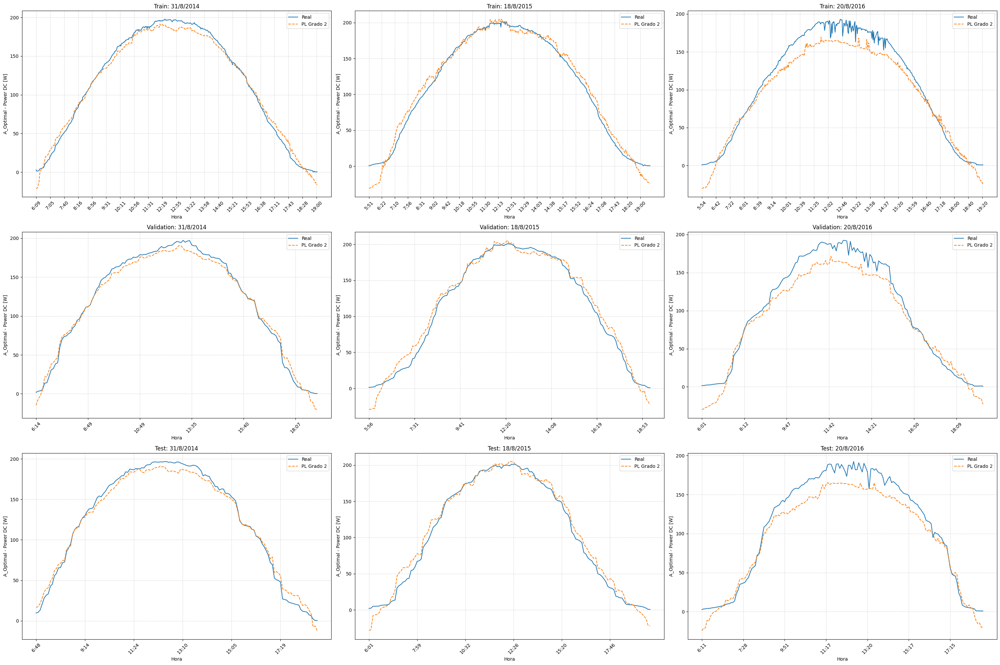

In [295]:
# Crear un DataFrame con los valores reales y predichos para el conjunto de entrenamiento
comparacion_train = pd.DataFrame({
    'Real': y_train_copy.values.flatten(),
    'Predicción grado 2': y_train_pred_polinomico_2.flatten(),
    'Predicción Interacción grado 2': y_train_pred_polinomico_2_featured.flatten(),
    'Predicción Interacción grado 3': y_train_pred_polinomico_3_featured.flatten(),
    'Predicción Interacción grado 4': y_train_pred_polinomico_4_featured.flatten(),
    'Mes': X_train_copy['Mes'].values.flatten(),
    'Año': X_train_copy['Año'].values.flatten(),
    'Día': X_train_copy['Día'].values.flatten(),
    'Hora': X_train_copy['Hora'].values.flatten(),
    'Minuto': X_train_copy['Minuto'].values.flatten()
})

# Crear un DataFrame con los valores reales y predichos para el conjunto de validación
comparacion_val = pd.DataFrame({
    'Real': y_val_copy.values.flatten(),
    'Predicción grado 2': y_val_pred_polinomico_2.flatten(),
    'Predicción Interacción grado 2': y_val_pred_polinomico_2_featured.flatten(),
    'Predicción Interacción grado 3': y_val_pred_polinomico_3_featured.flatten(),
    'Predicción Interacción grado 4': y_val_pred_polinomico_4_featured.flatten(),
    'Mes': X_val_copy['Mes'].values.flatten(),
    'Año': X_val_copy['Año'].values.flatten(),
    'Día': X_val_copy['Día'].values.flatten(),
    'Hora': X_val_copy['Hora'].values.flatten(),
    'Minuto': X_val_copy['Minuto'].values.flatten()
})

# Crear un DataFrame con los valores reales y predichos para el conjunto de prueba
comparacion_test = pd.DataFrame({
    'Real': y_test_copy.values.flatten(),
    'Predicción grado 2': y_test_pred_polinomico_2.flatten(),
    'Predicción Interacción grado 2': y_test_pred_polinomico_2_featured.flatten(),
    'Predicción Interacción grado 3': y_test_pred_polinomico_3_featured.flatten(),
    'Predicción Interacción grado 4': y_test_pred_polinomico_4_featured.flatten(),
    'Mes': X_test_copy['Mes'].values.flatten(),
    'Año': X_test_copy['Año'].values.flatten(),
    'Día': X_test_copy['Día'].values.flatten(),
    'Hora': X_test_copy['Hora'].values.flatten(),
    'Minuto': X_test_copy['Minuto'].values.flatten()
})

# Crear la figura y los subplots
fig, axes = plt.subplots(3, 3, figsize=(30, 20))

# Función para graficar los datos
def plot_data(ax, datos, year, title):
    dia_mayor_produccion = dias_mayor_produccion[year]
    datos_dia_mayor = datos[(datos['Año'] == year) & (datos['Mes'] == 8) & (datos['Día'] == dia_mayor_produccion)]
    
    # Extraer las horas y minutos
    horas_minutos = datos_dia_mayor[['Hora', 'Minuto']].values
    vector_horas_minutos = [f"{int(hora)}:{int(minuto):02d}" for hora, minuto in horas_minutos]
    
    # Gráfica para el día de mayor producción de cada año
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', linestyle="solid")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción grado 2'], label='PL Grado 2', linestyle="--")
    ax.set_title(title)
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)

# Graficar los datos para cada conjunto y cada año
for i, year in enumerate([2014, 2015, 2016]):
    plot_data(axes[0, i], comparacion_train, year, f'Train: {int(dias_mayor_produccion[year])}/8/{year}')
    plot_data(axes[1, i], comparacion_val, year, f'Validation: {int(dias_mayor_produccion[year])}/8/{year}')
    plot_data(axes[2, i], comparacion_test, year, f'Test: {int(dias_mayor_produccion[year])}/8/{year}')

plt.tight_layout()
plt.show()

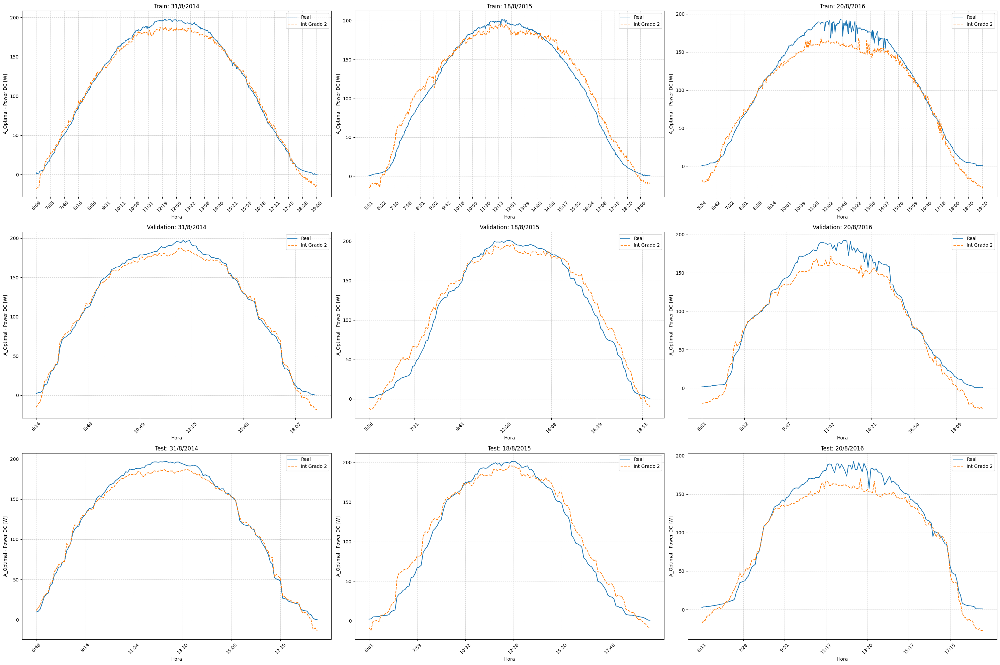

In [296]:
# Crear un DataFrame con los valores reales y predichos para el conjunto de entrenamiento
comparacion_train = pd.DataFrame({
    'Real': y_train_copy.values.flatten(),
    'Predicción grado 2': y_train_pred_polinomico_2.flatten(),
    'Predicción Interacción grado 2': y_train_pred_polinomico_2_featured.flatten(),
    'Predicción Interacción grado 3': y_train_pred_polinomico_3_featured.flatten(),
    'Predicción Interacción grado 4': y_train_pred_polinomico_4_featured.flatten(),
    'Mes': X_train_copy['Mes'].values.flatten(),
    'Año': X_train_copy['Año'].values.flatten(),
    'Día': X_train_copy['Día'].values.flatten(),
    'Hora': X_train_copy['Hora'].values.flatten(),
    'Minuto': X_train_copy['Minuto'].values.flatten()
})

# Crear un DataFrame con los valores reales y predichos para el conjunto de validación
comparacion_val = pd.DataFrame({
    'Real': y_val_copy.values.flatten(),
    'Predicción grado 2': y_val_pred_polinomico_2.flatten(),
    'Predicción Interacción grado 2': y_val_pred_polinomico_2_featured.flatten(),
    'Predicción Interacción grado 3': y_val_pred_polinomico_3_featured.flatten(),
    'Predicción Interacción grado 4': y_val_pred_polinomico_4_featured.flatten(),
    'Mes': X_val_copy['Mes'].values.flatten(),
    'Año': X_val_copy['Año'].values.flatten(),
    'Día': X_val_copy['Día'].values.flatten(),
    'Hora': X_val_copy['Hora'].values.flatten(),
    'Minuto': X_val_copy['Minuto'].values.flatten()
})

# Crear un DataFrame con los valores reales y predichos para el conjunto de prueba
comparacion_test = pd.DataFrame({
    'Real': y_test_copy.values.flatten(),
    'Predicción grado 2': y_test_pred_polinomico_2.flatten(),
    'Predicción Interacción grado 2': y_test_pred_polinomico_2_featured.flatten(),
    'Predicción Interacción grado 3': y_test_pred_polinomico_3_featured.flatten(),
    'Predicción Interacción grado 4': y_test_pred_polinomico_4_featured.flatten(),
    'Mes': X_test_copy['Mes'].values.flatten(),
    'Año': X_test_copy['Año'].values.flatten(),
    'Día': X_test_copy['Día'].values.flatten(),
    'Hora': X_test_copy['Hora'].values.flatten(),
    'Minuto': X_test_copy['Minuto'].values.flatten()
})

# Crear la figura y los subplots
fig, axes = plt.subplots(3, 3, figsize=(30, 20))

# Función para graficar los datos
def plot_data(ax, datos, year, title):
    dia_mayor_produccion = dias_mayor_produccion[year]
    datos_dia_mayor = datos[(datos['Año'] == year) & (datos['Mes'] == 8) & (datos['Día'] == dia_mayor_produccion)]
    
    # Extraer las horas y minutos
    horas_minutos = datos_dia_mayor[['Hora', 'Minuto']].values
    vector_horas_minutos = [f"{int(hora)}:{int(minuto):02d}" for hora, minuto in horas_minutos]
    
    # Gráfica para el día de mayor producción de cada año
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', linestyle="solid")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción Interacción grado 2'], label='Int Grado 2', linestyle="--")
    ax.set_title(title)
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)

# Graficar los datos para cada conjunto y cada año
for i, year in enumerate([2014, 2015, 2016]):
    plot_data(axes[0, i], comparacion_train, year, f'Train: {int(dias_mayor_produccion[year])}/8/{year}')
    plot_data(axes[1, i], comparacion_val, year, f'Validation: {int(dias_mayor_produccion[year])}/8/{year}')
    plot_data(axes[2, i], comparacion_test, year, f'Test: {int(dias_mayor_produccion[year])}/8/{year}')

plt.tight_layout()
plt.show()

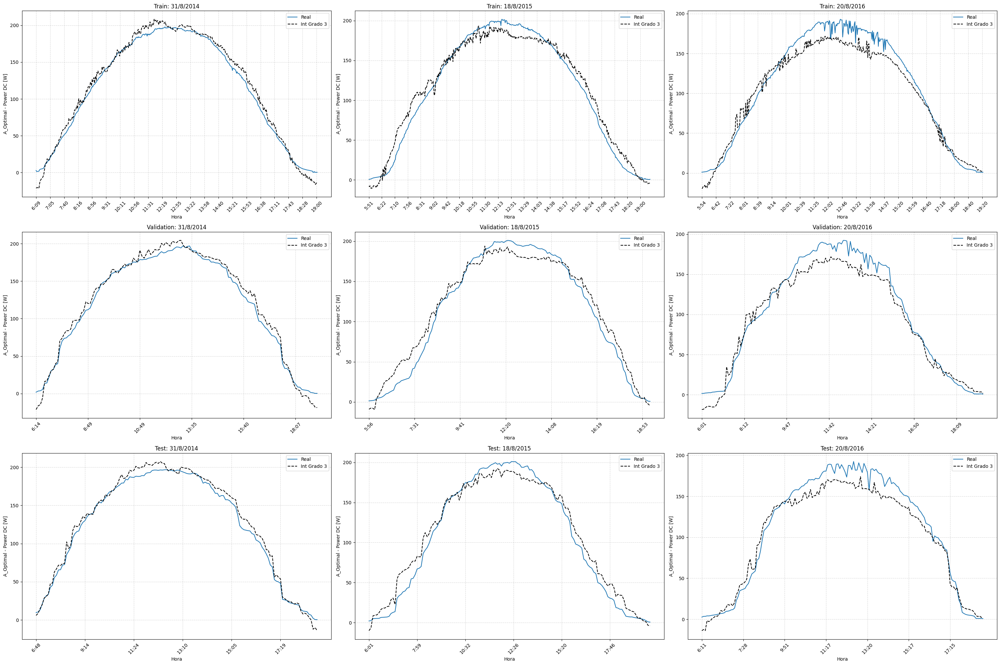

In [297]:
# Crear un DataFrame con los valores reales y predichos para el conjunto de entrenamiento
comparacion_train = pd.DataFrame({
    'Real': y_train_copy.values.flatten(),
    'Predicción grado 2': y_train_pred_polinomico_2.flatten(),
    'Predicción Interacción grado 2': y_train_pred_polinomico_2_featured.flatten(),
    'Predicción Interacción grado 3': y_train_pred_polinomico_3_featured.flatten(),
    'Predicción Interacción grado 4': y_train_pred_polinomico_4_featured.flatten(),
    'Mes': X_train_copy['Mes'].values.flatten(),
    'Año': X_train_copy['Año'].values.flatten(),
    'Día': X_train_copy['Día'].values.flatten(),
    'Hora': X_train_copy['Hora'].values.flatten(),
    'Minuto': X_train_copy['Minuto'].values.flatten()
})

# Crear un DataFrame con los valores reales y predichos para el conjunto de validación
comparacion_val = pd.DataFrame({
    'Real': y_val_copy.values.flatten(),
    'Predicción grado 2': y_val_pred_polinomico_2.flatten(),
    'Predicción Interacción grado 2': y_val_pred_polinomico_2_featured.flatten(),
    'Predicción Interacción grado 3': y_val_pred_polinomico_3_featured.flatten(),
    'Predicción Interacción grado 4': y_val_pred_polinomico_4_featured.flatten(),
    'Mes': X_val_copy['Mes'].values.flatten(),
    'Año': X_val_copy['Año'].values.flatten(),
    'Día': X_val_copy['Día'].values.flatten(),
    'Hora': X_val_copy['Hora'].values.flatten(),
    'Minuto': X_val_copy['Minuto'].values.flatten()
})

# Crear un DataFrame con los valores reales y predichos para el conjunto de prueba
comparacion_test = pd.DataFrame({
    'Real': y_test_copy.values.flatten(),
    'Predicción grado 2': y_test_pred_polinomico_2.flatten(),
    'Predicción Interacción grado 2': y_test_pred_polinomico_2_featured.flatten(),
    'Predicción Interacción grado 3': y_test_pred_polinomico_3_featured.flatten(),
    'Predicción Interacción grado 4': y_test_pred_polinomico_4_featured.flatten(),
    'Mes': X_test_copy['Mes'].values.flatten(),
    'Año': X_test_copy['Año'].values.flatten(),
    'Día': X_test_copy['Día'].values.flatten(),
    'Hora': X_test_copy['Hora'].values.flatten(),
    'Minuto': X_test_copy['Minuto'].values.flatten()
})

# Crear la figura y los subplots
fig, axes = plt.subplots(3, 3, figsize=(30, 20))

# Función para graficar los datos
def plot_data(ax, datos, year, title):
    dia_mayor_produccion = dias_mayor_produccion[year]
    datos_dia_mayor = datos[(datos['Año'] == year) & (datos['Mes'] == 8) & (datos['Día'] == dia_mayor_produccion)]
    
    # Extraer las horas y minutos
    horas_minutos = datos_dia_mayor[['Hora', 'Minuto']].values
    vector_horas_minutos = [f"{int(hora)}:{int(minuto):02d}" for hora, minuto in horas_minutos]
    
    # Gráfica para el día de mayor producción de cada año
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', linestyle="solid")

    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción Interacción grado 3'], label='Int Grado 3', linestyle="--", color='black')

    ax.set_title(title)
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)

# Graficar los datos para cada conjunto y cada año
for i, year in enumerate([2014, 2015, 2016]):
    plot_data(axes[0, i], comparacion_train, year, f'Train: {int(dias_mayor_produccion[year])}/8/{year}')
    plot_data(axes[1, i], comparacion_val, year, f'Validation: {int(dias_mayor_produccion[year])}/8/{year}')
    plot_data(axes[2, i], comparacion_test, year, f'Test: {int(dias_mayor_produccion[year])}/8/{year}')

plt.tight_layout()
plt.show()

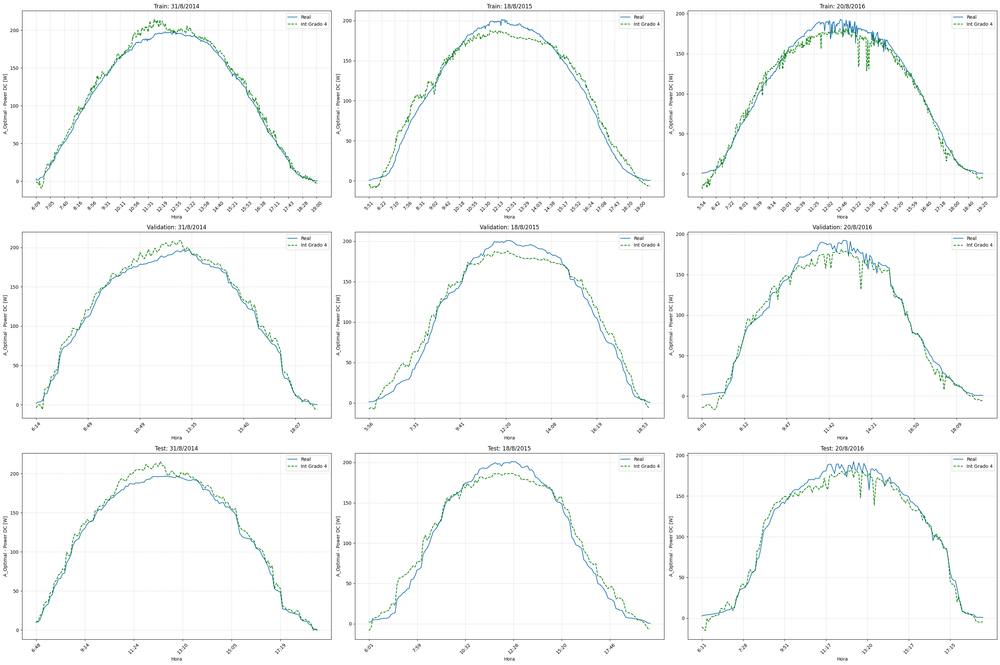

In [298]:
# Crear un DataFrame con los valores reales y predichos para el conjunto de entrenamiento
comparacion_train = pd.DataFrame({
    'Real': y_train_copy.values.flatten(),
    'Predicción grado 2': y_train_pred_polinomico_2.flatten(),
    'Predicción Interacción grado 2': y_train_pred_polinomico_2_featured.flatten(),
    'Predicción Interacción grado 3': y_train_pred_polinomico_3_featured.flatten(),
    'Predicción Interacción grado 4': y_train_pred_polinomico_4_featured.flatten(),
    'Mes': X_train_copy['Mes'].values.flatten(),
    'Año': X_train_copy['Año'].values.flatten(),
    'Día': X_train_copy['Día'].values.flatten(),
    'Hora': X_train_copy['Hora'].values.flatten(),
    'Minuto': X_train_copy['Minuto'].values.flatten()
})

# Crear un DataFrame con los valores reales y predichos para el conjunto de validación
comparacion_val = pd.DataFrame({
    'Real': y_val_copy.values.flatten(),
    'Predicción grado 2': y_val_pred_polinomico_2.flatten(),
    'Predicción Interacción grado 2': y_val_pred_polinomico_2_featured.flatten(),
    'Predicción Interacción grado 3': y_val_pred_polinomico_3_featured.flatten(),
    'Predicción Interacción grado 4': y_val_pred_polinomico_4_featured.flatten(),
    'Mes': X_val_copy['Mes'].values.flatten(),
    'Año': X_val_copy['Año'].values.flatten(),
    'Día': X_val_copy['Día'].values.flatten(),
    'Hora': X_val_copy['Hora'].values.flatten(),
    'Minuto': X_val_copy['Minuto'].values.flatten()
})

# Crear un DataFrame con los valores reales y predichos para el conjunto de prueba
comparacion_test = pd.DataFrame({
    'Real': y_test_copy.values.flatten(),
    'Predicción grado 2': y_test_pred_polinomico_2.flatten(),
    'Predicción Interacción grado 2': y_test_pred_polinomico_2_featured.flatten(),
    'Predicción Interacción grado 3': y_test_pred_polinomico_3_featured.flatten(),
    'Predicción Interacción grado 4': y_test_pred_polinomico_4_featured.flatten(),
    'Mes': X_test_copy['Mes'].values.flatten(),
    'Año': X_test_copy['Año'].values.flatten(),
    'Día': X_test_copy['Día'].values.flatten(),
    'Hora': X_test_copy['Hora'].values.flatten(),
    'Minuto': X_test_copy['Minuto'].values.flatten()
})

# Crear la figura y los subplots
fig, axes = plt.subplots(3, 3, figsize=(30, 20))

# Función para graficar los datos
def plot_data(ax, datos, year, title):
    dia_mayor_produccion = dias_mayor_produccion[year]
    datos_dia_mayor = datos[(datos['Año'] == year) & (datos['Mes'] == 8) & (datos['Día'] == dia_mayor_produccion)]
    
    # Extraer las horas y minutos
    horas_minutos = datos_dia_mayor[['Hora', 'Minuto']].values
    vector_horas_minutos = [f"{int(hora)}:{int(minuto):02d}" for hora, minuto in horas_minutos]
    
    # Gráfica para el día de mayor producción de cada año
    ax.plot(vector_horas_minutos, datos_dia_mayor['Real'], label='Real', linestyle="solid")
    ax.plot(vector_horas_minutos, datos_dia_mayor['Predicción Interacción grado 4'], label='Int Grado 4', linestyle="--", color='green')
    ax.set_title(title)
    ax.set_xlabel('Hora')
    ax.set_ylabel('A_Optimal - Power DC [W]')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, len(vector_horas_minutos), 24))
    ax.set_xticklabels(vector_horas_minutos[::24], rotation=45)

# Graficar los datos para cada conjunto y cada año
for i, year in enumerate([2014, 2015, 2016]):
    plot_data(axes[0, i], comparacion_train, year, f'Train: {int(dias_mayor_produccion[year])}/8/{year}')
    plot_data(axes[1, i], comparacion_val, year, f'Validation: {int(dias_mayor_produccion[year])}/8/{year}')
    plot_data(axes[2, i], comparacion_test, year, f'Test: {int(dias_mayor_produccion[year])}/8/{year}')

plt.tight_layout()
plt.show()

In [300]:
import pandas as pd

# Crear un DataFrame con los resultados de las métricas combinadas
resultados_combinados = pd.DataFrame({
    'Conjunto de Datos': ['Train', 'Validation', 'Test'],
    'MSE grado 2': [mse_train_polinomico_2, mse_val_polinomico_2, mse_test_polinomico_2],
    'MSE grado 2 escalado': [mse_train_polinomico_2_scaled, mse_val_polinomico_2_scaled, mse_test_polinomico_2_scaled],
    'MSE grado 3': [mse_train_polinomico_3, mse_val_polinomico_3, mse_test_polinomico_3],
    'MSE grado 3 escalado': [mse_train_polinomico_3_scaled, mse_val_polinomico_3_scaled, mse_test_polinomico_3_scaled],
    'MSE grado 4': [mse_train_polinomico_4, mse_val_polinomico_4, mse_test_polinomico_4],
    'MSE grado 4 escalado': [mse_train_polinomico_4_scaled, mse_val_polinomico_4_scaled, mse_test_polinomico_4_scaled],
    'MSE grado 2 featured': [mse_train_polinomico_2_featured, mse_val_polinomico_2_featured, mse_test_polinomico_2_featured],
    'MSE grado 2 escalado featured': [mse_train_polinomico_2_scaled_featured, mse_val_polinomico_2_scaled_featured, mse_test_polinomico_2_scaled_featured],
    'MSE grado 3 escalado featured': [mse_train_polinomico_3_scaled_featured, mse_val_polinomico_3_scaled_featured, mse_test_polinomico_3_scaled_featured],
    'MSE grado 3 featured': [mse_train_polinomico_3_featured, mse_val_polinomico_3_featured, mse_test_polinomico_3_featured],
    'MSE grado 4 escalado featured': [mse_train_polinomico_4_scaled_featured, mse_val_polinomico_4_scaled_featured, mse_test_polinomico_4_scaled_featured],
    'MSE grado 4 featured': [mse_train_polinomico_4_featured, mse_val_polinomico_4_featured, mse_test_polinomico_4_featured],
    
    'R^2 grado 2 escalado': [r2_train_polinomico_2_scaled, r2_val_polinomico_2_scaled, r2_test_polinomico_2_scaled],
    'R^2 grado 2': [r2_train_polinomico_2, r2_val_polinomico_2, r2_test_polinomico_2],
    'R^3 grado 3': [r2_train_polinomico_3, r2_val_polinomico_3, r2_test_polinomico_3],
    'R^3 grado 3 escalado': [r2_train_polinomico_3_scaled, r2_val_polinomico_3_scaled, r2_test_polinomico_3_scaled],
    'R^2 grado 4': [r2_train_polinomico_4, r2_val_polinomico_4, r2_test_polinomico_4],
    'R^2 grado 4 escalado': [r2_train_polinomico_4_scaled, r2_val_polinomico_4_scaled, r2_test_polinomico_4_scaled],
    'R^2 grado 2 featured': [r2_train_polinomico_2_featured, r2_val_polinomico_2_featured, r2_test_polinomico_2_featured],
    'R^2 grado 2 escalado featured': [r2_train_polinomico_2_scaled_featured, r2_val_polinomico_2_scaled_featured, r2_test_polinomico_2_scaled_featured],
    'R^3 grado 3 featured': [r2_train_polinomico_3_featured, r2_val_polinomico_3_featured, r2_test_polinomico_3_featured],
    'R^3 grado 3 escalado featured': [r2_train_polinomico_3_scaled_featured, r2_val_polinomico_3_scaled_featured, r2_test_polinomico_3_scaled_featured],
    'R^2 grado 4 featured': [r2_train_polinomico_4_featured, r2_val_polinomico_4_featured, r2_test_polinomico_4_featured],
    'R^2 grado 4 escalado featured': [r2_train_polinomico_4_scaled_featured, r2_val_polinomico_4_scaled_featured, r2_test_polinomico_4_scaled_featured],

    'MAE grado 2 escalado': [mae_train_polinomico_2_scaled, mae_val_polinomico_2_scaled, mae_test_polinomico_2_scaled],
    'MAE grado 2': [mae_train_polinomico_2, mae_val_polinomico_2, mae_test_polinomico_2],
    'MAE grado 3': [mae_train_polinomico_3, mae_val_polinomico_3, mae_test_polinomico_3],
    'MAE grado 3 escalado': [mae_train_polinomico_3_scaled, mae_val_polinomico_3_scaled, mae_test_polinomico_3_scaled],
    'MAE grado 4': [mae_train_polinomico_4, mae_val_polinomico_4, mae_test_polinomico_4],
    'MAE grado 4 escalado': [mae_train_polinomico_4_scaled, mae_val_polinomico_4_scaled, mae_test_polinomico_4_scaled],
    'MAE grado 2 featured': [mae_train_polinomico_2_featured, mae_val_polinomico_2_featured, mae_test_polinomico_2_featured],
    'MAE grado 2 escalado featured': [mae_train_polinomico_2_scaled_featured, mae_val_polinomico_2_scaled_featured, mae_test_polinomico_2_scaled_featured],
    'MAE grado 3 featured': [mae_train_polinomico_3_featured, mae_val_polinomico_3_featured, mae_test_polinomico_3_featured],
    'MAE grado 3 escalado featured': [mae_train_polinomico_3_scaled_featured, mae_val_polinomico_3_scaled_featured, mae_test_polinomico_3_scaled_featured],
    'MAE grado 4 featured': [mae_train_polinomico_4_featured, mae_val_polinomico_4_featured, mae_test_polinomico_4_featured],
    'MAE grado 4 escalado featured': [mae_train_polinomico_4_scaled_featured, mae_val_polinomico_4_scaled_featured, mae_test_polinomico_4_scaled_featured]
})

#Transponer columnas
resultados_combinados = resultados_combinados.T
# Mostrar la tabla de resultados combinados
resultados_combinados

,0,1,2
Conjunto de Datos,Train,Validation,Test
MSE grado 2,884.915934,883.889096,879.868707
MSE grado 2 escalado,14089.922626,14054.211394,14093.562712
MSE grado 3,578.796568,578.043264,578.399921
MSE grado 3 escalado,14395.01516,14350.49397,14406.55509
MSE grado 4,514.283405,518.143392,519.141096
MSE grado 4 escalado,14486.540565,14434.581711,14510.40657
MSE grado 2 featured,996.12304,997.396765,988.030936
MSE grado 2 escalado featured,13979.539163,13964.623575,13980.438994
MSE grado 3 escalado featured,14089.220115,14068.458072,14094.289957


In [301]:
import pandas as pd

# Crear un DataFrame con los resultados de las métricas combinadas
resultados_combinados_MSE = pd.DataFrame({
    'Conjunto de Datos': ['Train', 'Validation', 'Test'],
    'MSE grado 2': [mse_train_polinomico_2, mse_val_polinomico_2, mse_test_polinomico_2],
    'MSE grado 3': [mse_train_polinomico_3, mse_val_polinomico_3, mse_test_polinomico_3],
    'MSE grado 4': [mse_train_polinomico_4, mse_val_polinomico_4, mse_test_polinomico_4],
    'MSE grado 2 featured': [mse_train_polinomico_2_featured, mse_val_polinomico_2_featured, mse_test_polinomico_2_featured],
    'MSE grado 3 featured': [mse_train_polinomico_3_featured, mse_val_polinomico_3_featured, mse_test_polinomico_3_featured],
    'MSE grado 4 featured': [mse_train_polinomico_4_featured, mse_val_polinomico_4_featured, mse_test_polinomico_4_featured],
    'MSE grado 2 escalado': [mse_train_polinomico_2_scaled, mse_val_polinomico_2_scaled, mse_test_polinomico_2_scaled],
    'MSE grado 3 escalado': [mse_train_polinomico_3_scaled, mse_val_polinomico_3_scaled, mse_test_polinomico_3_scaled],
    'MSE grado 4 escalado': [mse_train_polinomico_4_scaled, mse_val_polinomico_4_scaled, mse_test_polinomico_4_scaled],
    'MSE grado 2 escalado featured': [mse_train_polinomico_2_scaled_featured, mse_val_polinomico_2_scaled_featured, mse_test_polinomico_2_scaled_featured],
    'MSE grado 3 escalado featured': [mse_train_polinomico_3_scaled_featured, mse_val_polinomico_3_scaled_featured, mse_test_polinomico_3_scaled_featured],
    'MSE grado 4 escalado featured': [mse_train_polinomico_4_scaled_featured, mse_val_polinomico_4_scaled_featured, mse_test_polinomico_4_scaled_featured]
    
    
})

#Transponer columnas
resultados_combinados_MSE = resultados_combinados_MSE.T
# Mostrar la tabla de resultados combinados
resultados_combinados_MSE

,0,1,2
Conjunto de Datos,Train,Validation,Test
MSE grado 2,884.915934,883.889096,879.868707
MSE grado 3,578.796568,578.043264,578.399921
MSE grado 4,514.283405,518.143392,519.141096
MSE grado 2 featured,996.12304,997.396765,988.030936
MSE grado 3 featured,885.623688,884.53987,884.357415
MSE grado 4 featured,845.984445,846.818495,845.493148
MSE grado 2 escalado,14089.922626,14054.211394,14093.562712
MSE grado 3 escalado,14395.01516,14350.49397,14406.55509
MSE grado 4 escalado,14486.540565,14434.581711,14510.40657


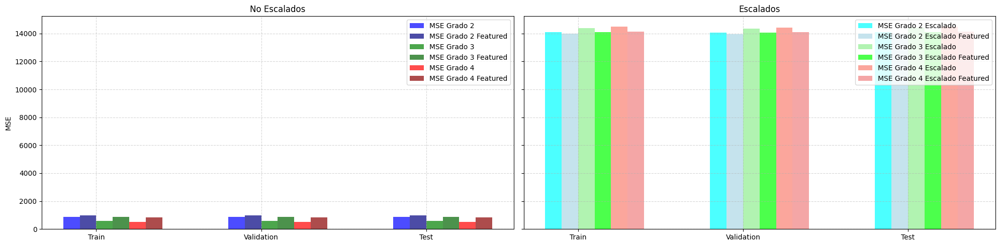

In [302]:
# Gráfico de barras MSE
import matplotlib.pyplot as plt

# Crear la figura y los subplots
fig, axes = plt.subplots(1, 2, figsize=(20, 5), sharey=True)

# Datos para el gráfico
labels = ['Train', 'Validation', 'Test']
mse_grado_2 = resultados_combinados_MSE.loc['MSE grado 2']
mse_grado_2_escalado = resultados_combinados_MSE.loc['MSE grado 2 escalado']
mse_grado_2_featured = resultados_combinados_MSE.loc['MSE grado 2 featured']
mse_grado_2_escalado_featured = resultados_combinados_MSE.loc['MSE grado 2 escalado featured']
mse_grado_3 = resultados_combinados_MSE.loc['MSE grado 3']
mse_grado_3_escalado = resultados_combinados_MSE.loc['MSE grado 3 escalado']
mse_grado_3_featured = resultados_combinados_MSE.loc['MSE grado 3 featured']
mse_grado_3_escalado_featured = resultados_combinados_MSE.loc['MSE grado 3 escalado featured']
mse_grado_4 = resultados_combinados_MSE.loc['MSE grado 4']
mse_grado_4_escalado = resultados_combinados_MSE.loc['MSE grado 4 escalado']
mse_grado_4_featured = resultados_combinados_MSE.loc['MSE grado 4 featured']
mse_grado_4_escalado_featured = resultados_combinados_MSE.loc['MSE grado 4 escalado featured']

# Configuración de las barras
x = range(len(labels))
width = 0.1

# Crear las barras para el subplot de no escalados
ax = axes[0]
ax.bar([p - 1.5 * width for p in x], mse_grado_2, width=width, label='MSE Grado 2', color='blue', alpha=0.7)
ax.bar([p - 0.5 * width for p in x], mse_grado_2_featured, width=width, label='MSE Grado 2 Featured', color='navy', alpha=0.7)
ax.bar([p + 0.5 * width for p in x], mse_grado_3, width=width, label='MSE Grado 3', color='green', alpha=0.7)
ax.bar([p + 1.5 * width for p in x], mse_grado_3_featured, width=width, label='MSE Grado 3 Featured', color='darkgreen', alpha=0.7)
ax.bar([p + 2.5 * width for p in x], mse_grado_4, width=width, label='MSE Grado 4', color='red', alpha=0.7)
ax.bar([p + 3.5 * width for p in x], mse_grado_4_featured, width=width, label='MSE Grado 4 Featured', color='darkred', alpha=0.7)

# Configuración del gráfico
ax.set_title('No Escalados')
ax.set_ylabel('MSE')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.grid(True, linestyle='--', alpha=0.5)
ax.legend()

# Crear las barras para el subplot de escalados
ax = axes[1]
ax.bar([p - 1.5 * width for p in x], mse_grado_2_escalado, width=width, label='MSE Grado 2 Escalado', color='cyan', alpha=0.7)
ax.bar([p - 0.5 * width for p in x], mse_grado_2_escalado_featured, width=width, label='MSE Grado 2 Escalado Featured', color='lightblue', alpha=0.7)
ax.bar([p + 0.5 * width for p in x], mse_grado_3_escalado, width=width, label='MSE Grado 3 Escalado', color='lightgreen', alpha=0.7)
ax.bar([p + 1.5 * width for p in x], mse_grado_3_escalado_featured, width=width, label='MSE Grado 3 Escalado Featured', color='lime', alpha=0.7)
ax.bar([p + 2.5 * width for p in x], mse_grado_4_escalado, width=width, label='MSE Grado 4 Escalado', color='salmon', alpha=0.7)
ax.bar([p + 3.5 * width for p in x], mse_grado_4_escalado_featured, width=width, label='MSE Grado 4 Escalado Featured', color='lightcoral', alpha=0.7)

# Configuración del gráfico
ax.set_title('Escalados')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.grid(True, linestyle='--', alpha=0.5)
ax.legend()

plt.tight_layout()
plt.show()



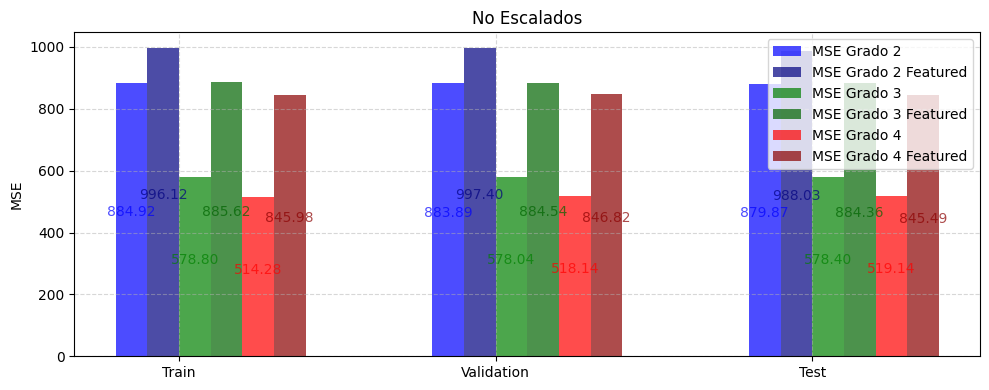

In [303]:
# Gráfico de barras MSE
import matplotlib.pyplot as plt

# Crear la figura y los subplots
fig, axes = plt.subplots(1, 1, figsize=(10, 4))

# Datos para el gráfico
labels = ['Train', 'Validation', 'Test']
mse_grado_2 = resultados_combinados_MSE.loc['MSE grado 2']
mse_grado_2_featured = resultados_combinados_MSE.loc['MSE grado 2 featured']
mse_grado_3 = resultados_combinados_MSE.loc['MSE grado 3']
mse_grado_3_featured = resultados_combinados_MSE.loc['MSE grado 3 featured']
mse_grado_4 = resultados_combinados_MSE.loc['MSE grado 4']
mse_grado_4_featured = resultados_combinados_MSE.loc['MSE grado 4 featured']

# Configuración de las barras
x = range(len(labels))
width = 0.1

# Crear las barras para el subplot de no escalados
ax = axes
ax.bar([p - 1.5 * width for p in x], mse_grado_2, width=width, label='MSE Grado 2', color='blue', alpha=0.7)
ax.bar([p - 0.5 * width for p in x], mse_grado_2_featured, width=width, label='MSE Grado 2 Featured', color='navy', alpha=0.7)
ax.bar([p + 0.5 * width for p in x], mse_grado_3, width=width, label='MSE Grado 3', color='green', alpha=0.7)
ax.bar([p + 1.5 * width for p in x], mse_grado_3_featured, width=width, label='MSE Grado 3 Featured', color='darkgreen', alpha=0.7)
ax.bar([p + 2.5 * width for p in x], mse_grado_4, width=width, label='MSE Grado 4', color='red', alpha=0.7)
ax.bar([p + 3.5 * width for p in x], mse_grado_4_featured, width=width, label='MSE Grado 4 Featured', color='darkred', alpha=0.7)

# Configuración del gráfico
ax.set_title('No Escalados')
ax.set_ylabel('MSE')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.grid(True, linestyle='--', alpha=0.5)
ax.legend()

# Añadir los valores numéricos en el medio de cada barra
for i in range(len(labels)):
    ax.text(i - 1.5 * width, mse_grado_2[i] / 2, f'{mse_grado_2[i]:.2f}', ha='center', va='bottom', color='blue', alpha=0.7)
    ax.text(i - 0.5 * width, mse_grado_2_featured[i] / 2, f'{mse_grado_2_featured[i]:.2f}', ha='center', va='bottom', color='navy', alpha=0.7)
    ax.text(i + 0.5 * width, mse_grado_3[i] / 2, f'{mse_grado_3[i]:.2f}', ha='center', va='bottom', color='green', alpha=0.7)
    ax.text(i + 1.5 * width, mse_grado_3_featured[i] / 2, f'{mse_grado_3_featured[i]:.2f}', ha='center', va='bottom', color='darkgreen', alpha=0.7)
    ax.text(i + 2.5 * width, mse_grado_4[i] / 2, f'{mse_grado_4[i]:.2f}', ha='center', va='bottom', color='red', alpha=0.7)
    ax.text(i + 3.5 * width, mse_grado_4_featured[i] / 2, f'{mse_grado_4_featured[i]:.2f}', ha='center', va='bottom', color='darkred', alpha=0.7)

plt.tight_layout()
plt.show()


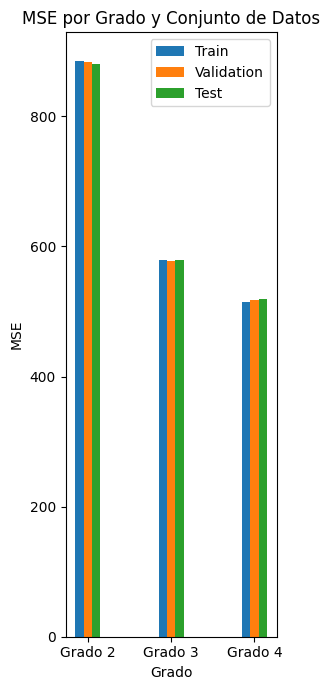

In [304]:
import numpy as np
import matplotlib.pyplot as plt

# Datos
grados = ['Grado 2', 'Grado 3', 'Grado 4']
conjunto_datos = ['Train', 'Validation', 'Test']
mse_train = [mse_train_polinomico_2, mse_train_polinomico_3, mse_train_polinomico_4]
mse_val = [mse_val_polinomico_2, mse_val_polinomico_3, mse_val_polinomico_4]
mse_test = [mse_test_polinomico_2, mse_test_polinomico_3, mse_test_polinomico_4]


# Configuración del gráfico
x = np.arange(len(grados))
width = 0.1


fig, ax = plt.subplots(figsize=(3, 7))

# Crear las barras
rects1 = ax.bar(x - width, mse_train, width, label='Train')
rects2 = ax.bar(x, mse_val, width, label='Validation')
rects3 = ax.bar(x + width, mse_test, width, label='Test')


# Añadir etiquetas y título
ax.set_xlabel('Grado')
ax.set_ylabel('MSE')
ax.set_title('MSE por Grado y Conjunto de Datos')
ax.set_xticks(x)
ax.set_xticklabels(grados)
ax.legend()

# Mostrar el gráfico
plt.tight_layout()
plt.show()

In [305]:
import pandas as pd

# Crear un DataFrame con los resultados de las métricas combinadas
resultados_combinados_R2 = pd.DataFrame({
    'Conjunto de Datos': ['Train', 'Validation', 'Test'],
    'R^2 grado 2': [r2_train_polinomico_2, r2_val_polinomico_2, r2_test_polinomico_2],
    'R^2 grado 2 featured': [r2_train_polinomico_2_featured, r2_val_polinomico_2_featured, r2_test_polinomico_2_featured],
    'R^3 grado 3': [r2_train_polinomico_3, r2_val_polinomico_3, r2_test_polinomico_3],
    'R^3 grado 3 featured': [r2_train_polinomico_3_featured, r2_val_polinomico_3_featured, r2_test_polinomico_3_featured],
    'R^2 grado 4': [r2_train_polinomico_4, r2_val_polinomico_4, r2_test_polinomico_4],
    'R^2 grado 4 featured': [r2_train_polinomico_4_featured, r2_val_polinomico_4_featured, r2_test_polinomico_4_featured],
    'R^2 grado 2 escalado': [r2_train_polinomico_2_scaled, r2_val_polinomico_2_scaled, r2_test_polinomico_2_scaled],
    'R^3 grado 3 escalado': [r2_train_polinomico_3_scaled, r2_val_polinomico_3_scaled, r2_test_polinomico_3_scaled],
    'R^2 grado 4 escalado': [r2_train_polinomico_4_scaled, r2_val_polinomico_4_scaled, r2_test_polinomico_4_scaled],
    'R^2 grado 2 escalado featured': [r2_train_polinomico_2_scaled_featured, r2_val_polinomico_2_scaled_featured, r2_test_polinomico_2_scaled_featured],
    'R^3 grado 3 escalado featured': [r2_train_polinomico_3_scaled_featured, r2_val_polinomico_3_scaled_featured, r2_test_polinomico_3_scaled_featured],
    'R^2 grado 4 escalado featured': [r2_train_polinomico_4_scaled_featured, r2_val_polinomico_4_scaled_featured, r2_test_polinomico_4_scaled_featured]
})

#Transponer columnas
resultados_combinados_R2 = resultados_combinados_R2.T
# Mostrar la tabla de resultados combinados
resultados_combinados_R2

,0,1,2
Conjunto de Datos,Train,Validation,Test
R^2 grado 2,0.792711,0.792225,0.793701
R^2 grado 2 featured,0.76042,0.759846,0.762454
R^3 grado 3,0.873346,0.873336,0.873568
R^3 grado 3 featured,0.79251,0.792372,0.793024
R^2 grado 4,0.890138,0.888896,0.889336
R^2 grado 4 featured,0.803744,0.803159,0.803796
R^2 grado 2 escalado,-2.276828,0.79526,-2.276296
R^3 grado 3 escalado,-2.122929,0.875159,-2.119452
R^2 grado 4 escalado,-2.080737,0.896039,-2.076106


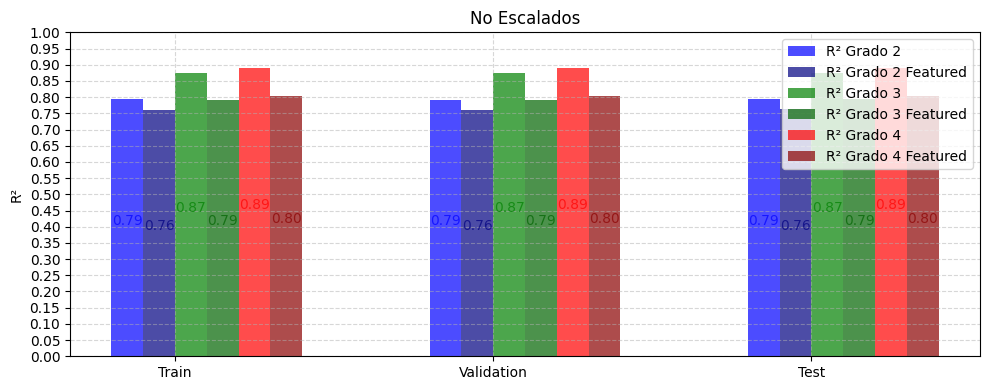

In [306]:
# Gráfico de barras R²
import matplotlib.pyplot as plt

# Crear la figura y los subplots
fig, axes = plt.subplots(1, 1, figsize=(10, 4))

# Datos para el gráfico
labels = ['Train', 'Validation', 'Test']
r2_grado_2 = resultados_combinados_R2.loc['R^2 grado 2']
r2_grado_2_featured = resultados_combinados_R2.loc['R^2 grado 2 featured']
r2_grado_3 = resultados_combinados_R2.loc['R^3 grado 3']
r2_grado_3_featured = resultados_combinados_R2.loc['R^3 grado 3 featured']
r2_grado_4 = resultados_combinados_R2.loc['R^2 grado 4']
r2_grado_4_featured = resultados_combinados_R2.loc['R^2 grado 4 featured']

# Configuración de las barras
x = range(len(labels))
width = 0.1

# Crear las barras para el subplot de no escalados
ax = axes
ax.bar([p - 1.5 * width for p in x], r2_grado_2, width=width, label='R² Grado 2', color='blue', alpha=0.7)
ax.bar([p - 0.5 * width for p in x], r2_grado_2_featured, width=width, label='R² Grado 2 Featured', color='navy', alpha=0.7)
ax.bar([p + 0.5 * width for p in x], r2_grado_3, width=width, label='R² Grado 3', color='green', alpha=0.7)
ax.bar([p + 1.5 * width for p in x], r2_grado_3_featured, width=width, label='R² Grado 3 Featured', color='darkgreen', alpha=0.7)
ax.bar([p + 2.5 * width for p in x], r2_grado_4, width=width, label='R² Grado 4', color='red', alpha=0.7)
ax.bar([p + 3.5 * width for p in x], r2_grado_4_featured, width=width, label='R² Grado 4 Featured', color='darkred', alpha=0.7)

# Configuración del gráfico
ax.set_title('No Escalados')
ax.set_ylabel('R²')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.grid(True, linestyle='--', alpha=0.5)
ax.set_ylim(top=1)
ax.set_yticks(np.arange(0, 1.05, 0.05))
ax.legend()

# Añadir los valores numéricos en el medio de cada barra
for i in range(len(labels)):
    ax.text(i - 1.5 * width, r2_grado_2[i] / 2, f'{r2_grado_2[i]:.2f}', ha='center', va='bottom', color='blue', alpha=0.7)
    ax.text(i - 0.5 * width, r2_grado_2_featured[i] / 2, f'{r2_grado_2_featured[i]:.2f}', ha='center', va='bottom', color='navy', alpha=0.7)
    ax.text(i + 0.5 * width, r2_grado_3[i] / 2, f'{r2_grado_3[i]:.2f}', ha='center', va='bottom', color='green', alpha=0.7)
    ax.text(i + 1.5 * width, r2_grado_3_featured[i] / 2, f'{r2_grado_3_featured[i]:.2f}', ha='center', va='bottom', color='darkgreen', alpha=0.7)
    ax.text(i + 2.5 * width, r2_grado_4[i] / 2, f'{r2_grado_4[i]:.2f}', ha='center', va='bottom', color='red', alpha=0.7)
    ax.text(i + 3.5 * width, r2_grado_4_featured[i] / 2, f'{r2_grado_4_featured[i]:.2f}', ha='center', va='bottom', color='darkred', alpha=0.7)


plt.tight_layout()
plt.show()

In [307]:
import pandas as pd

# Crear un DataFrame con los resultados de las métricas combinadas
resultados_combinados_MAE = pd.DataFrame({
    'Conjunto de Datos': ['Train', 'Validation', 'Test'],
    'MAE grado 2': [mae_train_polinomico_2, mae_val_polinomico_2, mae_test_polinomico_2],
    'MAE grado 3': [mae_train_polinomico_3, mae_val_polinomico_3, mae_test_polinomico_3],
    'MAE grado 4': [mae_train_polinomico_4, mae_val_polinomico_4, mae_test_polinomico_4],
    'MAE grado 2 featured': [mae_train_polinomico_2_featured, mae_val_polinomico_2_featured, mae_test_polinomico_2_featured],
    'MAE grado 3 featured': [mae_train_polinomico_3_featured, mae_val_polinomico_3_featured, mae_test_polinomico_3_featured],
    'MAE grado 4 featured': [mae_train_polinomico_4_featured, mae_val_polinomico_4_featured, mae_test_polinomico_4_featured],
    'MAE grado 2 escalado': [mae_train_polinomico_2_scaled, mae_val_polinomico_2_scaled, mae_test_polinomico_2_scaled],
    'MAE grado 3 escalado': [mae_train_polinomico_3_scaled, mae_val_polinomico_3_scaled, mae_test_polinomico_3_scaled],
    'MAE grado 4 escalado': [mae_train_polinomico_4_scaled, mae_val_polinomico_4_scaled, mae_test_polinomico_4_scaled],
    'MAE grado 2 escalado featured': [mae_train_polinomico_2_scaled_featured, mae_val_polinomico_2_scaled_featured, mae_test_polinomico_2_scaled_featured],
    'MAE grado 3 escalado featured': [mae_train_polinomico_3_scaled_featured, mae_val_polinomico_3_scaled_featured, mae_test_polinomico_3_scaled_featured],
    'MAE grado 4 escalado featured': [mae_train_polinomico_4_scaled_featured, mae_val_polinomico_4_scaled_featured, mae_test_polinomico_4_scaled_featured]
})

#Transponer columnas
resultados_combinados_MAE = resultados_combinados_MAE.T
# Mostrar la tabla de resultados combinados
resultados_combinados_MAE

,0,1,2
Conjunto de Datos,Train,Validation,Test
MAE grado 2,20.820317,20.808286,20.790702
MAE grado 3,14.582049,14.558835,14.588911
MAE grado 4,13.287943,13.316217,13.360234
MAE grado 2 featured,21.870064,21.909968,21.822028
MAE grado 3 featured,20.277513,20.253447,20.279787
MAE grado 4 featured,19.598347,19.620494,19.640869
MAE grado 2 escalado,101.345404,101.138591,101.346009
MAE grado 3 escalado,99.674755,99.405145,99.698769
MAE grado 4 escalado,99.595302,99.35179,99.651761


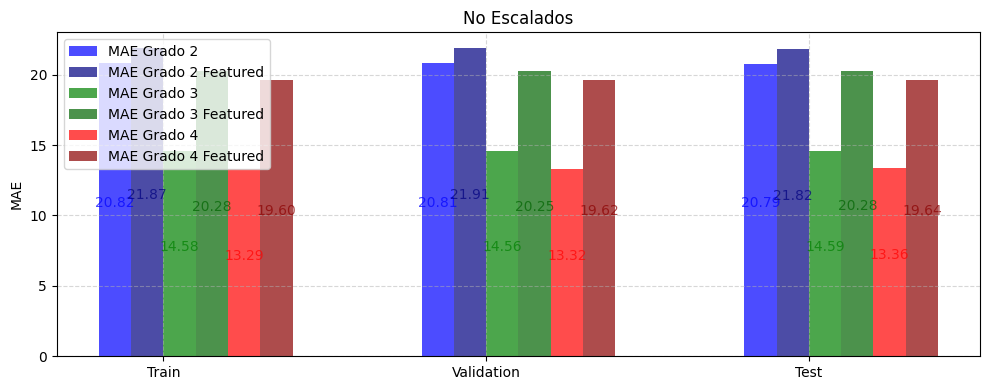

In [308]:
# Gráfico de barras MAE
import matplotlib.pyplot as plt

# Crear la figura y los subplots
fig, axes = plt.subplots(1, 1, figsize=(10, 4))

# Datos para el gráfico
labels = ['Train', 'Validation', 'Test']
mae_grado_2 = resultados_combinados_MAE.loc['MAE grado 2']
mae_grado_2_featured = resultados_combinados_MAE.loc['MAE grado 2 featured']
mae_grado_3 = resultados_combinados_MAE.loc['MAE grado 3']
mae_grado_3_featured = resultados_combinados_MAE.loc['MAE grado 3 featured']
mae_grado_4 = resultados_combinados_MAE.loc['MAE grado 4']
mae_grado_4_featured = resultados_combinados_MAE.loc['MAE grado 4 featured']

# Configuración de las barras
x = range(len(labels))
width = 0.1

# Crear las barras para el subplot de no escalados
ax = axes
ax.bar([p - 1.5 * width for p in x], mae_grado_2, width=width, label='MAE Grado 2', color='blue', alpha=0.7)
ax.bar([p - 0.5 * width for p in x], mae_grado_2_featured, width=width, label='MAE Grado 2 Featured', color='navy', alpha=0.7)
ax.bar([p + 0.5 * width for p in x], mae_grado_3, width=width, label='MAE Grado 3', color='green', alpha=0.7)
ax.bar([p + 1.5 * width for p in x], mae_grado_3_featured, width=width, label='MAE Grado 3 Featured', color='darkgreen', alpha=0.7)
ax.bar([p + 2.5 * width for p in x], mae_grado_4, width=width, label='MAE Grado 4', color='red', alpha=0.7)
ax.bar([p + 3.5 * width for p in x], mae_grado_4_featured, width=width, label='MAE Grado 4 Featured', color='darkred', alpha=0.7)

# Configuración del gráfico
ax.set_title('No Escalados')
ax.set_ylabel('MAE')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.grid(True, linestyle='--', alpha=0.5)
ax.legend()

# Añadir los valores numéricos en el medio de cada barra
for i in range(len(labels)):
    ax.text(i - 1.5 * width, mae_grado_2[i] / 2, f'{mae_grado_2[i]:.2f}', ha='center', va='bottom', color='blue', alpha=0.7)
    ax.text(i - 0.5 * width, mae_grado_2_featured[i] / 2, f'{mae_grado_2_featured[i]:.2f}', ha='center', va='bottom', color='navy', alpha=0.7)
    ax.text(i + 0.5 * width, mae_grado_3[i] / 2, f'{mae_grado_3[i]:.2f}', ha='center', va='bottom', color='green', alpha=0.7)
    ax.text(i + 1.5 * width, mae_grado_3_featured[i] / 2, f'{mae_grado_3_featured[i]:.2f}', ha='center', va='bottom', color='darkgreen', alpha=0.7)
    ax.text(i + 2.5 * width, mae_grado_4[i] / 2, f'{mae_grado_4[i]:.2f}', ha='center', va='bottom', color='red', alpha=0.7)
    ax.text(i + 3.5 * width, mae_grado_4_featured[i] / 2, f'{mae_grado_4_featured[i]:.2f}', ha='center', va='bottom', color='darkred', alpha=0.7)

plt.tight_layout()
plt.show()


    

In [309]:
import pandas as pd

# Crear un DataFrame con los resultados de las métricas combinadas
resultados_combinados_ordenados = pd.DataFrame({
    'Conjunto de Datos': ['Train', 'Validation', 'Test'],
    'MSE grado 4': [mse_train_polinomico_4, mse_val_polinomico_4, mse_test_polinomico_4],
    'MSE grado 3': [mse_train_polinomico_3, mse_val_polinomico_3, mse_test_polinomico_3],
    'MSE grado 2': [mse_train_polinomico_2, mse_val_polinomico_2, mse_test_polinomico_2],
    'MSE grado 4 featured': [mse_train_polinomico_4_featured, mse_val_polinomico_4_featured, mse_test_polinomico_4_featured],
    'MSE grado 3 featured': [mse_train_polinomico_3_featured, mse_val_polinomico_3_featured, mse_test_polinomico_3_featured],
    'MSE grado 2 featured': [mse_train_polinomico_2_featured, mse_val_polinomico_2_featured, mse_test_polinomico_2_featured],
    'MSE grado 3 escalado': [mse_train_polinomico_3_scaled, mse_val_polinomico_3_scaled, mse_test_polinomico_3_scaled],
    'MSE grado 2 escalado featured': [mse_train_polinomico_2_scaled_featured, mse_val_polinomico_2_scaled_featured, mse_test_polinomico_2_scaled_featured],
    'MSE grado 3 escalado featured': [mse_train_polinomico_3_scaled_featured, mse_val_polinomico_3_scaled_featured, mse_test_polinomico_3_scaled_featured],
    'MSE grado 2 escalado': [mse_train_polinomico_2_scaled, mse_val_polinomico_2_scaled, mse_test_polinomico_2_scaled],
    'MSE grado 4 escalado featured': [mse_train_polinomico_4_scaled_featured, mse_val_polinomico_4_scaled_featured, mse_test_polinomico_4_scaled_featured],
    'MSE grado 4 escalado': [mse_train_polinomico_4_scaled, mse_val_polinomico_4_scaled, mse_test_polinomico_4_scaled],
    
    'R^2 grado 4': [r2_train_polinomico_4, r2_val_polinomico_4, r2_test_polinomico_4],
    'R^3 grado 3': [r2_train_polinomico_3, r2_val_polinomico_3, r2_test_polinomico_3],
    'R^2 grado 2': [r2_train_polinomico_2, r2_val_polinomico_2, r2_test_polinomico_2],
    'R^2 grado 4 featured': [r2_train_polinomico_4_featured, r2_val_polinomico_4_featured, r2_test_polinomico_4_featured],
    'R^3 grado 3 featured': [r2_train_polinomico_3_featured, r2_val_polinomico_3_featured, r2_test_polinomico_3_featured],
    'R^2 grado 2 featured': [r2_train_polinomico_2_featured, r2_val_polinomico_2_featured, r2_test_polinomico_2_featured],
    'R^2 grado 4 escalado': [r2_train_polinomico_4_scaled, r2_val_polinomico_4_scaled, r2_test_polinomico_4_scaled],
    'R^3 grado 3 escalado': [r2_train_polinomico_3_scaled, r2_val_polinomico_3_scaled, r2_test_polinomico_3_scaled],
    'R^2 grado 4 escalado featured': [r2_train_polinomico_4_scaled_featured, r2_val_polinomico_4_scaled_featured, r2_test_polinomico_4_scaled_featured],
    'R^2 grado 2 escalado': [r2_train_polinomico_2_scaled, r2_val_polinomico_2_scaled, r2_test_polinomico_2_scaled],
    'R^3 grado 3 escalado featured': [r2_train_polinomico_3_scaled_featured, r2_val_polinomico_3_scaled_featured, r2_test_polinomico_3_scaled_featured],
    'R^2 grado 2 escalado featured': [r2_train_polinomico_2_scaled_featured, r2_val_polinomico_2_scaled_featured, r2_test_polinomico_2_scaled_featured],
    
    'MAE grado 4': [mae_train_polinomico_4, mae_val_polinomico_4, mae_test_polinomico_4],
    'MAE grado 3': [mae_train_polinomico_3, mae_val_polinomico_3, mae_test_polinomico_3],
    'MAE grado 4 featured': [mae_train_polinomico_4_featured, mae_val_polinomico_4_featured, mae_test_polinomico_4_featured],
    'MAE grado 3 featured': [mae_train_polinomico_3_featured, mae_val_polinomico_3_featured, mae_test_polinomico_3_featured],
    'MAE grado 2': [mae_train_polinomico_2, mae_val_polinomico_2, mae_test_polinomico_2],
    'MAE grado 2 featured': [mae_train_polinomico_2_featured, mae_val_polinomico_2_featured, mae_test_polinomico_2_featured],
    'MAE grado 4 escalado': [mae_train_polinomico_4_scaled, mae_val_polinomico_4_scaled, mae_test_polinomico_4_scaled],
    'MAE grado 3 escalado': [mae_train_polinomico_3_scaled, mae_val_polinomico_3_scaled, mae_test_polinomico_3_scaled],
    'MAE grado 4 escalado featured': [mae_train_polinomico_4_scaled_featured, mae_val_polinomico_4_scaled_featured, mae_test_polinomico_4_scaled_featured],
    'MAE grado 3 escalado featured': [mae_train_polinomico_3_scaled_featured, mae_val_polinomico_3_scaled_featured, mae_test_polinomico_3_scaled_featured],
    'MAE grado 2 escalado featured': [mae_train_polinomico_2_scaled_featured, mae_val_polinomico_2_scaled_featured, mae_test_polinomico_2_scaled_featured],
    'MAE grado 2 escalado': [mae_train_polinomico_2_scaled, mae_val_polinomico_2_scaled, mae_test_polinomico_2_scaled]

})

#Transponer columnas
resultados_combinados_ordenados = resultados_combinados_ordenados.T
# Mostrar la tabla de resultados combinados
resultados_combinados_ordenados

,0,1,2
Conjunto de Datos,Train,Validation,Test
MSE grado 4,514.283405,518.143392,519.141096
MSE grado 3,578.796568,578.043264,578.399921
MSE grado 2,884.915934,883.889096,879.868707
MSE grado 4 featured,845.984445,846.818495,845.493148
MSE grado 3 featured,885.623688,884.53987,884.357415
MSE grado 2 featured,996.12304,997.396765,988.030936
MSE grado 3 escalado,14395.01516,14350.49397,14406.55509
MSE grado 2 escalado featured,13979.539163,13964.623575,13980.438994
MSE grado 3 escalado featured,14089.220115,14068.458072,14094.289957


In [310]:
import pandas as pd

# Crear un DataFrame con los resultados de las métricas combinadas
resultados_combinados_ordenados_MSE = pd.DataFrame({
    'Conjunto de Datos': ['Train', 'Validation', 'Test'],
    'MSE grado 4': [mse_train_polinomico_4, mse_val_polinomico_4, mse_test_polinomico_4],
    'MSE grado 3': [mse_train_polinomico_3, mse_val_polinomico_3, mse_test_polinomico_3],
    'MSE grado 2': [mse_train_polinomico_2, mse_val_polinomico_2, mse_test_polinomico_2],
    'MSE grado 4 featured': [mse_train_polinomico_4_featured, mse_val_polinomico_4_featured, mse_test_polinomico_4_featured],
    'MSE grado 3 featured': [mse_train_polinomico_3_featured, mse_val_polinomico_3_featured, mse_test_polinomico_3_featured],
    'MSE grado 2 featured': [mse_train_polinomico_2_featured, mse_val_polinomico_2_featured, mse_test_polinomico_2_featured],
    'MSE grado 3 escalado': [mse_train_polinomico_3_scaled, mse_val_polinomico_3_scaled, mse_test_polinomico_3_scaled],
    'MSE grado 2 escalado featured': [mse_train_polinomico_2_scaled_featured, mse_val_polinomico_2_scaled_featured, mse_test_polinomico_2_scaled_featured],
    'MSE grado 3 escalado featured': [mse_train_polinomico_3_scaled_featured, mse_val_polinomico_3_scaled_featured, mse_test_polinomico_3_scaled_featured],
    'MSE grado 2 escalado': [mse_train_polinomico_2_scaled, mse_val_polinomico_2_scaled, mse_test_polinomico_2_scaled],
    'MSE grado 4 escalado featured': [mse_train_polinomico_4_scaled_featured, mse_val_polinomico_4_scaled_featured, mse_test_polinomico_4_scaled_featured],
    'MSE grado 4 escalado': [mse_train_polinomico_4_scaled, mse_val_polinomico_4_scaled, mse_test_polinomico_4_scaled],
    
})

#Transponer columnas
resultados_combinados_ordenados_MSE = resultados_combinados_ordenados_MSE.T
# Mostrar la tabla de resultados combinados
resultados_combinados_ordenados_MSE

,0,1,2
Conjunto de Datos,Train,Validation,Test
MSE grado 4,514.283405,518.143392,519.141096
MSE grado 3,578.796568,578.043264,578.399921
MSE grado 2,884.915934,883.889096,879.868707
MSE grado 4 featured,845.984445,846.818495,845.493148
MSE grado 3 featured,885.623688,884.53987,884.357415
MSE grado 2 featured,996.12304,997.396765,988.030936
MSE grado 3 escalado,14395.01516,14350.49397,14406.55509
MSE grado 2 escalado featured,13979.539163,13964.623575,13980.438994
MSE grado 3 escalado featured,14089.220115,14068.458072,14094.289957


In [311]:
import pandas as pd

# Crear un DataFrame con los resultados de las métricas combinadas
resultados_combinados_ordenados_R2 = pd.DataFrame({
    'Conjunto de Datos': ['Train', 'Validation', 'Test'],

    'R^2 grado 4': [r2_train_polinomico_4, r2_val_polinomico_4, r2_test_polinomico_4],
    'R^3 grado 3': [r2_train_polinomico_3, r2_val_polinomico_3, r2_test_polinomico_3],
    'R^2 grado 2': [r2_train_polinomico_2, r2_val_polinomico_2, r2_test_polinomico_2],
    'R^2 grado 4 featured': [r2_train_polinomico_4_featured, r2_val_polinomico_4_featured, r2_test_polinomico_4_featured],
    'R^3 grado 3 featured': [r2_train_polinomico_3_featured, r2_val_polinomico_3_featured, r2_test_polinomico_3_featured],
    'R^2 grado 2 featured': [r2_train_polinomico_2_featured, r2_val_polinomico_2_featured, r2_test_polinomico_2_featured],
    'R^2 grado 4 escalado': [r2_train_polinomico_4_scaled, r2_val_polinomico_4_scaled, r2_test_polinomico_4_scaled],
    'R^3 grado 3 escalado': [r2_train_polinomico_3_scaled, r2_val_polinomico_3_scaled, r2_test_polinomico_3_scaled],
    'R^2 grado 4 escalado featured': [r2_train_polinomico_4_scaled_featured, r2_val_polinomico_4_scaled_featured, r2_test_polinomico_4_scaled_featured],
    'R^2 grado 2 escalado': [r2_train_polinomico_2_scaled, r2_val_polinomico_2_scaled, r2_test_polinomico_2_scaled],
    'R^3 grado 3 escalado featured': [r2_train_polinomico_3_scaled_featured, r2_val_polinomico_3_scaled_featured, r2_test_polinomico_3_scaled_featured],
    'R^2 grado 2 escalado featured': [r2_train_polinomico_2_scaled_featured, r2_val_polinomico_2_scaled_featured, r2_test_polinomico_2_scaled_featured],


})

#Transponer columnas
resultados_combinados_ordenados_R2 = resultados_combinados_ordenados_R2.T
# Mostrar la tabla de resultados combinados
resultados_combinados_ordenados_R2

,0,1,2
Conjunto de Datos,Train,Validation,Test
R^2 grado 4,0.890138,0.888896,0.889336
R^3 grado 3,0.873346,0.873336,0.873568
R^2 grado 2,0.792711,0.792225,0.793701
R^2 grado 4 featured,0.803744,0.803159,0.803796
R^3 grado 3 featured,0.79251,0.792372,0.793024
R^2 grado 2 featured,0.76042,0.759846,0.762454
R^2 grado 4 escalado,-2.080737,0.896039,-2.076106
R^3 grado 3 escalado,-2.122929,0.875159,-2.119452
R^2 grado 4 escalado featured,-2.255574,-2.226671,-2.248174


In [312]:
import pandas as pd

# Crear un DataFrame con los resultados de las métricas combinadas
resultados_combinados_ordenados_MAE = pd.DataFrame({
    'Conjunto de Datos': ['Train', 'Validation', 'Test'],

    'MAE grado 4': [mae_train_polinomico_4, mae_val_polinomico_4, mae_test_polinomico_4],
    'MAE grado 3': [mae_train_polinomico_3, mae_val_polinomico_3, mae_test_polinomico_3],
    'MAE grado 4 featured': [mae_train_polinomico_4_featured, mae_val_polinomico_4_featured, mae_test_polinomico_4_featured],
    'MAE grado 3 featured': [mae_train_polinomico_3_featured, mae_val_polinomico_3_featured, mae_test_polinomico_3_featured],
    'MAE grado 2': [mae_train_polinomico_2, mae_val_polinomico_2, mae_test_polinomico_2],
    'MAE grado 2 featured': [mae_train_polinomico_2_featured, mae_val_polinomico_2_featured, mae_test_polinomico_2_featured],
    'MAE grado 4 escalado': [mae_train_polinomico_4_scaled, mae_val_polinomico_4_scaled, mae_test_polinomico_4_scaled],
    'MAE grado 3 escalado': [mae_train_polinomico_3_scaled, mae_val_polinomico_3_scaled, mae_test_polinomico_3_scaled],
    'MAE grado 4 escalado featured': [mae_train_polinomico_4_scaled_featured, mae_val_polinomico_4_scaled_featured, mae_test_polinomico_4_scaled_featured],
    'MAE grado 3 escalado featured': [mae_train_polinomico_3_scaled_featured, mae_val_polinomico_3_scaled_featured, mae_test_polinomico_3_scaled_featured],
    'MAE grado 2 escalado featured': [mae_train_polinomico_2_scaled_featured, mae_val_polinomico_2_scaled_featured, mae_test_polinomico_2_scaled_featured],
    'MAE grado 2 escalado': [mae_train_polinomico_2_scaled, mae_val_polinomico_2_scaled, mae_test_polinomico_2_scaled]

})

#Transponer columnas
resultados_combinados_ordenados_MAE = resultados_combinados_ordenados_MAE.T
# Mostrar la tabla de resultados combinados
resultados_combinados_ordenados_MAE

,0,1,2
Conjunto de Datos,Train,Validation,Test
MAE grado 4,13.287943,13.316217,13.360234
MAE grado 3,14.582049,14.558835,14.588911
MAE grado 4 featured,19.598347,19.620494,19.640869
MAE grado 3 featured,20.277513,20.253447,20.279787
MAE grado 2,20.820317,20.808286,20.790702
MAE grado 2 featured,21.870064,21.909968,21.822028
MAE grado 4 escalado,99.595302,99.35179,99.651761
MAE grado 3 escalado,99.674755,99.405145,99.698769
MAE grado 4 escalado featured,99.952342,99.781481,99.930387
